# GeoPotential

In [1]:
import sys
sys.path.append('../src/')
from modeling.utils.data import *
from modeling.utils.plotting import *
from modeling.utils.config import *
%load_ext autoreload
%autoreload 2

In [2]:
freq = 'daily'
months = 'MayJunJulAugSep'
obs_years = '1979-2021'
LAT, LONG = (20.,80.), (-90., 30.)
G = 9.80665
READ_PATH = 'P:\\CH\\Weather Data\\ERA-5\\GEOPOTENTIAL'

In [3]:
daily = read_nc(READ_PATH + '/ERA-5_{}_Geopotential-500hPa_{}_{}.nc'.format(freq, months, obs_years))
daily

	func:'read_nc' took: 0.4798 sec


<xarray.Dataset>
Dimensions:    (expver: 2, latitude: 241, longitude: 481, time: 6579)
Coordinates:
  * longitude  (longitude) float32 -90.0 -89.75 -89.5 -89.25 ... 29.5 29.75 30.0
  * latitude   (latitude) float32 80.0 79.75 79.5 79.25 ... 20.5 20.25 20.0
  * expver     (expver) int32 1 5
  * time       (time) datetime64[ns] 1979-05-01 1979-05-02 ... 2021-09-30
Data variables:
    z          (time, expver, latitude, longitude) float32 ...

In [ ]:
daily = daily.where(np.logical_or(
                    daily['time.month'].isin([6,7,8]),
                    np.logical_or(
                        np.logical_and(daily['time.month'] == 5, daily['time.day'] >= 15),
                        np.logical_and(daily['time.month'] == 9, daily['time.day'] <= 15)
                    )),
                    drop = True)
daily

In [4]:
daily = daily.sel(time = daily['time.month'].isin([6,7,8]))
daily

<xarray.Dataset>
Dimensions:    (expver: 2, latitude: 241, longitude: 481, time: 3956)
Coordinates:
  * longitude  (longitude) float32 -90.0 -89.75 -89.5 -89.25 ... 29.5 29.75 30.0
  * latitude   (latitude) float32 80.0 79.75 79.5 79.25 ... 20.5 20.25 20.0
  * expver     (expver) int32 1 5
  * time       (time) datetime64[ns] 1979-06-01 1979-06-02 ... 2021-08-31
Data variables:
    z          (time, expver, latitude, longitude) float32 ...

In [5]:
dt = xr.concat([daily.sel(time = slice("2021-07-31"), expver = 1),
                daily.sel(time = slice("2021-08-01", "2021-09-30"), expver = 5)],
                dim = "time")
dt = limit_geography(dt, LAT, LONG)
dt = dt / G

	func:'limit_geography' took: 4.8880 sec


In [6]:
#normal_dt = evaluate_normal(dt, domain='local', mode='flat', start_date = "01-01-1991")
#normal_dt = evaluate_normal(dt, domain ='local', mode ='dynamic', freq = 'm', start_date = "01-01-1991")
normal_dt = evaluate_normal(dt, domain ='local', mode ='dynamic', freq = 'w', start_date = "01-01-1991")

c:\python36\lib\site-packages\xarray\core\accessor_dt.py:379: FutureWarning:

dt.weekofyear and dt.week have been deprecated. Please use dt.isocalendar().week instead.



	func:'evaluate_normal' took: 2.7207 sec


In [ ]:
locations = {
    "Oslo":(59.91, 10.76),
    "Paris": (48.86, 2.35),
    "Rome": (41.89, 12.51)
}
plot_normal(dt, locations, freq = 'm')

In [7]:
#anomaly_dt = evaluate_anomaly(dt, normal_dt, mode='flat')
#anomaly_dt = evaluate_anomaly(dt.sel(time = slice(None, "31-12-2016")), normal_dt, mode='flat')
#anomaly_dt = evaluate_anomaly(dt.sel(time = slice(None, "31-12-2016")), normal_dt, mode='dynamic', freq = 'm')
#anomaly_dt = evaluate_anomaly(dt, normal_dt, mode='dynamic', freq = 'm')
anomaly_dt = evaluate_anomaly(dt, normal_dt, mode='dynamic', freq = 'w')
#to_nc(anomaly_dt, variable='anomaly')

c:\python36\lib\site-packages\xarray\core\accessor_dt.py:379: FutureWarning:

dt.weekofyear and dt.week have been deprecated. Please use dt.isocalendar().week instead.



	func:'evaluate_anomaly' took: 4.2606 sec


In [8]:
ds = weighted_anomaly(anomaly_dt)
#to_nc(ds, variable = 'weighted_anomaly')

	func:'weighted_anomaly' took: 3.0957 sec


In [ ]:
for index in np.unique(ds.time.values):
    save_anomalies(ds.sel(time = index),
                   title = "W:/UK/Research/Private/WEATHER/STAGE_ABALDO/imgs/anomalies_img_weighted/anomaly_{}.png".\
                   format(index.astype('M8[D]').astype('O'), "%Y-%m-%d"))

In [9]:
pivot_anomaly = flat_table(ds)

	func:'flat_table' took: 0.9235 sec


In [13]:
eofs, pcs = eofs(pivot_anomaly)

	func:'eofs' took: 322.4524 sec


In [21]:
#reduced_anomaly = reduce_dim(pivot_anomaly, method='PCA', exp_variance=0.9)
reduced_anomaly = reduce_dim(pivot_anomaly, method='PCA', exp_variance=5)

Number of days: 3956, Density of the grid: 5 cells
	func:'reduce_dim' took: 7.1349 sec


In [10]:
reduced_anomaly = reduce_dim(ds, method='VAE', season = 'SUMMER', model = 'sigma_vae_statedict_5')

Processing batch 16Number of days: 3956, Density of the grid: 5 cells
	func:'reduce_dim' took: 632.1516 sec


In [11]:
for model in ['kmeans','bayesian_gmm','gmm']:
    for scoring in  ["score", "ch", "bic", "silhouette"]:
        estimator = cross_val(reduced_anomaly.values, method = model, scoring = scoring, season = "SUMMER", folder = 'vae_3months')

	Combination 1 score: -2388530432.000
	Combination 2 score: -2384807116.800
	Combination 3 score: -2388689305.600
	Combination 4 score: -2386334873.600
	Combination 5 score: -2388731801.600
	Combination 6 score: -2385894707.200
	Combination 7 score: -2388530483.200
	Combination 8 score: -2388731750.400
	Combination 9 score: -2388689254.400
	Combination 10 score: -2388825344.000
	Combination 11 score: -2388886067.200
	Combination 12 score: -2388890880.000
	Combination 13 score: -2388825344.000
	Combination 14 score: -2384959436.800
	Combination 15 score: -2388890931.200
	Combination 16 score: -2388825497.600
	Combination 17 score: -2388886016.000
	Combination 18 score: -2388890931.200
	Combination 19 score: -2388304588.800
	Combination 20 score: -2385400473.600
	Combination 21 score: -2385400524.800
	Combination 22 score: -2384881100.800
	Combination 23 score: -2388566835.200
	Combination 24 score: -2379317657.600
	Combination 25 score: -2385618739.200
	Combination 26 score: -2385996134

	Combination 73 score: 140.754
	Combination 74 score: 140.562
	Combination 75 score: 140.562
	Combination 76 score: 140.754
	Combination 77 score: 140.562
	Combination 78 score: 140.562
	Combination 79 score: 140.754
	Combination 80 score: 140.562
	Combination 81 score: 140.562
	Combination 82 score: 139.886
	Combination 83 score: 139.934
	Combination 84 score: 139.934
	Combination 85 score: 139.886
	Combination 86 score: 139.934
	Combination 87 score: 139.934
	Combination 88 score: 139.886
	Combination 89 score: 139.934
	Combination 90 score: 139.934
	Combination 91 score: 140.620
	Combination 92 score: 140.326
	Combination 93 score: 140.413
	Combination 94 score: 140.620
	Combination 95 score: 140.326
	Combination 96 score: 140.413
	Combination 97 score: 140.620
	Combination 98 score: 140.326
	Combination 99 score: 140.413
	Combination 100 score: 139.310
	Combination 101 score: 139.937
	Combination 102 score: 139.937
	Combination 103 score: 139.310
	Combination 104 score: 139.937
	Co

	Combination 13 score: 0.169
	Combination 14 score: 0.170
	Combination 15 score: 0.170
	Combination 16 score: 0.169
	Combination 17 score: 0.170
	Combination 18 score: 0.170
	Combination 19 score: 0.170
	Combination 20 score: 0.170
	Combination 21 score: 0.170
	Combination 22 score: 0.170
	Combination 23 score: 0.170
	Combination 24 score: 0.170
	Combination 25 score: 0.170
	Combination 26 score: 0.170
	Combination 27 score: 0.170
	Combination 28 score: 0.170
	Combination 29 score: 0.170
	Combination 30 score: 0.170
	Combination 31 score: 0.170
	Combination 32 score: 0.170
	Combination 33 score: 0.170
	Combination 34 score: 0.170
	Combination 35 score: 0.170
	Combination 36 score: 0.170
	Combination 37 score: 0.157
	Combination 38 score: 0.157
	Combination 39 score: 0.157
	Combination 40 score: 0.157
	Combination 41 score: 0.157
	Combination 42 score: 0.157
	Combination 43 score: 0.157
	Combination 44 score: 0.157
	Combination 45 score: 0.157
	Combination 46 score: 0.157
	Combination 4

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 3 score: -41.279
	Combination 4 score: -41.313
	Combination 5 score: -41.363
	Combination 6 score: -41.334


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 7 score: -41.278


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 8 score: -41.351
	Combination 9 score: -41.308
	Combination 10 score: -41.300
	Combination 11 score: -41.448
	Combination 12 score: -41.373
	Combination 13 score: -41.391
	Combination 14 score: -41.447
	Combination 15 score: -41.432
	Combination 16 score: -41.419
	Combination 17 score: -41.349
	Combination 18 score: -41.284
	Combination 19 score: -41.849
	Combination 20 score: -41.286
	Combination 21 score: -41.429
	Combination 22 score: -41.291
	Combination 23 score: -41.297
	Combination 24 score: -41.334
	Combination 25 score: -41.289
	Combination 26 score: -41.308
	Combination 27 score: -41.412
	Combination 28 score: -41.505
	Combination 29 score: -41.328
	Combination 30 score: -41.293
	Combination 31 score: -41.651
	Combination 32 score: -41.424
	Combination 33 score: -41.307
	Combination 34 score: -41.310


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 35 score: -41.273
	Combination 36 score: -41.379


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 37 score: -41.270


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 38 score: -41.358


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 39 score: -41.271
	Combination 40 score: -41.391
	Combination 41 score: -41.347
	Combination 42 score: -41.333
	Combination 43 score: -41.414
	Combination 44 score: -41.447
	Combination 45 score: -41.343
	Combination 46 score: -41.345
	Combination 47 score: -41.383
	Combination 48 score: -41.347
	Combination 49 score: -41.347
	Combination 50 score: -41.354
	Combination 51 score: -41.291
	Combination 52 score: -41.377


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or che

	Combination 53 score: -41.265


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or che

	Combination 54 score: -41.361


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 55 score: -41.373
	Combination 56 score: -41.289
	Combination 57 score: -41.343
	Combination 58 score: -41.321
	Combination 59 score: -41.382
	Combination 60 score: -41.447
	Combination 61 score: -41.326
	Combination 62 score: -41.316
	Combination 63 score: -41.448
	Combination 64 score: -41.383


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 65 score: -41.383
	Combination 66 score: -41.389


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 67 score: -41.308
	Combination 68 score: -41.435


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 69 score: -41.251


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 70 score: -41.283
	Combination 71 score: -41.319


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 72 score: -41.312
	Combination 73 score: nan
	Combination 74 score: nan
	Combination 75 score: nan
	Combination 76 score: -41.357
	Combination 77 score: -41.300
	Combination 78 score: nan
	Combination 79 score: -41.372
	Combination 80 score: -41.395
	Combination 81 score: nan
	Combination 82 score: -41.314
	Combination 83 score: nan
	Combination 84 score: -41.326


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 85 score: nan
	Combination 86 score: -41.310


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 87 score: -41.283
	Combination 88 score: -41.356
	Combination 89 score: nan
	Combination 90 score: nan
	Combination 91 score: nan
	Combination 92 score: nan
	Combination 93 score: -41.366
	Combination 94 score: -41.418
	Combination 95 score: -41.452
	Combination 96 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 97 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 98 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 99 score: -41.284


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 100 score: -41.640


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 101 score: -41.277


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 102 score: -41.480


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 103 score: -41.399
	Combination 104 score: -41.414
	Combination 105 score: nan
	Combination 106 score: -41.301
	Combination 107 score: -41.449
	Combination 108 score: -41.438
	Combination 109 score: -41.304
	Combination 110 score: -41.431
	Combination 111 score: -41.437
	Combination 112 score: -41.850
	Combination 113 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 114 score: nan
	Combination 115 score: nan
	Combination 116 score: nan
	Combination 117 score: -41.244
	Combination 118 score: -41.256


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 119 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 120 score: -41.444
	Combination 121 score: nan
	Combination 122 score: nan
	Combination 123 score: -41.425
	Combination 124 score: nan
	Combination 125 score: -41.323
	Combination 126 score: -41.288
	Combination 127 score: nan
	Combination 128 score: nan
Validation process ended with score -41.24361939182869
Best parameters: {'covariance_prior': None, 'covariance_type': 'full', 'degrees_of_freedom_prior': None, 'init_params': 'random', 'max_iter': 100, 'mean_precision_prior': None, 'mean_prior': None, 'n_components': 7, 'n_init': 10, 'random_state': 42, 'reg_covar': 1e-06, 'tol': 0.001, 'verbose': 0, 'verbose_interval': 10, 'warm_start': False, 'weight_concentration_prior': None, 'weight_concentration_prior_type': 'dirichlet_process'}
	func:'cross_val' took: 6034.6595 sec
	Combination 1 score: 31.305
	Combination 2 score: 79.072
	Combination 3 score: nan
	Combination 4 score: nan
	Combination 5 score: 56.540
	Combination 6 score: 48.184
	Combination 7 score: 65.159
	Combin

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 35 score: nan
	Combination 36 score: nan
	Combination 37 score: 61.541
	Combination 38 score: 77.987


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 39 score: 55.417


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 40 score: 73.503
	Combination 41 score: 76.202
	Combination 42 score: 85.289
	Combination 43 score: 86.747
	Combination 44 score: nan
	Combination 45 score: 49.280
	Combination 46 score: 61.992
	Combination 47 score: nan
	Combination 48 score: 57.873
	Combination 49 score: 79.725
	Combination 50 score: 88.814
	Combination 51 score: 24.334
	Combination 52 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 53 score: 84.811
	Combination 54 score: 61.931
	Combination 55 score: 40.011


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 56 score: 71.175
	Combination 57 score: 67.578
	Combination 58 score: nan
	Combination 59 score: nan
	Combination 60 score: nan
	Combination 61 score: 61.731
	Combination 62 score: 58.444
	Combination 63 score: nan
	Combination 64 score: 51.436
	Combination 65 score: nan
	Combination 66 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 67 score: 67.930


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 68 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 69 score: 72.984


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 70 score: 73.874


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 71 score: 66.467


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 72 score: 90.966
	Combination 73 score: nan
	Combination 74 score: nan
	Combination 75 score: nan
	Combination 76 score: nan
	Combination 77 score: nan
	Combination 78 score: 64.948
	Combination 79 score: nan
	Combination 80 score: nan
	Combination 81 score: 55.452
	Combination 82 score: nan
	Combination 83 score: nan
	Combination 84 score: nan
	Combination 85 score: 68.791
	Combination 86 score: 70.931


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or che

	Combination 87 score: 64.805


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 88 score: nan
	Combination 89 score: nan
	Combination 90 score: nan
	Combination 91 score: nan
	Combination 92 score: nan
	Combination 93 score: nan
	Combination 94 score: 82.448
	Combination 95 score: 82.057
	Combination 96 score: 18.718
	Combination 97 score: 72.549
	Combination 98 score: 73.742


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 99 score: nan
	Combination 100 score: 80.542
	Combination 101 score: nan
	Combination 102 score: 71.639


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 103 score: 79.225
	Combination 104 score: 53.164
	Combination 105 score: nan
	Combination 106 score: 59.281
	Combination 107 score: nan
	Combination 108 score: nan
	Combination 109 score: 59.949
	Combination 110 score: nan
	Combination 111 score: nan
	Combination 112 score: nan
	Combination 113 score: nan
	Combination 114 score: 66.823
	Combination 115 score: 72.186
	Combination 116 score: nan
	Combination 117 score: 56.313
	Combination 118 score: 58.513
	Combination 119 score: 54.769
	Combination 120 score: 59.107
	Combination 121 score: nan
	Combination 122 score: nan
	Combination 123 score: nan
	Combination 124 score: nan
	Combination 125 score: 73.759
	Combination 126 score: 60.383
	Combination 127 score: 40.974
	Combination 128 score: nan
Validation process ended with score 90.96640148730262
Best parameters: {'covariance_prior': None, 'covariance_type': 'full', 'degrees_of_freedom_prior': None, 'init_params': 'random', 'max_iter': 100, 'mean_precision_prior': None, 'm

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 4 score: -33572.062


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 5 score: -33604.304


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 6 score: -33703.047


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 7 score: -33670.155
	Combination 8 score: -33411.486
	Combination 9 score: -33408.869
	Combination 10 score: -33396.480
	Combination 11 score: -33230.887
	Combination 12 score: -33112.408
	Combination 13 score: -33076.693
	Combination 14 score: -33620.413
	Combination 15 score: -33308.239
	Combination 16 score: -33005.543
	Combination 17 score: -33867.683
	Combination 18 score: -33475.337
	Combination 19 score: -33332.436
	Combination 20 score: -33363.278
	Combination 21 score: -33756.265
	Combination 22 score: -33784.460


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 23 score: -33745.738
	Combination 24 score: -33546.132
	Combination 25 score: -33524.237
	Combination 26 score: -33690.112
	Combination 27 score: -33307.583
	Combination 28 score: -33208.253
	Combination 29 score: -33522.727
	Combination 30 score: -33283.817
	Combination 31 score: -33231.955
	Combination 32 score: -33179.375


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 33 score: -33548.737
	Combination 34 score: -33381.468
	Combination 35 score: -33547.632
	Combination 36 score: -33732.085
	Combination 37 score: -33630.253
	Combination 38 score: -33630.584
	Combination 39 score: -33638.202
	Combination 40 score: -33471.477
	Combination 41 score: -33354.925
	Combination 42 score: -33406.568
	Combination 43 score: -33137.330
	Combination 44 score: -33122.782
	Combination 45 score: -33417.098
	Combination 46 score: -33485.445
	Combination 47 score: -33345.216
	Combination 48 score: -33051.021
	Combination 49 score: -33383.658
	Combination 50 score: -33301.551
	Combination 51 score: -33605.205
	Combination 52 score: -33314.763
	Combination 53 score: -33699.623
	Combination 54 score: -33555.467


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or che

	Combination 55 score: -33565.664


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 56 score: -33210.055
	Combination 57 score: -33520.563
	Combination 58 score: -33573.917
	Combination 59 score: -33443.792
	Combination 60 score: -33095.873
	Combination 61 score: -33421.698
	Combination 62 score: -33236.140
	Combination 63 score: -33147.180
	Combination 64 score: -33100.643
	Combination 65 score: -34002.446
	Combination 66 score: -33522.727


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 67 score: -33536.336
	Combination 68 score: -33875.530
	Combination 69 score: -33641.859
	Combination 70 score: -33445.087


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 71 score: -33552.404
	Combination 72 score: -33749.421
	Combination 73 score: nan
	Combination 74 score: -33706.279
	Combination 75 score: -33164.941
	Combination 76 score: -33045.469
	Combination 77 score: -33555.492
	Combination 78 score: -33603.726
	Combination 79 score: -33424.991
	Combination 80 score: -33112.179
	Combination 81 score: -33595.877
	Combination 82 score: nan
	Combination 83 score: nan
	Combination 84 score: nan
	Combination 85 score: -33571.086
	Combination 86 score: -33693.121
	Combination 87 score: -33660.290


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or che

	Combination 88 score: -33755.635
	Combination 89 score: nan
	Combination 90 score: nan
	Combination 91 score: nan
	Combination 92 score: nan
	Combination 93 score: -33528.359
	Combination 94 score: -33717.492
	Combination 95 score: nan
	Combination 96 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 97 score: -33729.864
	Combination 98 score: -33943.992


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 99 score: -33741.826
	Combination 100 score: -33610.068


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 101 score: -34182.089
	Combination 102 score: -33765.173


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 103 score: -34043.458


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 104 score: -33396.202
	Combination 105 score: nan
	Combination 106 score: -33470.509
	Combination 107 score: -33220.326
	Combination 108 score: nan
	Combination 109 score: -33607.300
	Combination 110 score: -33538.273
	Combination 111 score: -33633.705
	Combination 112 score: -33744.124
	Combination 113 score: nan
	Combination 114 score: -33705.733


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 115 score: -33816.885
	Combination 116 score: nan
	Combination 117 score: nan
	Combination 118 score: -33786.975


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 119 score: -34251.763
	Combination 120 score: -33786.405
	Combination 121 score: nan
	Combination 122 score: nan
	Combination 123 score: -33201.891
	Combination 124 score: -33264.869
	Combination 125 score: -33641.171
	Combination 126 score: -33378.816
	Combination 127 score: nan
	Combination 128 score: nan
Validation process ended with score -33005.54329509685
Best parameters: {'covariance_prior': None, 'covariance_type': 'full', 'degrees_of_freedom_prior': None, 'init_params': 'random', 'max_iter': 3000, 'mean_precision_prior': None, 'mean_prior': None, 'n_components': 4, 'n_init': 5, 'random_state': 42, 'reg_covar': 1e-06, 'tol': 1e-07, 'verbose': 0, 'verbose_interval': 10, 'warm_start': False, 'weight_concentration_prior': None, 'weight_concentration_prior_type': 'dirichlet_distribution'}
	func:'cross_val' took: 5990.6065 sec
	Combination 1 score: 0.157
	Combination 2 score: 0.108


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 3 score: 0.081
	Combination 4 score: nan
	Combination 5 score: 0.081
	Combination 6 score: 0.070


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 7 score: 0.020
	Combination 8 score: 0.083
	Combination 9 score: nan
	Combination 10 score: nan
	Combination 11 score: nan
	Combination 12 score: nan
	Combination 13 score: 0.126
	Combination 14 score: nan
	Combination 15 score: nan
	Combination 16 score: nan
	Combination 17 score: nan
	Combination 18 score: 0.047


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 19 score: -0.002
	Combination 20 score: -0.012
	Combination 21 score: 0.064
	Combination 22 score: 0.078
	Combination 23 score: nan
	Combination 24 score: nan
	Combination 25 score: nan
	Combination 26 score: nan
	Combination 27 score: nan
	Combination 28 score: nan
	Combination 29 score: nan
	Combination 30 score: nan
	Combination 31 score: nan
	Combination 32 score: nan
	Combination 33 score: 0.041
	Combination 34 score: 0.004


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 35 score: -0.057
	Combination 36 score: 0.115
	Combination 37 score: 0.090


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 38 score: 0.102
	Combination 39 score: 0.036


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 40 score: nan
	Combination 41 score: nan
	Combination 42 score: 0.037
	Combination 43 score: nan
	Combination 44 score: nan
	Combination 45 score: -0.098
	Combination 46 score: nan
	Combination 47 score: nan
	Combination 48 score: nan
	Combination 49 score: -0.010
	Combination 50 score: 0.036
	Combination 51 score: 0.061
	Combination 52 score: 0.065
	Combination 53 score: nan
	Combination 54 score: 0.106
	Combination 55 score: -0.010
	Combination 56 score: -0.012
	Combination 57 score: 0.085
	Combination 58 score: 0.070
	Combination 59 score: 0.065
	Combination 60 score: nan
	Combination 61 score: -0.030
	Combination 62 score: 0.102
	Combination 63 score: nan
	Combination 64 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 65 score: nan
	Combination 66 score: -0.089


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 67 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 68 score: nan
	Combination 69 score: 0.007
	Combination 70 score: 0.096
	Combination 71 score: nan
	Combination 72 score: 0.105
	Combination 73 score: nan
	Combination 74 score: nan
	Combination 75 score: nan
	Combination 76 score: nan
	Combination 77 score: 0.093
	Combination 78 score: 0.041
	Combination 79 score: nan
	Combination 80 score: nan
	Combination 81 score: nan
	Combination 82 score: 0.075
	Combination 83 score: 0.012
	Combination 84 score: 0.031
	Combination 85 score: -0.012
	Combination 86 score: 0.050
	Combination 87 score: -0.008
	Combination 88 score: 0.055
	Combination 89 score: nan
	Combination 90 score: nan
	Combination 91 score: nan
	Combination 92 score: nan
	Combination 93 score: nan
	Combination 94 score: nan
	Combination 95 score: nan
	Combination 96 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 97 score: 0.066
	Combination 98 score: 0.032


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 99 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 100 score: 0.057
	Combination 101 score: 0.070
	Combination 102 score: 0.086


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 103 score: 0.002


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 104 score: 0.053
	Combination 105 score: nan
	Combination 106 score: 0.043
	Combination 107 score: nan
	Combination 108 score: nan
	Combination 109 score: nan
	Combination 110 score: nan
	Combination 111 score: nan
	Combination 112 score: nan
	Combination 113 score: nan
	Combination 114 score: nan
	Combination 115 score: nan
	Combination 116 score: -0.049


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 117 score: nan
	Combination 118 score: 0.053


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 119 score: nan
	Combination 120 score: 0.105
	Combination 121 score: nan
	Combination 122 score: nan
	Combination 123 score: nan
	Combination 124 score: nan
	Combination 125 score: nan
	Combination 126 score: nan
	Combination 127 score: nan
	Combination 128 score: nan
Validation process ended with score 0.15686412155628204
Best parameters: {'covariance_prior': None, 'covariance_type': 'full', 'degrees_of_freedom_prior': None, 'init_params': 'kmeans', 'max_iter': 100, 'mean_precision_prior': None, 'mean_prior': None, 'n_components': 4, 'n_init': 5, 'random_state': 42, 'reg_covar': 1e-06, 'tol': 0.001, 'verbose': 0, 'verbose_interval': 10, 'warm_start': False, 'weight_concentration_prior': None, 'weight_concentration_prior_type': 'dirichlet_process'}
	func:'cross_val' took: 5854.5409 sec
	Combination 1 score: nan
	Combination 2 score: -41.265
	Combination 3 score: -41.265
	Combination 4 score: -41.264
	Combination 5 score: -41.265
	Combination 6 score: -41.266
	Combination 7

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 57 score: -41.264
	Combination 58 score: -41.263
	Combination 59 score: -41.263
	Combination 60 score: -41.267
	Combination 61 score: -41.264
	Combination 62 score: -41.265
	Combination 63 score: -41.263
	Combination 64 score: -41.263
	Combination 65 score: -41.265
	Combination 66 score: -41.272
	Combination 67 score: -41.264
	Combination 68 score: -41.265
	Combination 69 score: -41.262
	Combination 70 score: -41.264
	Combination 71 score: -41.264
	Combination 72 score: -41.265
	Combination 73 score: -41.264
	Combination 74 score: -41.264
	Combination 75 score: -41.263
	Combination 76 score: -41.263
	Combination 77 score: -41.273
	Combination 78 score: -41.264
	Combination 79 score: -41.264
	Combination 80 score: -41.265
	Combination 81 score: -41.266
	Combination 82 score: -41.264
	Combination 83 score: -41.265
	Combination 84 score: -41.263
	Combination 85 score: -41.264
	Combination 86 score: -41.263
	Combination 87 score: -41.266
	Combination 88 score: -41.266
	Combina

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 78 score: 82.032
	Combination 79 score: 82.142
	Combination 80 score: 82.717
	Combination 81 score: 87.797
	Combination 82 score: 86.599
	Combination 83 score: 84.825
	Combination 84 score: 85.025
	Combination 85 score: 82.420
	Combination 86 score: 84.174
	Combination 87 score: 81.536
	Combination 88 score: 82.263
	Combination 89 score: 85.948
	Combination 90 score: 83.007
	Combination 91 score: 84.578
	Combination 92 score: 86.698
	Combination 93 score: 87.407
	Combination 94 score: 88.894
	Combination 95 score: 86.540
	Combination 96 score: 82.686
	Combination 97 score: 81.658
	Combination 98 score: 84.556
	Combination 99 score: 88.781
	Combination 100 score: 90.346
	Combination 101 score: 85.288
	Combination 102 score: 82.407
	Combination 103 score: 80.198
	Combination 104 score: 85.247
	Combination 105 score: 86.901
	Combination 106 score: 88.656
	Combination 107 score: 87.703
	Combination 108 score: 87.119
	Combination 109 score: 89.068
	Combination 110 score: 87.322

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 42 score: -65992.180
	Combination 43 score: -65989.458
	Combination 44 score: -65995.294
	Combination 45 score: -65991.286
	Combination 46 score: -65990.082
	Combination 47 score: -65988.756
	Combination 48 score: -65999.050
	Combination 49 score: -65990.503
	Combination 50 score: -65996.806
	Combination 51 score: -66002.322
	Combination 52 score: -65988.812
	Combination 53 score: -65994.328
	Combination 54 score: -65991.869
	Combination 55 score: -65989.673
	Combination 56 score: -65995.083
	Combination 57 score: -65990.275
	Combination 58 score: -65989.935
	Combination 59 score: -65989.732
	Combination 60 score: -65997.441
	Combination 61 score: -65988.031
	Combination 62 score: -65992.048
	Combination 63 score: -65989.776
	Combination 64 score: -65989.251
	Combination 65 score: -65990.458
	Combination 66 score: -65989.418
	Combination 67 score: -65986.161
	Combination 68 score: -65998.868
	Combination 69 score: -65989.996
	Combination 70 score: -65989.225
	Combination 7

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 75 score: -66129.477
	Combination 76 score: -66130.226
	Combination 77 score: -66135.197
	Combination 78 score: -66131.635
	Combination 79 score: -66131.147
	Combination 80 score: -66132.517
	Combination 81 score: -66130.745
	Combination 82 score: -66131.133
	Combination 83 score: -66142.749
	Combination 84 score: -66135.338
	Combination 85 score: -66129.344
	Combination 86 score: -66140.902
	Combination 87 score: -66133.448
	Combination 88 score: -66130.992
	Combination 89 score: -66133.684
	Combination 90 score: -66130.541
	Combination 91 score: -66128.396
	Combination 92 score: -66131.467
	Combination 93 score: -66140.462
	Combination 94 score: -66130.935
	Combination 95 score: -66133.446


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 96 score: -66131.421
	Combination 97 score: -66130.192
	Combination 98 score: -66129.777
	Combination 99 score: -66128.586
	Combination 100 score: -66130.006
	Combination 101 score: -66133.190
	Combination 102 score: -66134.573
	Combination 103 score: -66131.317
	Combination 104 score: -66129.919
	Combination 105 score: -66130.020
	Combination 106 score: -66129.480
	Combination 107 score: -66131.179
	Combination 108 score: -66133.114
	Combination 109 score: -66271.044
	Combination 110 score: -66276.749
	Combination 111 score: -66268.195
	Combination 112 score: -66268.634
	Combination 113 score: -66271.596
	Combination 114 score: -66271.707
	Combination 115 score: -66270.001
	Combination 116 score: -66271.434
	Combination 117 score: -66272.542
	Combination 118 score: -66268.609
	Combination 119 score: -66273.181
	Combination 120 score: -66272.593
	Combination 121 score: -66271.366
	Combination 122 score: -66273.665
	Combination 123 score: -66280.397
	Combination 124 score: 

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 3 score: 0.109
	Combination 4 score: 0.104
	Combination 5 score: 0.104
	Combination 6 score: 0.099
	Combination 7 score: 0.100
	Combination 8 score: 0.104
	Combination 9 score: 0.094
	Combination 10 score: 0.091
	Combination 11 score: 0.091
	Combination 12 score: 0.091
	Combination 13 score: 0.095
	Combination 14 score: 0.097
	Combination 15 score: 0.098
	Combination 16 score: 0.098
	Combination 17 score: 0.094
	Combination 18 score: 0.093
	Combination 19 score: 0.088
	Combination 20 score: 0.091
	Combination 21 score: 0.091
	Combination 22 score: 0.088
	Combination 23 score: 0.090
	Combination 24 score: 0.090
	Combination 25 score: 0.090
	Combination 26 score: 0.090
	Combination 27 score: 0.089
	Combination 28 score: 0.089
	Combination 29 score: 0.092
	Combination 30 score: 0.094
	Combination 31 score: 0.088
	Combination 32 score: 0.086
	Combination 33 score: 0.095
	Combination 34 score: 0.096
	Combination 35 score: 0.092
	Combination 36 score: 0.097
	Combination 37 score

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 57 score: 0.095
	Combination 58 score: 0.095
	Combination 59 score: 0.097


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 60 score: 0.096
	Combination 61 score: 0.095
	Combination 62 score: 0.096
	Combination 63 score: 0.090
	Combination 64 score: 0.089
	Combination 65 score: 0.091
	Combination 66 score: 0.097
	Combination 67 score: 0.101
	Combination 68 score: 0.096
	Combination 69 score: 0.087
	Combination 70 score: 0.087
	Combination 71 score: 0.095
	Combination 72 score: 0.091
	Combination 73 score: 0.099
	Combination 74 score: 0.095


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 75 score: 0.092
	Combination 76 score: 0.093
	Combination 77 score: 0.095
	Combination 78 score: 0.101
	Combination 79 score: 0.097
	Combination 80 score: 0.095
	Combination 81 score: 0.094
	Combination 82 score: 0.096
	Combination 83 score: 0.096
	Combination 84 score: 0.085
	Combination 85 score: 0.082
	Combination 86 score: 0.088
	Combination 87 score: 0.098
	Combination 88 score: 0.104
	Combination 89 score: 0.097
	Combination 90 score: 0.091
	Combination 91 score: 0.091
	Combination 92 score: 0.095


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 93 score: 0.096
	Combination 94 score: 0.099
	Combination 95 score: 0.094
	Combination 96 score: 0.096
	Combination 97 score: 0.097
	Combination 98 score: 0.093
	Combination 99 score: 0.097
	Combination 100 score: 0.106
	Combination 101 score: 0.098
	Combination 102 score: 0.095
	Combination 103 score: 0.098
	Combination 104 score: 0.098
	Combination 105 score: 0.086
	Combination 106 score: 0.088
	Combination 107 score: 0.090
	Combination 108 score: 0.092
	Combination 109 score: 0.088
	Combination 110 score: 0.087
	Combination 111 score: 0.100
	Combination 112 score: 0.098
	Combination 113 score: 0.099
	Combination 114 score: 0.097
	Combination 115 score: 0.099
	Combination 116 score: 0.095
	Combination 117 score: 0.089
	Combination 118 score: 0.084
	Combination 119 score: 0.088
	Combination 120 score: 0.095
	Combination 121 score: 0.093
	Combination 122 score: 0.095
	Combination 123 score: 0.099
	Combination 124 score: 0.101
	Combination 125 score: 0.097
	Combination 126 

In [12]:
train_X, test_X = train_test_split(reduced_anomaly, test_size = .2)

### PCA: 5 Months

In [17]:
pd.DataFrame.from_dict({model:performance_matrix('../models/SUMMER/pca/'+ model, train_X.values, test_X.values)\
                        for model in os.listdir('../models/SUMMER/pca') if model.endswith('pkl')},
             orient='index')

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



,Number of Clusters,BIC,Silhouette Score,Calinski Harabsz Index,Inertia
bayesian_gmm_model_bic.pkl,4,-259128.985683,-0.042559,24.799182,4.819940e+11
bayesian_gmm_model_ch.pkl,6,-259255.169221,0.005901,29.253906,4.595783e+11
bayesian_gmm_model_score.pkl,6,-259294.402323,-0.066333,16.183712,4.797283e+11
bayesian_gmm_model_silhouette.pkl,7,-259300.191829,-0.037155,29.797579,4.489431e+11
gmm_model_bic.pkl,4,-259118.394001,0.005702,37.311743,4.691386e+11
gmm_model_ch.pkl,4,-259096.763263,0.001369,39.170801,4.671494e+11
gmm_model_score.pkl,7,-259101.011549,0.001518,38.947120,4.673096e+11
gmm_model_silhouette.pkl,4,-259084.455533,0.001974,39.303032,4.669829e+11
kmeans_model_bic.pkl,7,-257295.638267,0.062160,76.284952,3.779100e+11
kmeans_model_ch.pkl,4,-257436.075058,0.074001,104.123006,4.106219e+11


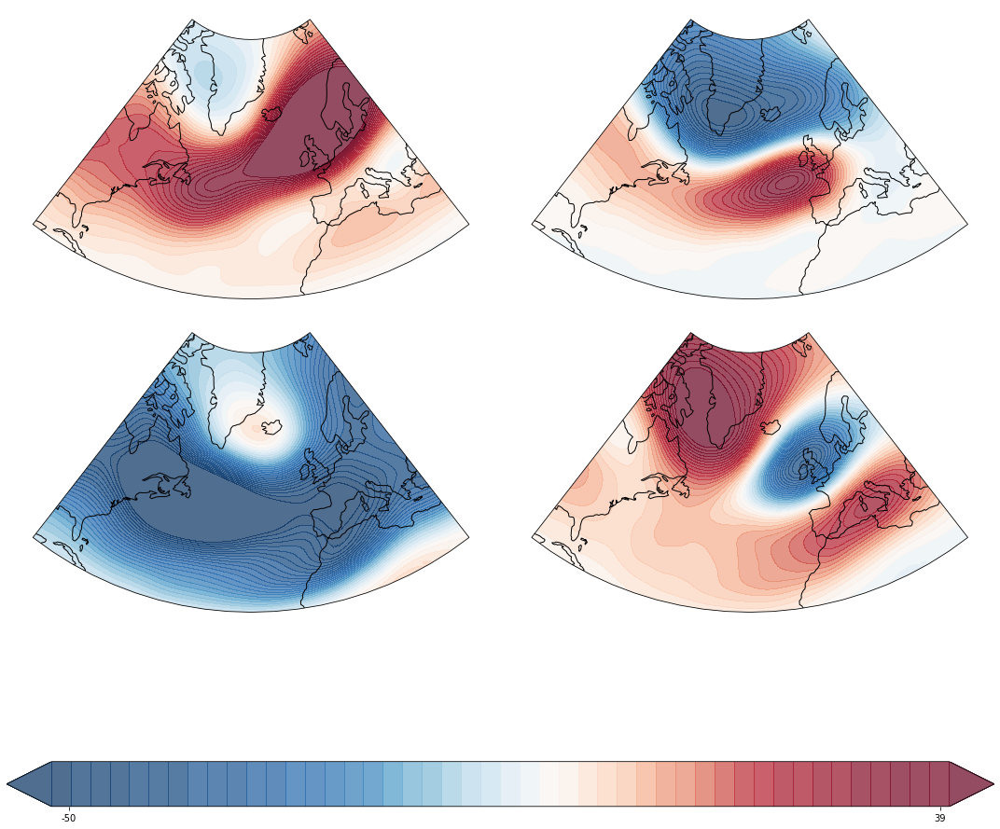

In [13]:
estimator = load_estimator('../models/SUMMER/pca_5months_1normal/kmeans_model_ch.pkl')
labels, inertia, _ = extract_regimes(reduced_anomaly, method='kmeans', nb_regimes = 8, estimator = estimator)
plot_regimes(pivot_anomaly, labels)

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



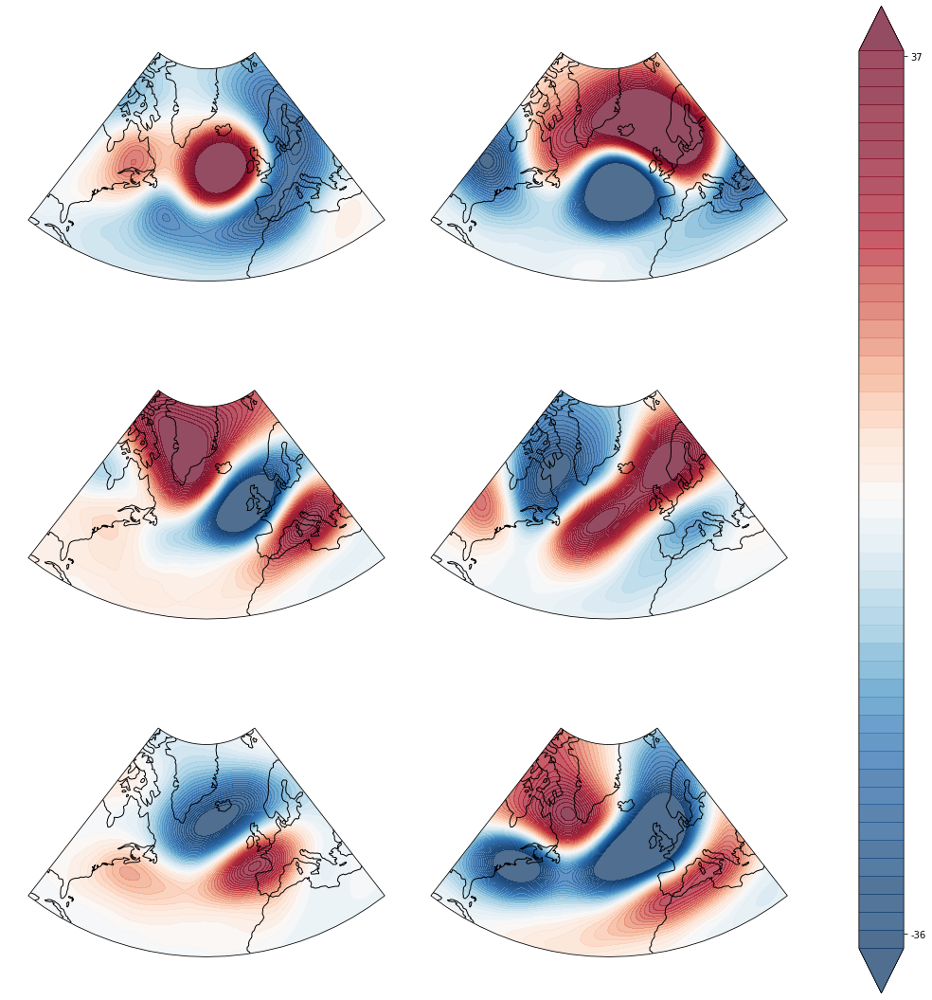

In [14]:
estimator = load_estimator("../models/SUMMER/pca/bayesian_gmm_model_ch.pkl")
probas, elbo, means, covariances, _ = extract_regimes(reduced_anomaly, method='bayesian_gmm', nb_regimes = 6, estimator = estimator)
labels = np.argmax(probas, axis=1)
plot_regimes(pivot_anomaly, labels)

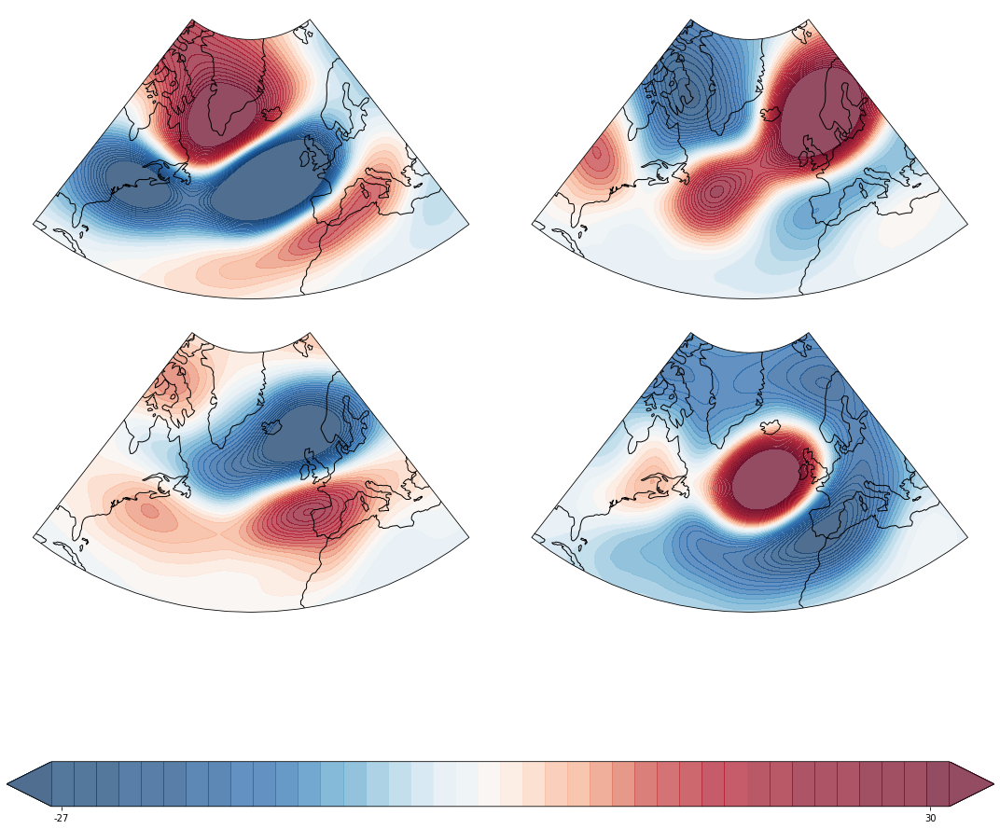

In [21]:
estimator = load_estimator("../models/SUMMER/pca/gmm_model_silhouette.pkl")
probas, elbo, means, covariances, _ = extract_regimes(reduced_anomaly, method='gmm', nb_regimes = 5, estimator = estimator)
labels = np.argmax(probas, axis=1)
plot_regimes(pivot_anomaly, labels)

### VAE: 5 Months

In [14]:
pd.DataFrame.from_dict({model:performance_matrix('../models/SUMMER/vae/'+ model, train_X.values, test_X.values)\
                        for model in os.listdir('../models/SUMMER/vae') if model.endswith('pkl')},
             orient='index')

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check f

,Number of Clusters,BIC,Silhouette Score,Calinski Harabsz Index,Inertia
bayesian_gmm_model_bic.pkl,4,-43815.929920,0.026472,81.840459,2.370001e+09
bayesian_gmm_model_ch.pkl,5,-43921.887772,0.031431,78.649481,2.252241e+09
bayesian_gmm_model_score.pkl,7,-44110.652476,0.035359,72.975511,2.081303e+09
bayesian_gmm_model_silhouette.pkl,4,-43812.160851,0.027493,81.230524,2.371569e+09
gmm_model_bic.pkl,4,-43818.426627,0.026194,81.368170,2.372380e+09
gmm_model_ch.pkl,4,-43798.241360,0.026456,80.957465,2.371222e+09
gmm_model_score.pkl,5,-43719.576023,0.045948,95.669956,2.295145e+09
gmm_model_silhouette.pkl,4,-43809.015604,0.023767,79.627367,2.377958e+09
kmeans_model_bic.pkl,7,-43064.104789,0.163302,184.140875,1.427821e+09
kmeans_model_ch.pkl,4,-43073.857413,0.167389,209.964522,1.828358e+09


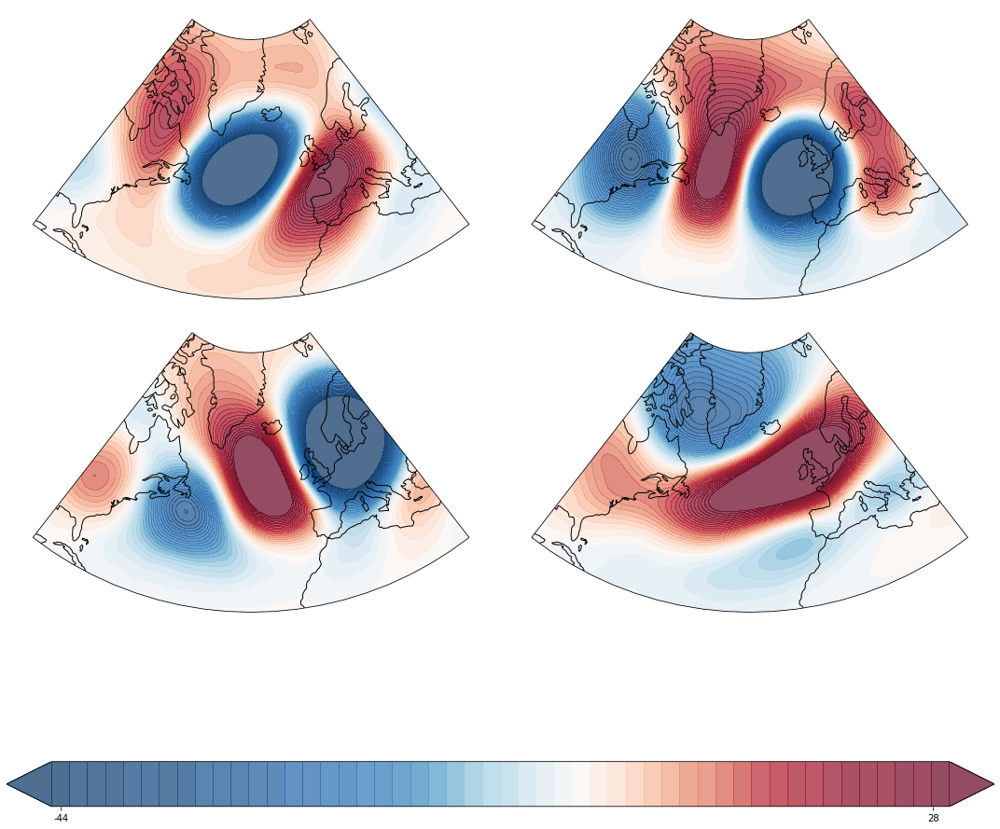

In [15]:
estimator = load_estimator('../models/SUMMER/vae/kmeans_model_ch.pkl')
labels, inertia, _ = extract_regimes(reduced_anomaly, method='kmeans', nb_regimes = 8, estimator = estimator)
plot_regimes(pivot_anomaly, labels)

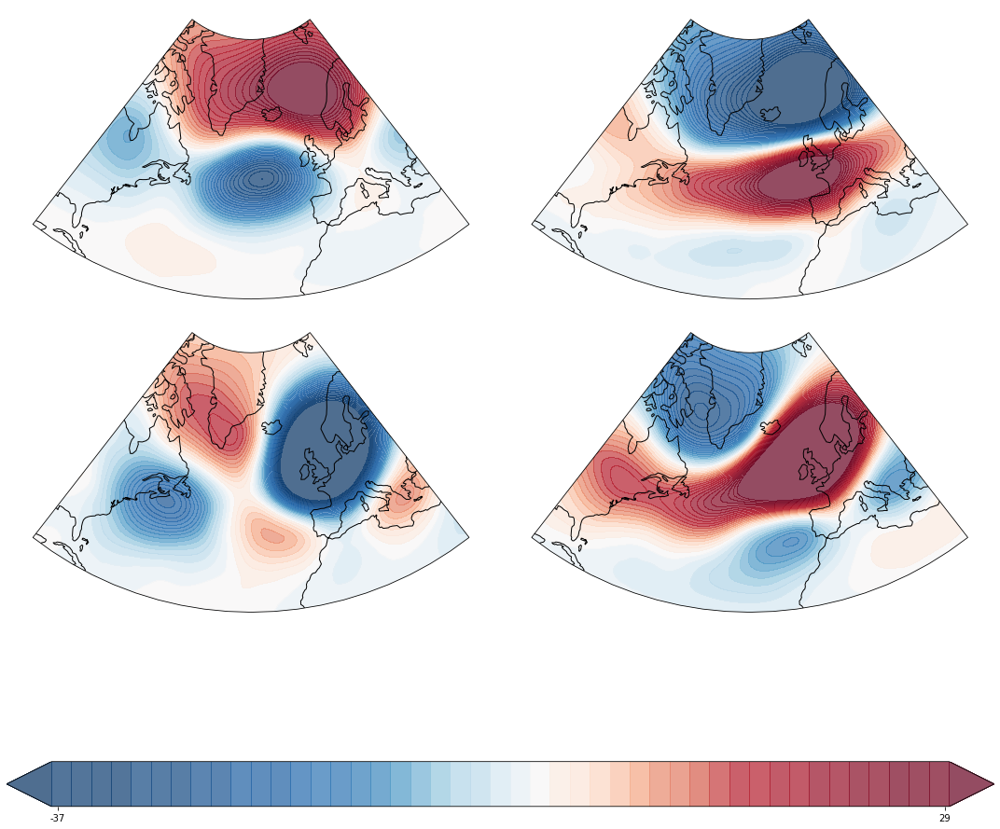

In [16]:
estimator = load_estimator("../models/SUMMER/vae/bayesian_gmm_model_bic.pkl")
probas, elbo, means, covariances, _ = extract_regimes(reduced_anomaly, method='bayesian_gmm', nb_regimes = 6, estimator = estimator)
labels = np.argmax(probas, axis=1)
plot_regimes(pivot_anomaly, labels)

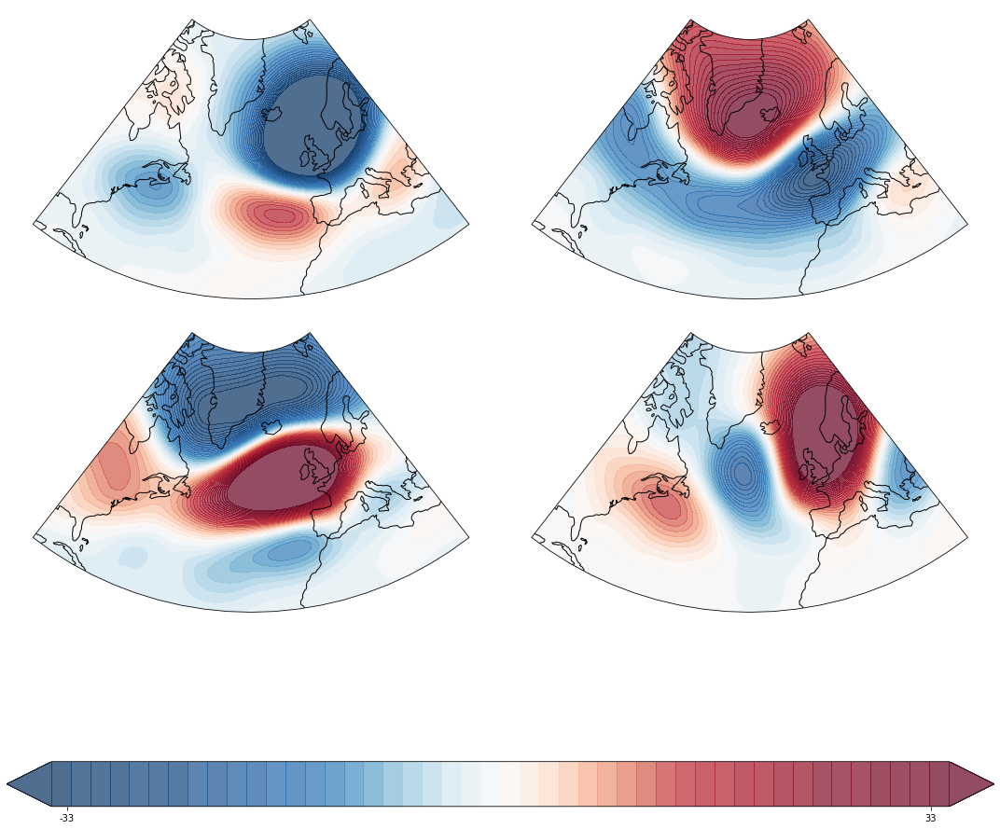

In [17]:
estimator = load_estimator("../models/SUMMER/vae/gmm_model_bic.pkl")
probas, elbo, means, covariances, _ = extract_regimes(reduced_anomaly, method='gmm', nb_regimes = 5, estimator = estimator)
labels = np.argmax(probas, axis=1)
plot_regimes(pivot_anomaly, labels)

### PCA: 4 Months (15th May - 15th Sept) and 4 Normals

In [43]:
pd.DataFrame.from_dict({model:performance_matrix('../models/SUMMER/pca_4months_4normals/'+ model, train_X.values, test_X.values)\
                        for model in os.listdir('../models/SUMMER/pca_4months_4normals') if model.endswith('pkl')},
             orient='index')

,Number of Clusters,BIC,Silhouette Score,Calinski Harabsz Index,Inertia
kmeans_model_bic.pkl,6,-217531.915663,0.067233,69.739260,2.876436e+11
kmeans_model_ch.pkl,4,-217584.918301,0.079402,89.064929,3.044836e+11
kmeans_model_score.pkl,7,-217595.562938,0.060097,61.864244,2.830735e+11
kmeans_model_silhouette.pkl,4,-217584.918291,0.079402,89.064929,3.044836e+11


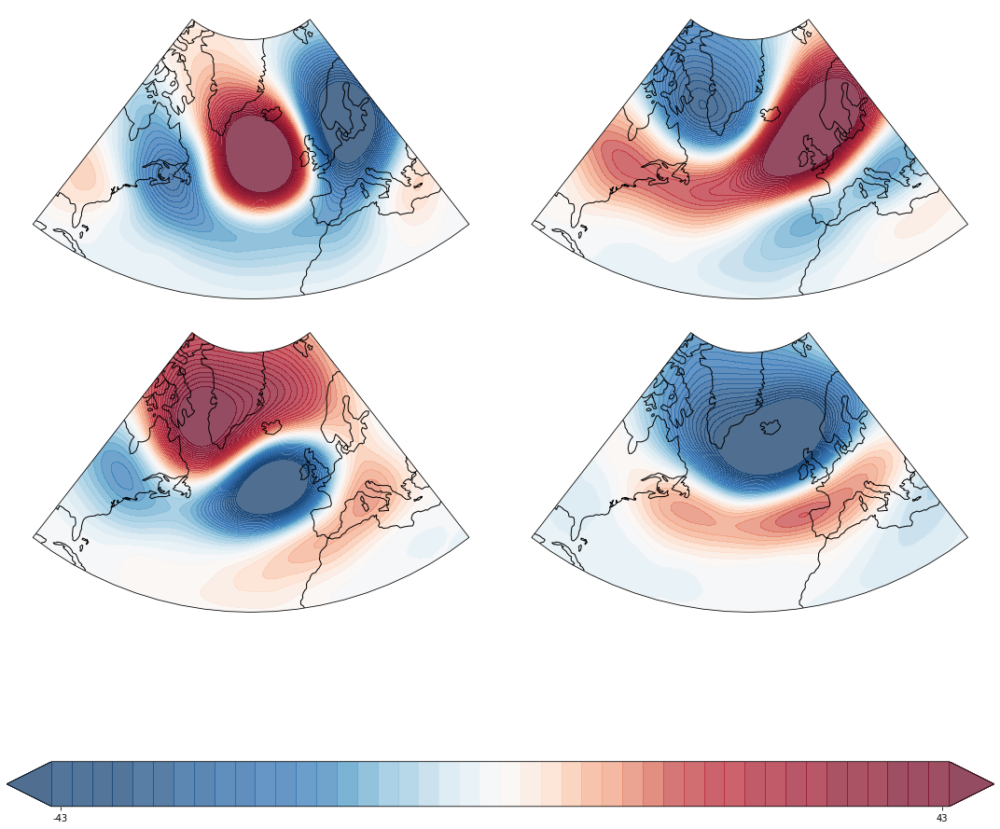

In [44]:
estimator = load_estimator('../models/SUMMER/pca_4months_4normals/kmeans_model_ch.pkl')
labels, inertia, _ = extract_regimes(reduced_anomaly, method='kmeans', nb_regimes = 8, estimator = estimator)
plot_regimes(pivot_anomaly, labels)

### PCA 4 Months (15th May - 15th Sept) and 1 Normal

In [52]:
pd.DataFrame.from_dict({model:performance_matrix('../models/SUMMER/pca_4months_1normal/'+ model, train_X.values, test_X.values)\
                        for model in os.listdir('../models/SUMMER/pca_4months_1normal') if model.endswith('pkl')},
             orient='index')

,Number of Clusters,BIC,Silhouette Score,Calinski Harabsz Index,Inertia
kmeans_model_bic.pkl,7,-198504.536556,0.075481,93.236957,2.962523e+11
kmeans_model_ch.pkl,4,-198706.669321,0.081910,136.675618,3.256731e+11
kmeans_model_score.pkl,7,-198504.979985,0.075454,93.235904,2.962459e+11
kmeans_model_silhouette.pkl,5,-198586.838446,0.079221,116.429317,3.135530e+11


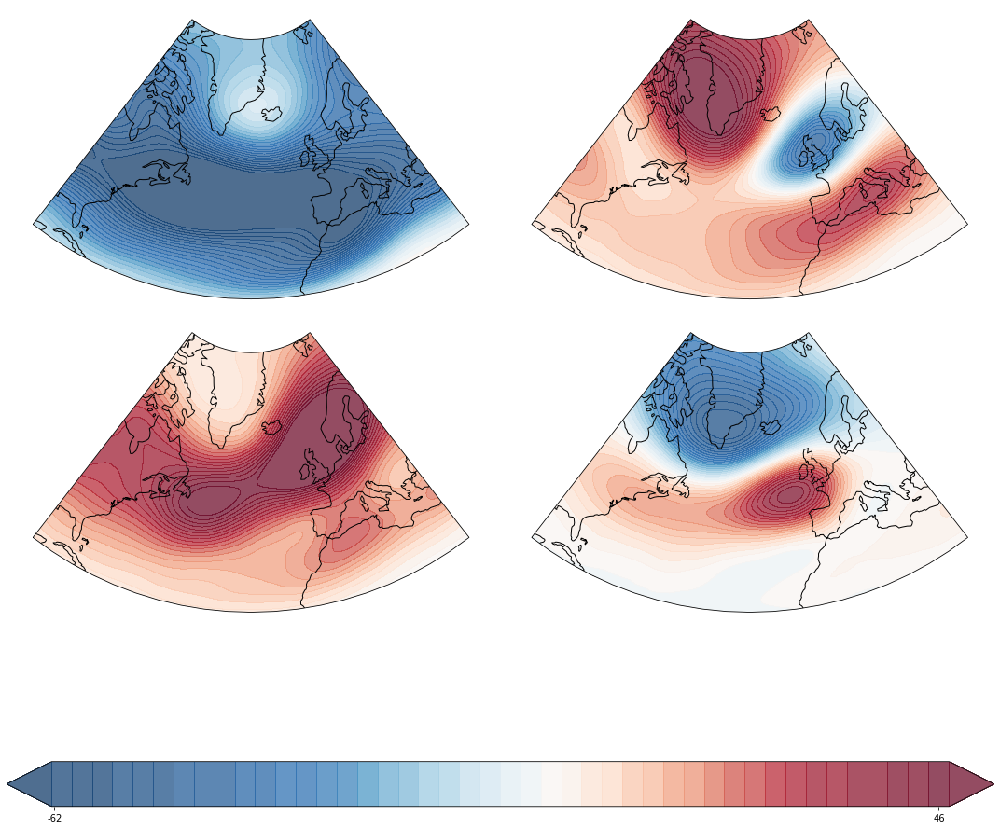

In [53]:
estimator = load_estimator('../models/SUMMER/pca_4months_1normal/kmeans_model_ch.pkl')
labels, inertia, _ = extract_regimes(reduced_anomaly, method='kmeans', nb_regimes = 8, estimator = estimator)
plot_regimes(pivot_anomaly, labels)

### PCA 4 Months (15th May - 15th Sept) and Weekly Normal

In [18]:
pd.DataFrame.from_dict({model:performance_matrix('../models/SUMMER/pca_4months_weeklynormal/'+ model, train_X.values, test_X.values)\
                        for model in os.listdir('../models/SUMMER/pca_4months_weeklynormal') if model.endswith('pkl')},
             orient='index')

,Number of Clusters,BIC,Silhouette Score,Calinski Harabsz Index,Inertia
kmeans_model_bic.pkl,6,-216646.773611,0.068318,71.581387,2.658517e+11
kmeans_model_ch.pkl,4,-216813.570914,0.077449,88.488425,2.840987e+11
kmeans_model_score.pkl,7,-216650.550161,0.064913,64.557600,2.603751e+11
kmeans_model_silhouette.pkl,4,-216781.365417,0.078479,89.494530,2.833879e+11


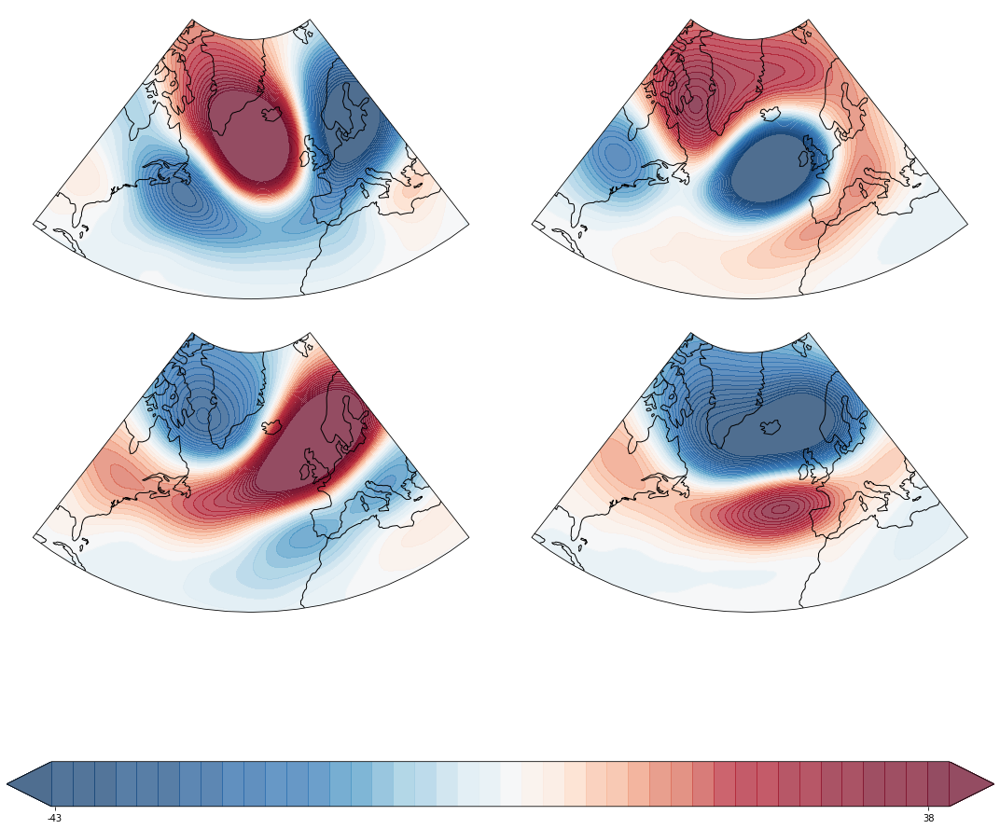

In [20]:
estimator = load_estimator('../models/SUMMER/pca_4months_weeklynormal/kmeans_model_silhouette.pkl')
labels, inertia, _ = extract_regimes(reduced_anomaly, method='kmeans', nb_regimes = 8, estimator = estimator)
plot_regimes(pivot_anomaly, labels)

### VAE: 3 Months (June, July, Aug) and Weekly Normal

In [13]:
get_statistics('../models/SUMMER/vae_3months', train_X, test_X)

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	func:'get_statistics' took: 56.9277 sec


,Number of Clusters,BIC,Silhouette Score,Calinski Harabsz Index,Inertia
bayesian_gmm_model_bic.pkl,4,-33636.840497,0.066467,79.561626,3.108828e+09
bayesian_gmm_model_ch.pkl,6,-33746.616557,0.046570,68.666330,2.828278e+09
bayesian_gmm_model_score.pkl,7,-33754.609632,0.044954,70.340271,2.637436e+09
bayesian_gmm_model_silhouette.pkl,4,-33643.971073,0.062866,80.260850,3.101222e+09
gmm_model_bic.pkl,4,-33590.908951,0.090125,85.459201,3.047681e+09
gmm_model_ch.pkl,4,-33568.186721,0.096517,95.054828,2.961134e+09
gmm_model_score.pkl,7,-33641.360418,0.070289,76.927732,3.121175e+09
gmm_model_silhouette.pkl,4,-33568.092930,0.097161,95.010327,2.960789e+09
kmeans_model_bic.pkl,4,-33171.807240,0.167138,172.386860,2.419353e+09
kmeans_model_ch.pkl,4,-33172.991018,0.167178,172.167045,2.421767e+09


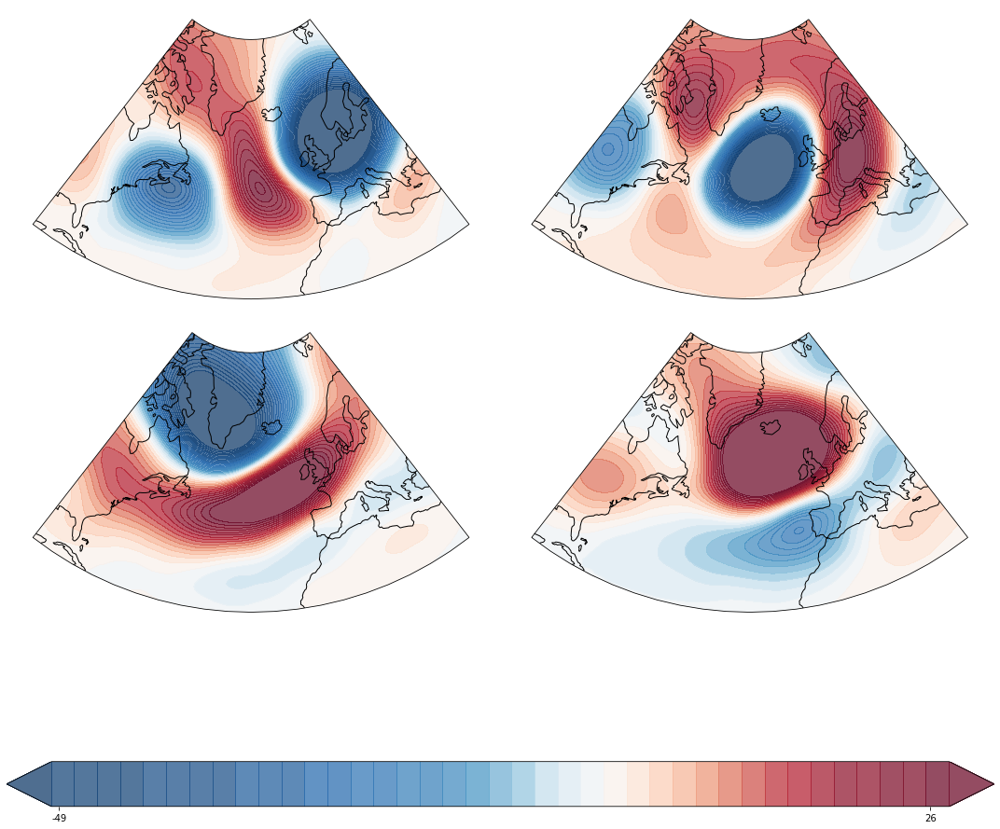

In [14]:
estimator = load_estimator('../models/SUMMER/vae_3months/kmeans_model_bic.pkl')
labels, inertia, _ = extract_regimes(reduced_anomaly, method='kmeans', nb_regimes = 8, estimator = estimator)
plot_regimes(pivot_anomaly, labels)

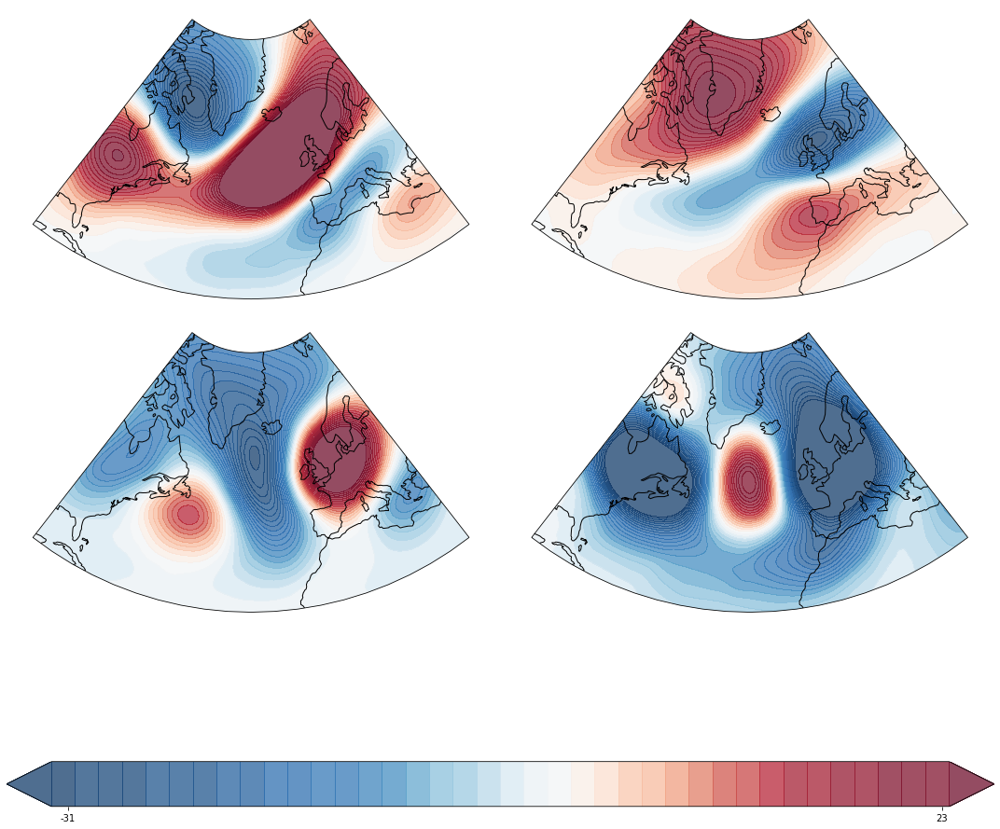

In [15]:
estimator = load_estimator("../models/SUMMER/vae_3months/bayesian_gmm_model_bic.pkl")
probas, elbo, means, covariances, _ = extract_regimes(reduced_anomaly, method='bayesian_gmm', nb_regimes = 5, estimator = estimator)
labels = np.argmax(probas, axis=1)
plot_regimes(pivot_anomaly, labels)

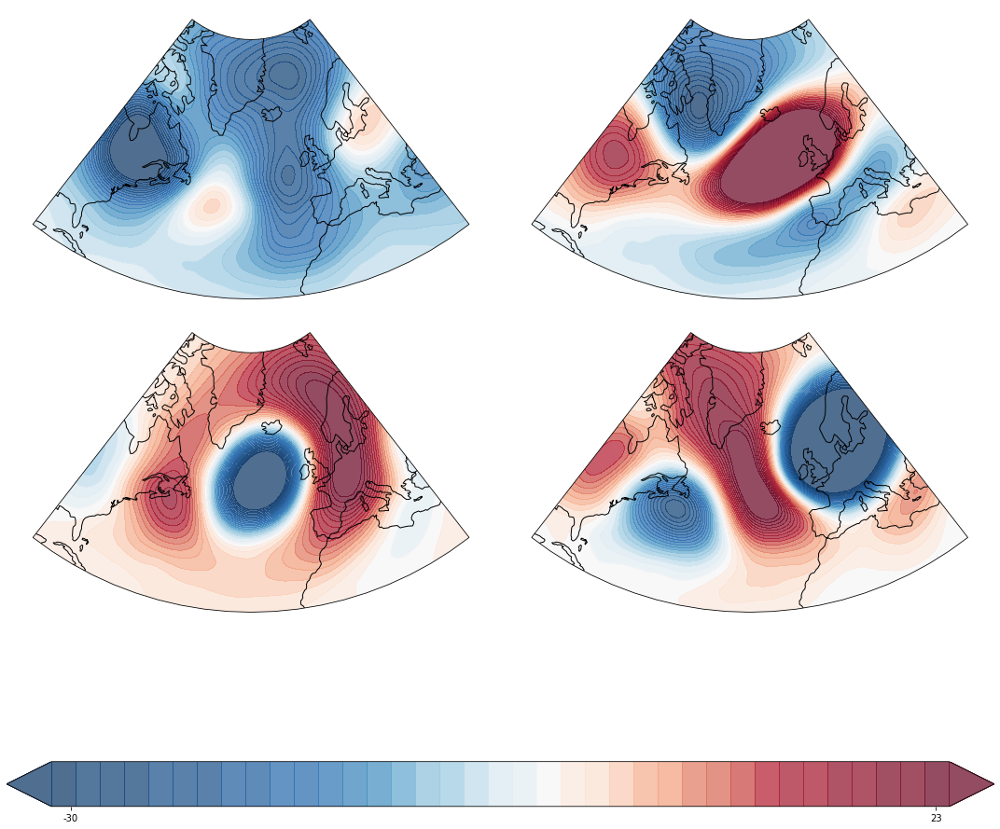

In [16]:
estimator = load_estimator("../models/SUMMER/vae_3months/gmm_model_ch.pkl")
probas, elbo, means, covariances, _ = extract_regimes(reduced_anomaly, method='gmm', nb_regimes = 5, estimator = estimator)
labels = np.argmax(probas, axis=1)
plot_regimes(pivot_anomaly, labels)

### VAE: 3 Months (June, July, Aug) and 1 Normal

In [13]:
pd.DataFrame.from_dict({model:performance_matrix('../models/SUMMER/vae_3months_1normal/'+ model, train_X.values, test_X.values)\
                        for model in os.listdir('../models/SUMMER/vae_3months_1normal') if model.endswith('pkl')},
             orient='index')

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



,Number of Clusters,BIC,Silhouette Score,Calinski Harabsz Index,Inertia
bayesian_gmm_model_bic.pkl,4,-53485.681525,0.090415,319.141505,2.501116e+09
bayesian_gmm_model_ch.pkl,4,-53425.103939,0.032637,330.945508,2.463830e+09
bayesian_gmm_model_score.pkl,6,-53648.936112,0.037728,255.674899,2.192518e+09
bayesian_gmm_model_silhouette.pkl,5,-53539.141569,0.037353,286.628295,2.308010e+09
gmm_model_bic.pkl,4,-53391.174276,0.005078,334.482004,2.451953e+09
gmm_model_ch.pkl,5,-53366.045087,0.006969,340.292875,2.432018e+09
gmm_model_score.pkl,4,-53391.171960,0.005078,334.482004,2.451951e+09
gmm_model_silhouette.pkl,4,-53516.614813,0.068349,314.645226,2.515199e+09
kmeans_model_bic.pkl,5,-52188.345788,0.346482,484.065009,1.753629e+09
kmeans_model_ch.pkl,4,-52237.532443,0.365553,567.015833,1.886440e+09


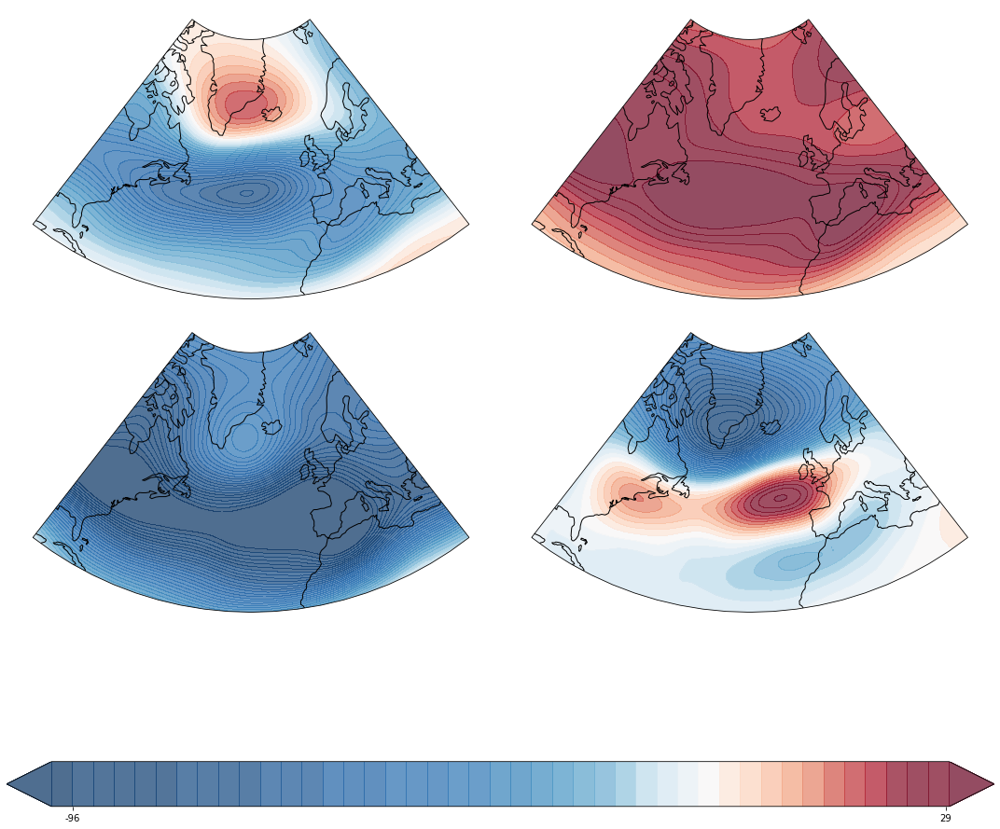

In [14]:
estimator = load_estimator('../models/SUMMER/vae_3months_1normal/kmeans_model_ch.pkl')
labels, inertia, _ = extract_regimes(reduced_anomaly, method='kmeans', nb_regimes = 8, estimator = estimator)
plot_regimes(pivot_anomaly, labels)

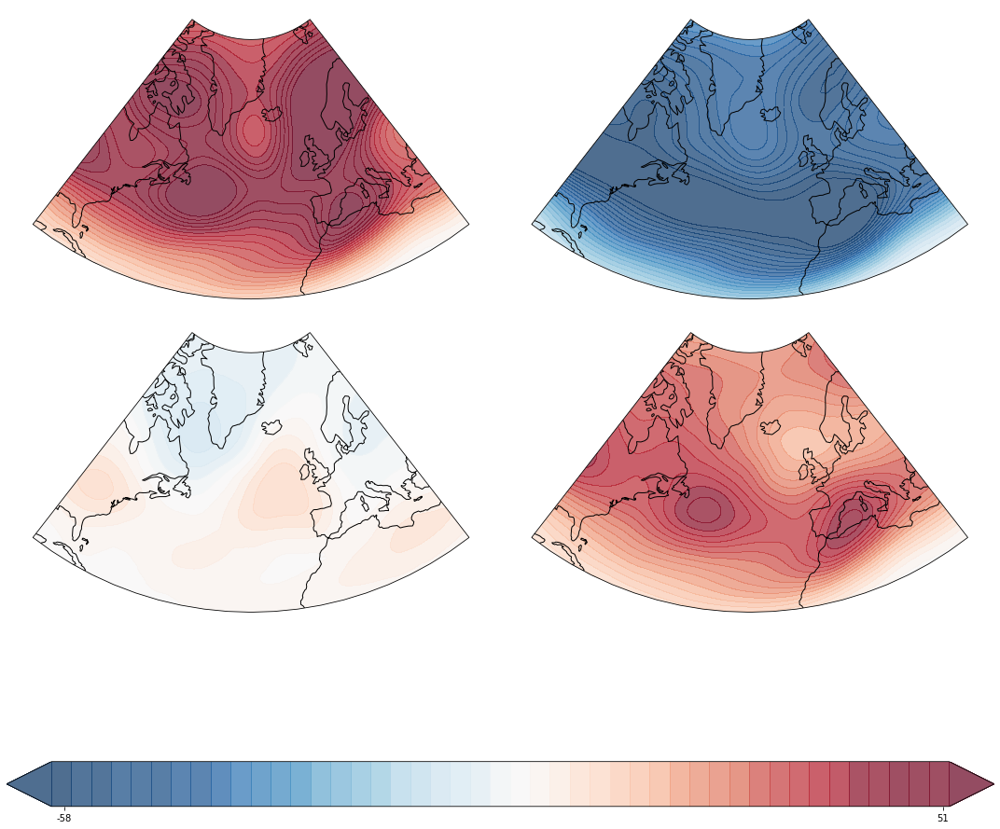

In [15]:
estimator = load_estimator("../models/SUMMER/vae_3months_1normal/gmm_model_bic.pkl")
probas, elbo, means, covariances, _ = extract_regimes(reduced_anomaly, method='gmm', nb_regimes = 5, estimator = estimator)
labels = np.argmax(probas, axis=1)
plot_regimes(pivot_anomaly, labels)

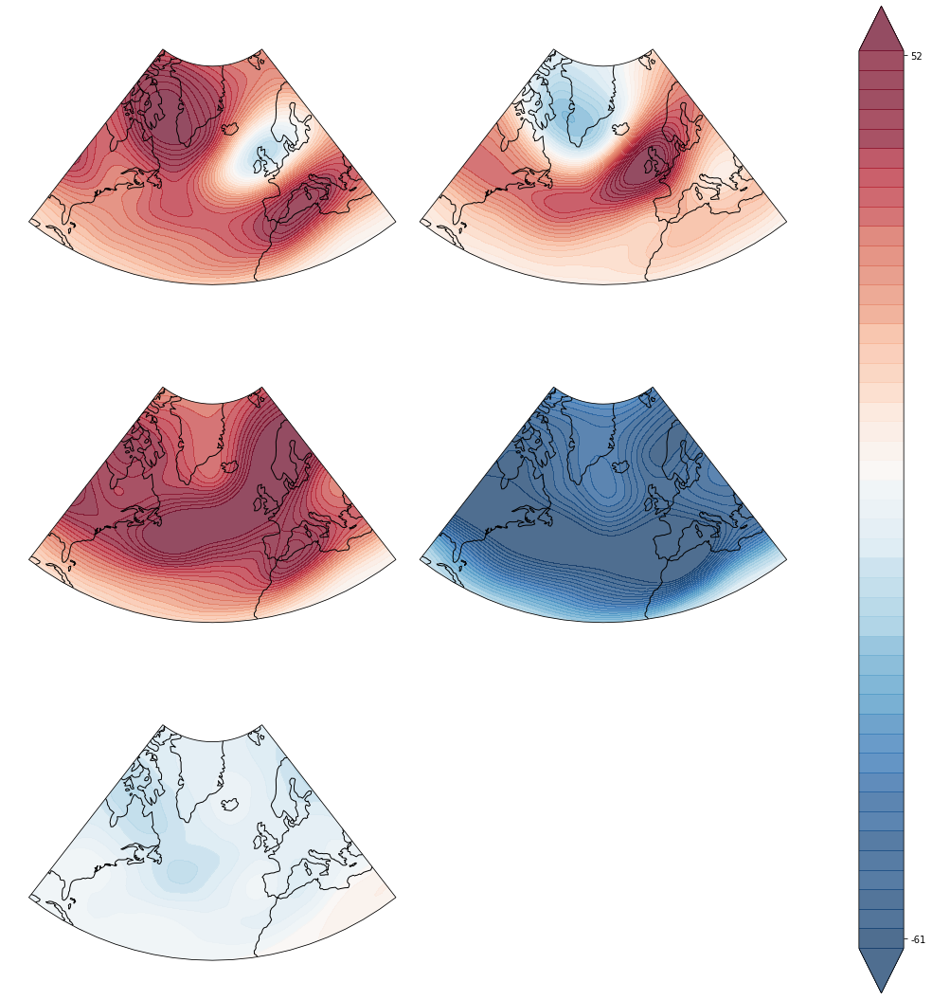

In [16]:
estimator = load_estimator("../models/SUMMER/vae_3months/bayesian_gmm_model_ch.pkl")
probas, elbo, means, covariances, _ = extract_regimes(reduced_anomaly, method='gmm', nb_regimes = 5, estimator = estimator)
labels = np.argmax(probas, axis=1)
plot_regimes(pivot_anomaly, labels)

### PCA: 3 months (June, July, August) and 1 Normal

In [14]:
pd.DataFrame.from_dict({model:performance_matrix('../models/SUMMER/pca_3months_1normal/'+ model, train_X.values, test_X.values)\
                        for model in os.listdir('../models/SUMMER/pca_3months_1normal') if model.endswith('pkl')},
             orient='index')

,Number of Clusters,BIC,Silhouette Score,Calinski Harabsz Index,Inertia
kmeans_model_bic.pkl,6,-153698.093748,0.076885,65.719487,1.972255e+11
kmeans_model_ch.pkl,4,-153883.797348,0.076163,79.936693,2.138657e+11
kmeans_model_score.pkl,7,-153718.936694,0.068197,59.138357,1.929927e+11
kmeans_model_silhouette.pkl,4,-153883.797360,0.076163,79.936693,2.138657e+11


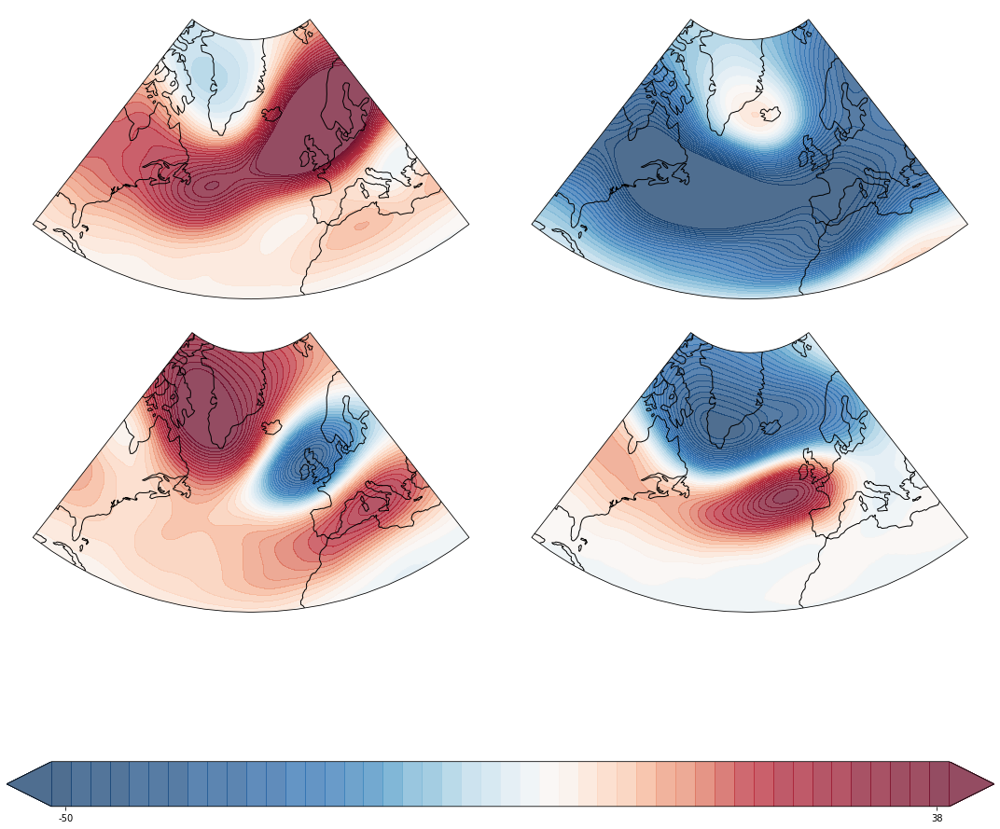

In [14]:
estimator = load_estimator('../models/SUMMER/pca_3months_1normal/kmeans_model_ch.pkl')
labels, inertia, _ = extract_regimes(reduced_anomaly, method='kmeans', nb_regimes = 8, estimator = estimator)
plot_regimes(pivot_anomaly, labels)

### PCA: 3 Months (June, July, August) and 3 Normal (1979-2016)

In [14]:
pd.DataFrame.from_dict({model:performance_matrix('../models/SUMMER/pca_3months_3normal1979-2016/'+ model, train_X.values, test_X.values)\
                        for model in os.listdir('../models/SUMMER/pca_3months_3normal1979-2016') if model.endswith('pkl')},
             orient='index')

,Number of Clusters,BIC,Silhouette Score,Calinski Harabsz Index,Inertia
kmeans_model_bic.pkl,5,-141934.901162,0.074349,52.535605,1.714010e+11
kmeans_model_ch.pkl,4,-142014.572792,0.075737,57.658831,1.788170e+11
kmeans_model_score.pkl,7,-142048.236442,0.062097,41.387990,1.652700e+11
kmeans_model_silhouette.pkl,4,-142014.572800,0.075737,57.658831,1.788170e+11


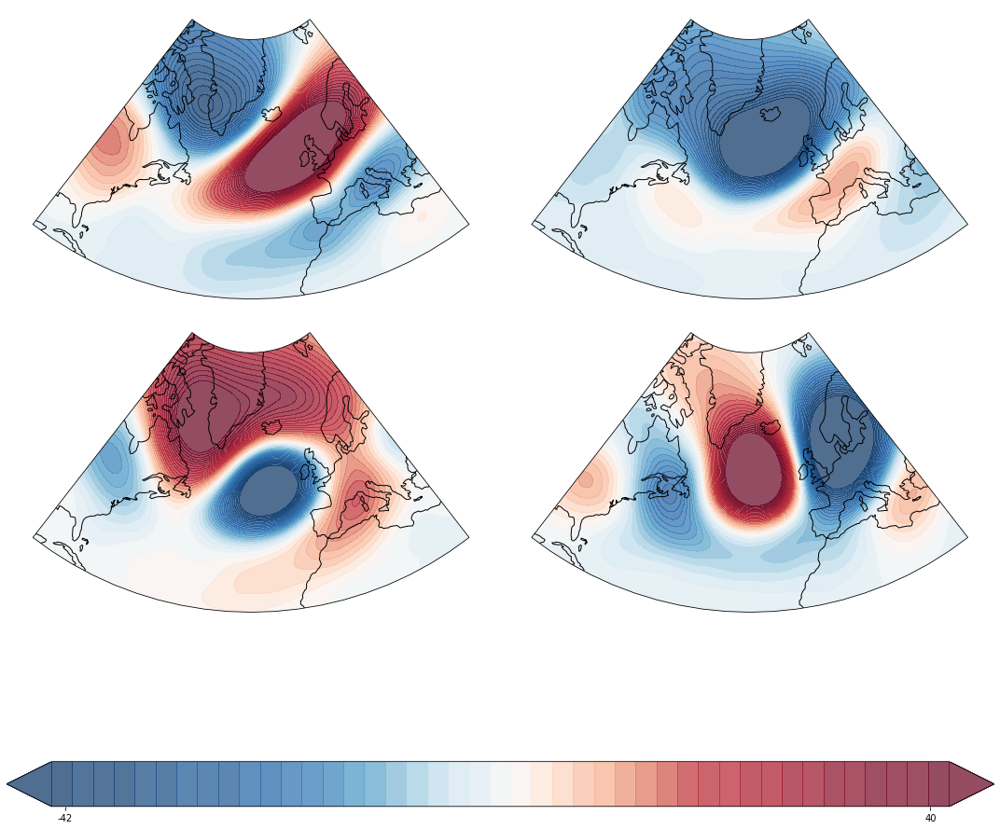

In [15]:
estimator = load_estimator('../models/SUMMER/pca_3months_3normal1979-2016/kmeans_model_ch.pkl')
labels, inertia, _ = extract_regimes(reduced_anomaly, method='kmeans', nb_regimes = 8, estimator = estimator)
plot_regimes(pivot_anomaly, labels)

### PCA: 3 Months (June, July, August) and 1 Normal (1979-2016)

In [22]:
pd.DataFrame.from_dict({model:performance_matrix('../models/SUMMER/pca_3months_1normal1979-2016/'+ model, train_X.values, test_X.values)\
                        for model in os.listdir('../models/SUMMER/pca_3months_1normal1979-2016') if model.endswith('pkl')},
             orient='index')

,Number of Clusters,BIC,Silhouette Score,Calinski Harabsz Index,Inertia
kmeans_model_bic.pkl,6,-141978.240279,0.065363,46.283781,1.677145e+11
kmeans_model_ch.pkl,4,-142015.528482,0.075660,57.794977,1.787594e+11
kmeans_model_score.pkl,7,-142048.236453,0.062097,41.387990,1.652700e+11
kmeans_model_silhouette.pkl,6,-141988.453502,0.063559,45.965498,1.679497e+11


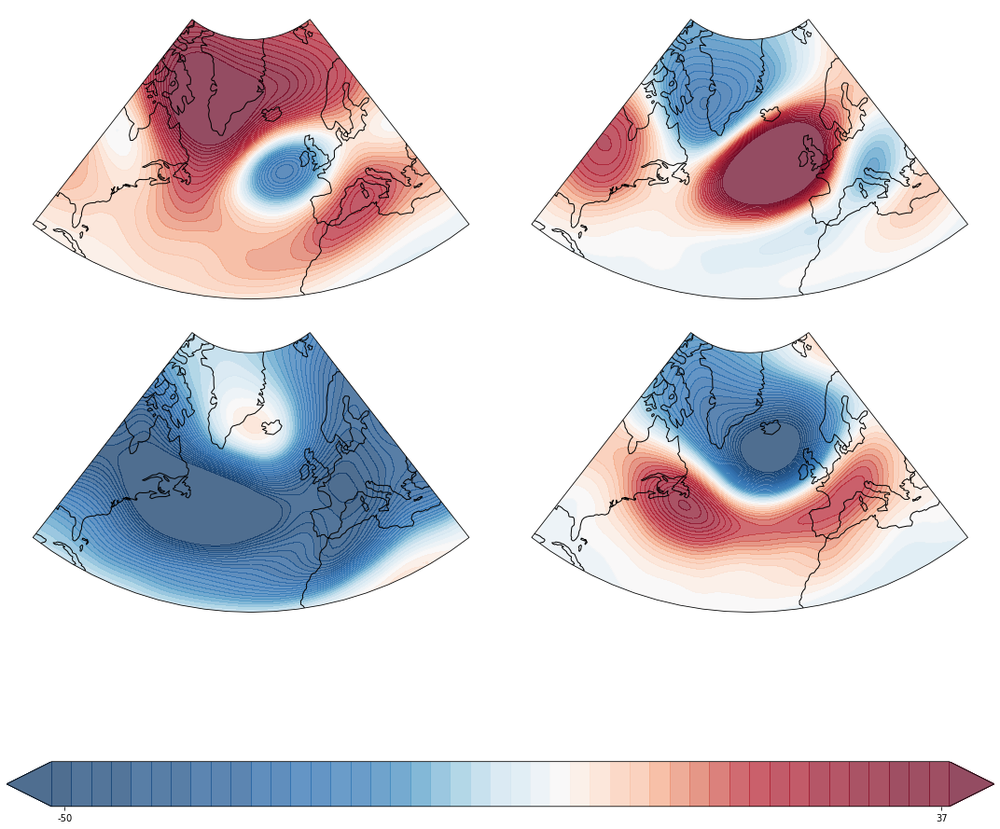

In [23]:
estimator = load_estimator('../models/SUMMER/pca_3months_1normal1979-2016/kmeans_model_ch.pkl')
labels, inertia, _ = extract_regimes(reduced_anomaly, method='kmeans', nb_regimes = 8, estimator = estimator)
plot_regimes(pivot_anomaly, labels)

### PCA: 3 Months (June, July, August), 1 Normal and 5 PCs

In [29]:
pd.DataFrame.from_dict({model:performance_matrix('../models/SUMMER/pca_3months_1normal_5pcs/'+ model, train_X.values, test_X.values)\
                        for model in os.listdir('../models/SUMMER/pca_3months_1normal_5pcs') if model.endswith('pkl')},
             orient='index')

,Number of Clusters,BIC,Silhouette Score,Calinski Harabsz Index,Inertia
kmeans_model_bic.pkl,4,-142013.096633,0.075886,57.910193,1.786960e+11
kmeans_model_ch.pkl,4,-142009.625060,0.075810,57.816571,1.786344e+11
kmeans_model_score.pkl,7,-142048.236435,0.062097,41.387990,1.652700e+11
kmeans_model_silhouette.pkl,6,-141987.119458,0.063268,45.951859,1.679256e+11


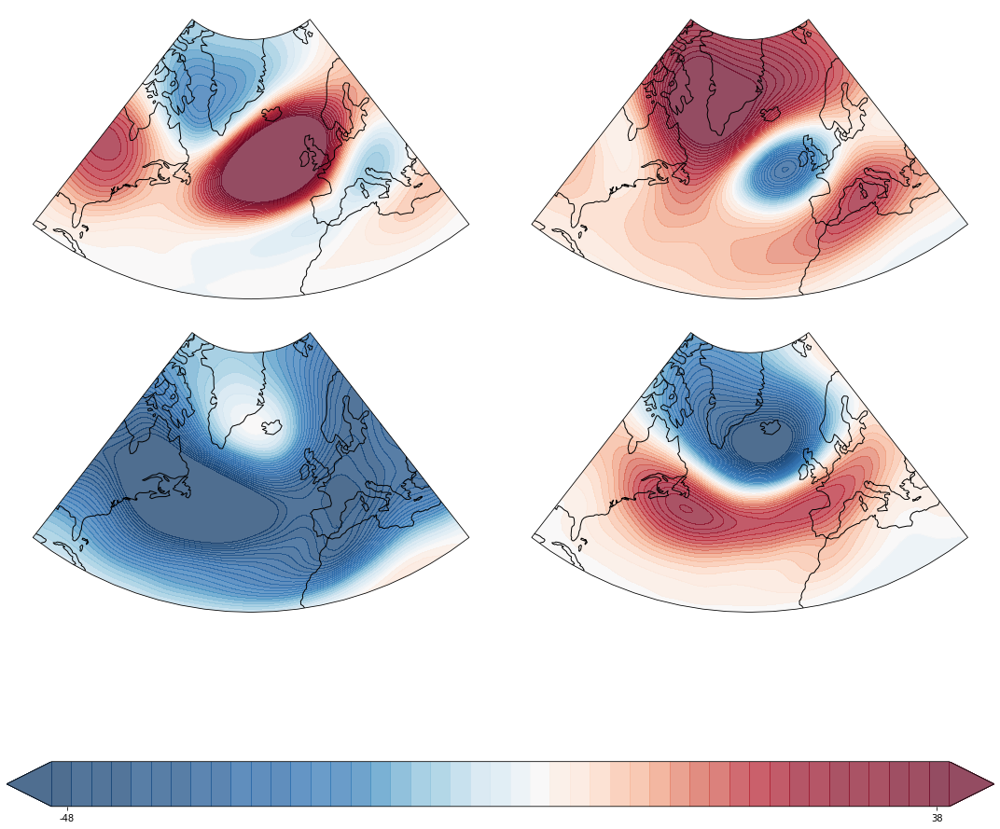

In [30]:
estimator = load_estimator('../models/SUMMER/pca_3months_1normal_5pcs/kmeans_model_bic.pkl')
labels, inertia, _ = extract_regimes(reduced_anomaly, method='kmeans', nb_regimes = 8, estimator = estimator)
plot_regimes(pivot_anomaly, labels)

### PCA: 3 Months (June, July, August), 3 Normal and 5 PCs

In [15]:
pd.DataFrame.from_dict({model:performance_matrix('../models/SUMMER/pca_3months_3normal_5pcs/'+ model, train_X.values, test_X.values)\
                        for model in os.listdir('../models/SUMMER/pca_3months_3normal_5pcs') if model.endswith('pkl')},
             orient='index')

,Number of Clusters,BIC,Silhouette Score,Calinski Harabsz Index,Inertia
kmeans_model_bic.pkl,4,-40323.179736,0.152707,145.559035,8.956718e+10
kmeans_model_ch.pkl,4,-40323.179740,0.152707,145.559035,8.956718e+10
kmeans_model_score.pkl,7,-40465.441814,0.139706,114.850073,7.465231e+10
kmeans_model_silhouette.pkl,4,-40319.156171,0.153387,146.302108,8.936578e+10


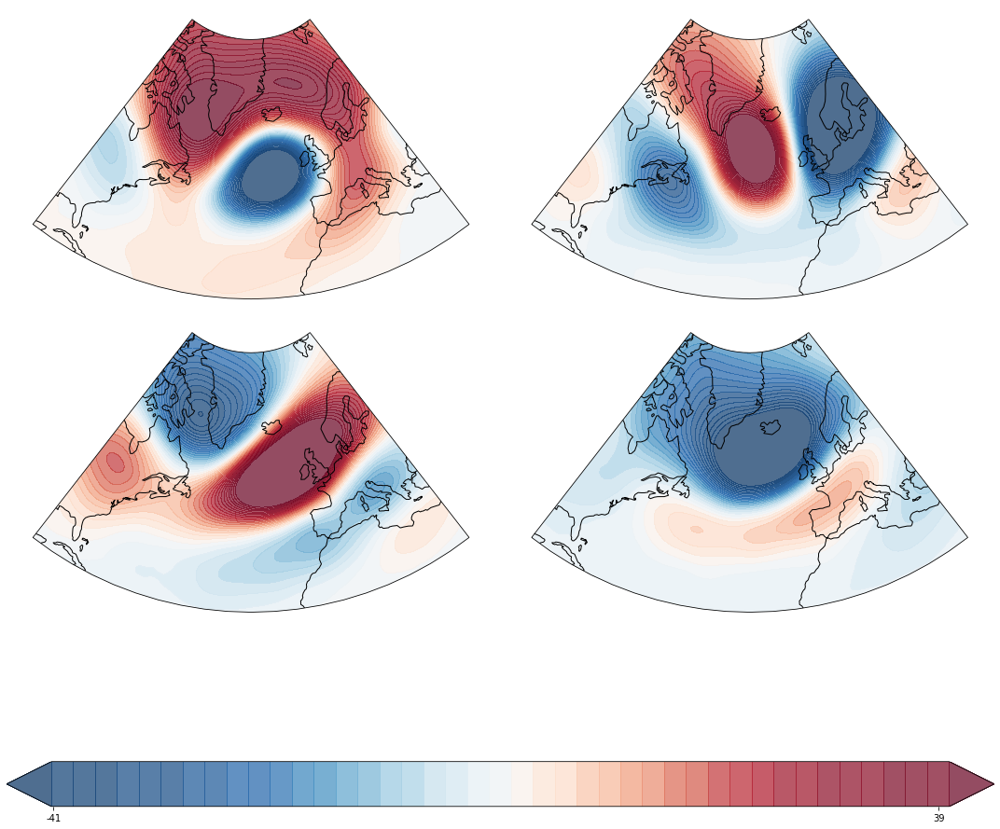

In [16]:
estimator = load_estimator('../models/SUMMER/pca_3months_1normal_5pcs/kmeans_model_ch.pkl')
labels, inertia, _ = extract_regimes(reduced_anomaly, method='kmeans', nb_regimes = 8, estimator = estimator)
plot_regimes(pivot_anomaly, labels)

### PCA: 3 Months (June, July, August), Weekly Normal and 5 PCs

In [14]:
pd.DataFrame.from_dict({model:performance_matrix('../models/SUMMER/pca_3months_weeklynormal_5pcs/'+ model, train_X.values, test_X.values)\
                        for model in os.listdir('../models/SUMMER/pca_3months_weeklynormal_5pcs') if model.endswith('pkl')},
             orient='index')

,Number of Clusters,BIC,Silhouette Score,Calinski Harabsz Index,Inertia
kmeans_model_bic.pkl,4,-38572.391862,0.241493,160.469214,2.476049e+08
kmeans_model_ch.pkl,4,-38572.391862,0.241493,160.469214,2.476049e+08
kmeans_model_score.pkl,7,-38593.576925,0.142869,130.346135,2.011105e+08
kmeans_model_silhouette.pkl,4,-38573.276024,0.241493,160.469214,2.476838e+08


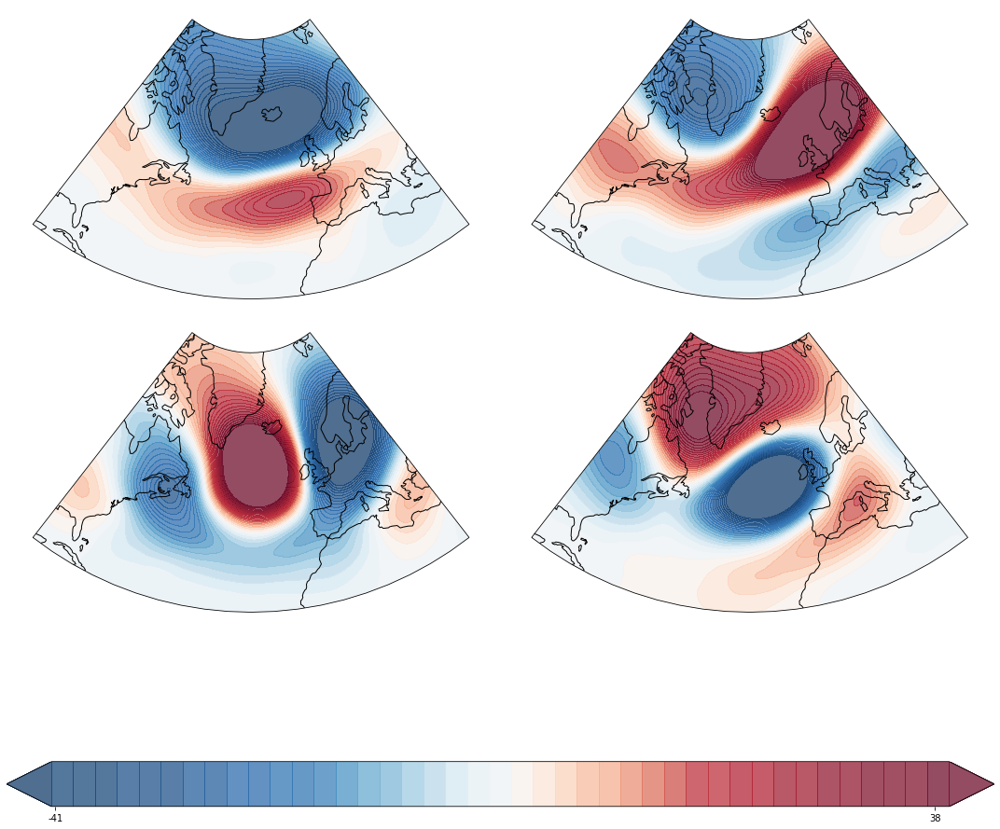

In [26]:
estimator = load_estimator('../models/SUMMER/pca_3months_weeklynormal_5pcs/kmeans_model_ch.pkl')
labels, inertia, _ = extract_regimes(reduced_anomaly, method='kmeans', nb_regimes = 8, estimator = estimator)
plot_regimes(pivot_anomaly, labels)

### VAE: 3 Months (June, July, August), Weekly Normal and 7 components

In [28]:
pd.DataFrame.from_dict({model:performance_matrix('../models/SUMMER/vae_3months_weeklynormal_7pcs/'+ model, train_X.values, test_X.values)\
                        for model in os.listdir('../models/SUMMER/vae_3months_weeklynormal_7pcs') if model.endswith('pkl')},
             orient='index')

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



,Number of Clusters,BIC,Silhouette Score,Calinski Harabsz Index,Inertia
bayesian_gmm_model_bic.pkl,4,-39268.818164,0.036856,92.337384,2.988501e+08
bayesian_gmm_model_ch.pkl,4,-39268.065889,0.037599,92.482760,2.987438e+08
bayesian_gmm_model_score.pkl,7,-39514.037557,0.018801,64.419476,2.721162e+08
bayesian_gmm_model_silhouette.pkl,7,-39500.233877,0.024106,66.206687,2.706076e+08
gmm_model_bic.pkl,4,-39295.887534,0.014444,86.608833,3.036223e+08
gmm_model_ch.pkl,4,-39274.288323,0.047622,92.322617,2.992115e+08
gmm_model_score.pkl,7,-39294.926335,0.014624,86.789156,3.035160e+08
gmm_model_silhouette.pkl,7,-39299.029816,0.034809,88.433105,3.023462e+08
kmeans_model_bic.pkl,6,-38617.760449,0.181958,137.006530,2.180251e+08
kmeans_model_ch.pkl,4,-38634.422231,0.230105,158.881063,2.524021e+08


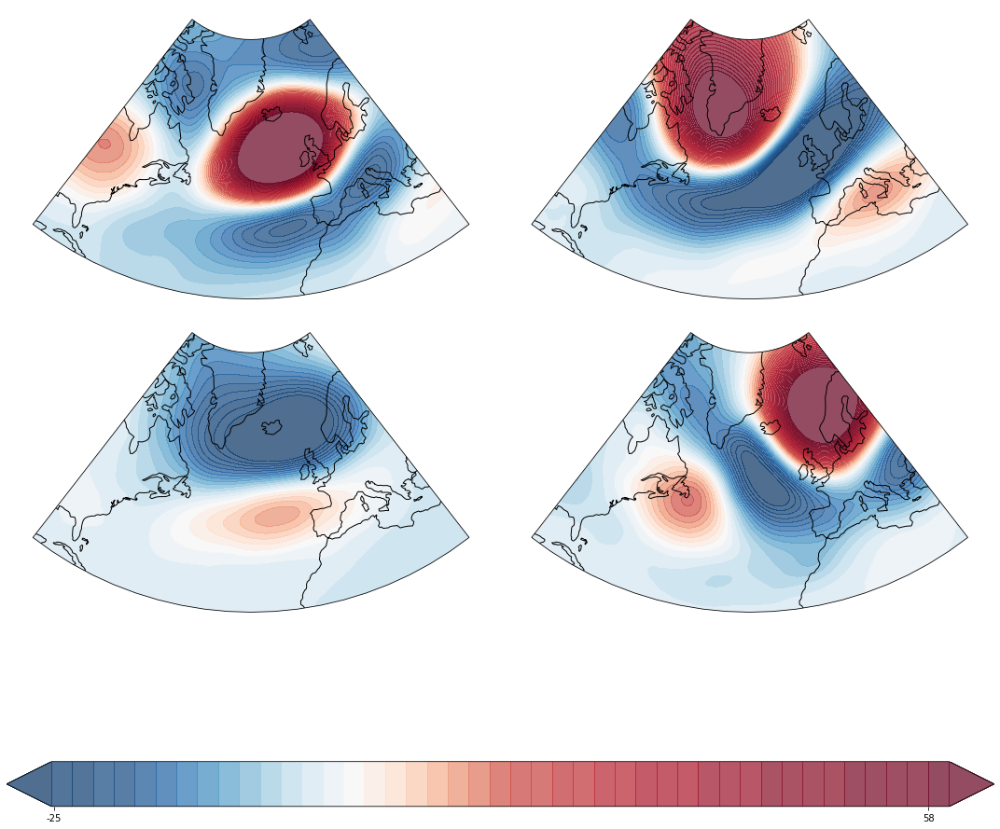

In [29]:
estimator = load_estimator('../models/SUMMER/vae_3months_weeklynormal_7pcs/kmeans_model_ch.pkl')
labels, inertia, _ = extract_regimes(reduced_anomaly, method='kmeans', nb_regimes = 8, estimator = estimator)
plot_regimes(pivot_anomaly, labels)

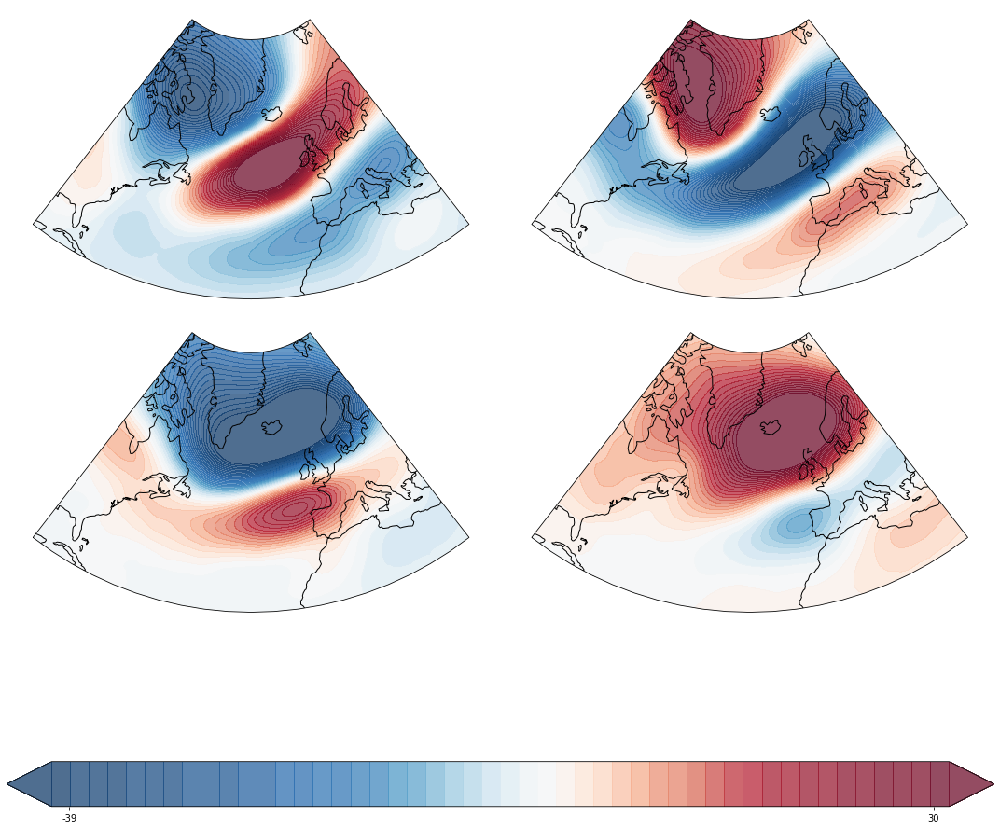

In [30]:
estimator = load_estimator("../models/SUMMER/vae_3months_weeklynormal_7pcs/gmm_model_ch.pkl")
probas, elbo, means, covariances, _ = extract_regimes(reduced_anomaly, method='gmm', nb_regimes = 5, estimator = estimator)
labels = np.argmax(probas, axis=1)
plot_regimes(pivot_anomaly, labels)

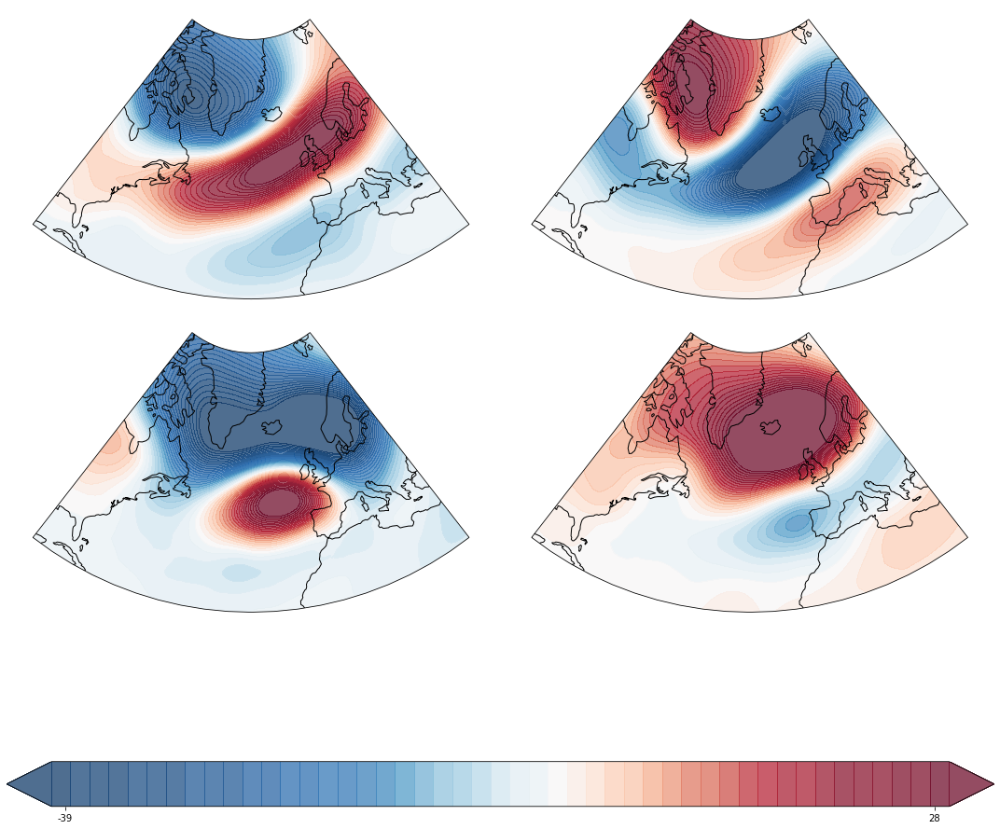

In [31]:
estimator = load_estimator("../models/SUMMER/vae_3months_weeklynormal_7pcs/bayesian_gmm_model_bic.pkl")
probas, elbo, means, covariances, _ = extract_regimes(reduced_anomaly, method='gmm', nb_regimes = 5, estimator = estimator)
labels = np.argmax(probas, axis=1)
plot_regimes(pivot_anomaly, labels)

## Reporting of results

Number of days: 3956, Density of the grid: 21 cells
	func:'reduce_dim' took: 9.0307 sec


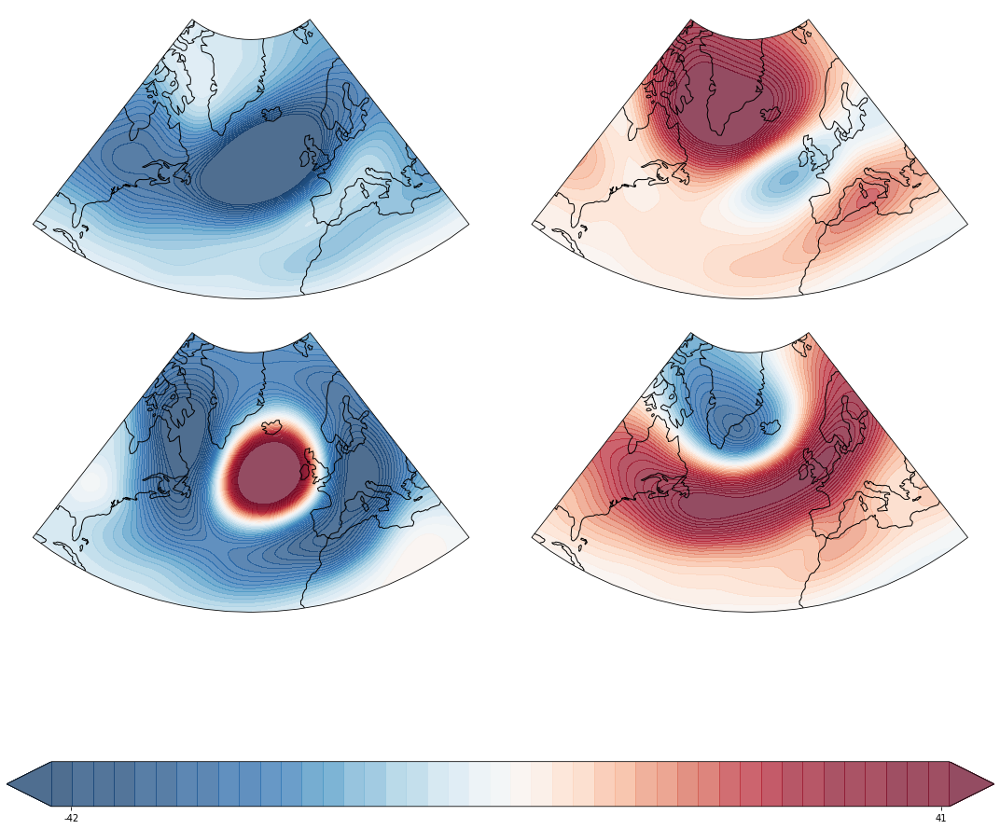

Processing batch 16Number of days: 3956, Density of the grid: 5 cells
	func:'reduce_dim' took: 666.3794 sec


C:\Users\ABALDO\AppData\Roaming\Python\Python36\site-packages\matplotlib\colors.py:1326: RuntimeWarning:

invalid value encountered in log

C:\Users\ABALDO\AppData\Roaming\Python\Python36\site-packages\matplotlib\colors.py:1326: RuntimeWarning:

divide by zero encountered in log

C:\Users\ABALDO\AppData\Roaming\Python\Python36\site-packages\matplotlib\colors.py:1327: RuntimeWarning:

invalid value encountered in multiply



AttributeError: 'NoneType' object has no attribute 'extents'

<Figure size 1080x1080 with 3 Axes>

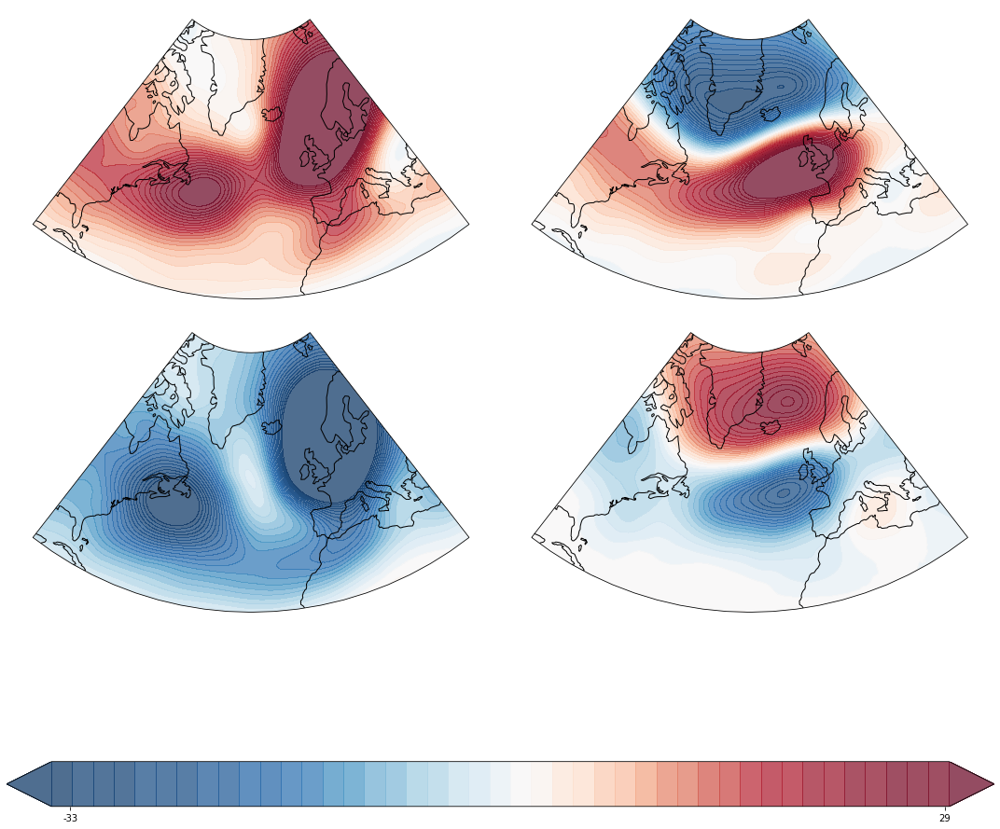

In [25]:
for name, model in zip(['K-Means', 'Bayesian-GMM', 'GMM'],
            ['pca_4months_weeklynormal/kmeans_model_silhouette.pkl',
             'vae_3months_1normal/bayesian_gmm_model_bic.pkl',
             'vae_3months_1normal/gmm_model_ch.pkl']):
    est = load_estimator('../models/SUMMER/'+ model)
    try:
        labels = est.predict(reduced_anomaly.values)
    except:
        if model.startswith('pca'):
            reduced_anomaly = reduce_dim(pivot_anomaly, method='PCA', exp_variance = 21)#exp_variance=0.)
        else:
            reduced_anomaly = reduce_dim(ds, method='VAE', season = 'SUMMER')
        labels = est.predict(reduced_anomaly.values)
        
    plot_regimes(pivot_anomaly, labels)

# SLP

In [1]:
import sys
sys.path.append('../src/')
from modeling.utils.data import *
from modeling.utils.plotting import *
from modeling.utils.config import *
%load_ext autoreload
%autoreload 2

cpu


In [2]:
dt = build_data()
dt = weighted_anomaly(dt)

Reading anomaly from file
	func:'read_nc' took: 0.1769 sec
	func:'build_data' took: 0.1909 sec
	func:'weighted_anomaly' took: 208.5599 sec


In [3]:
pivot_anomaly = flat_table(dt)

	func:'flat_table' took: 0.8248 sec


In [7]:
reduced_anomaly = reduce_dim(pivot_anomaly, method = 'PCA', exp_variance = 5)
#reduced_anomaly = reduce_dim(dt, method = 'VAE', season = 'SUMMER', model = "sigma_vae_statedict_5_SLP")

Number of days: 3956, Density of the grid: 5 cells
	func:'reduce_dim' took: 6.9704 sec


In [8]:
train_X, test_X, pivot_train, pivot_test = train_test_split(reduced_anomaly, pivot_anomaly, test_size = 0.2, random_state = 42)

In [9]:
for model in ['kmeans','bayesian_gmm','gmm']:
    for scoring in  ["score", "ch", "bic", "silhouette"]:
        estimator = cross_val(reduced_anomaly.values, method = model, scoring = scoring, season = "SUMMER", folder = 'SLP_pca_5pcs')

	Combination 1 score: -521201222.400
	Combination 2 score: -521245689.600
	Combination 3 score: -521283801.600
	Combination 4 score: -520933593.600
	Combination 5 score: -521245696.000
	Combination 6 score: -521283795.200
	Combination 7 score: -520715507.200
	Combination 8 score: -521245683.200
	Combination 9 score: -521283788.800
	Combination 10 score: -521114112.000
	Combination 11 score: -521340896.000
	Combination 12 score: -521301779.200
	Combination 13 score: -520708742.400
	Combination 14 score: -521340883.200
	Combination 15 score: -521301766.400
	Combination 16 score: -521114112.000
	Combination 17 score: -521340902.400
	Combination 18 score: -521301779.200
	Combination 19 score: -520403660.800
	Combination 20 score: -520798444.800
	Combination 21 score: -520822572.800
	Combination 22 score: -520403660.800
	Combination 23 score: -520798438.400
	Combination 24 score: -520822579.200
	Combination 25 score: -520403660.800
	Combination 26 score: -520798444.800
	Combination 27 score

	Combination 78 score: 137.614
	Combination 79 score: 137.143
	Combination 80 score: 137.614
	Combination 81 score: 137.614
	Combination 82 score: 137.092
	Combination 83 score: 137.353
	Combination 84 score: 137.353
	Combination 85 score: 137.092
	Combination 86 score: 137.353
	Combination 87 score: 137.353
	Combination 88 score: 137.092
	Combination 89 score: 137.353
	Combination 90 score: 137.353
	Combination 91 score: 137.207
	Combination 92 score: 137.314
	Combination 93 score: 137.311
	Combination 94 score: 137.207
	Combination 95 score: 137.314
	Combination 96 score: 137.311
	Combination 97 score: 137.207
	Combination 98 score: 137.314
	Combination 99 score: 137.311
	Combination 100 score: 137.130
	Combination 101 score: 137.661
	Combination 102 score: 137.659
	Combination 103 score: 137.130
	Combination 104 score: 137.661
	Combination 105 score: 137.659
	Combination 106 score: 137.130
	Combination 107 score: 137.661
	Combination 108 score: 137.659
	Combination 109 score: 128.34

	Combination 19 score: 0.151
	Combination 20 score: 0.151
	Combination 21 score: 0.151
	Combination 22 score: 0.151
	Combination 23 score: 0.151
	Combination 24 score: 0.151
	Combination 25 score: 0.151
	Combination 26 score: 0.151
	Combination 27 score: 0.151
	Combination 28 score: 0.151
	Combination 29 score: 0.151
	Combination 30 score: 0.151
	Combination 31 score: 0.151
	Combination 32 score: 0.151
	Combination 33 score: 0.151
	Combination 34 score: 0.151
	Combination 35 score: 0.151
	Combination 36 score: 0.151
	Combination 37 score: 0.148
	Combination 38 score: 0.151
	Combination 39 score: 0.151
	Combination 40 score: 0.148
	Combination 41 score: 0.151
	Combination 42 score: 0.151
	Combination 43 score: 0.148
	Combination 44 score: 0.151
	Combination 45 score: 0.151
	Combination 46 score: 0.149
	Combination 47 score: 0.151
	Combination 48 score: 0.151
	Combination 49 score: 0.149
	Combination 50 score: 0.151
	Combination 51 score: 0.151
	Combination 52 score: 0.149
	Combination 5

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 8 score: -37.557
	Combination 9 score: -37.677
	Combination 10 score: -37.683
	Combination 11 score: -37.586
	Combination 12 score: -37.586
	Combination 13 score: -37.576
	Combination 14 score: -37.576
	Combination 15 score: -37.583
	Combination 16 score: -37.588
	Combination 17 score: -37.564
	Combination 18 score: -37.568
	Combination 19 score: -37.561
	Combination 20 score: -37.577
	Combination 21 score: -37.558
	Combination 22 score: -37.567
	Combination 23 score: -37.737
	Combination 24 score: -37.566
	Combination 25 score: -38.653
	Combination 26 score: -37.559
	Combination 27 score: -37.574
	Combination 28 score: -37.585
	Combination 29 score: -37.680
	Combination 30 score: -37.668
	Combination 31 score: -37.586
	Combination 32 score: -37.775
	Combination 33 score: -37.562
	Combination 34 score: -37.535
	Combination 35 score: -37.557
	Combination 36 score: -37.556
	Combination 37 score: -37.573
	Combination 38 score: -37.575
	Combination 39 score: -37.584
	Combinati

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or che

	Combination 55 score: -37.563
	Combination 56 score: -37.624
	Combination 57 score: -37.563
	Combination 58 score: -37.598
	Combination 59 score: -37.586
	Combination 60 score: -37.586
	Combination 61 score: -37.788
	Combination 62 score: -37.584
	Combination 63 score: -37.585
	Combination 64 score: -37.785


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 65 score: -37.558
	Combination 66 score: -37.570
	Combination 67 score: nan
	Combination 68 score: -37.551
	Combination 69 score: -37.608
	Combination 70 score: -37.828


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 71 score: -37.647
	Combination 72 score: -37.806
	Combination 73 score: -37.603
	Combination 74 score: -37.561
	Combination 75 score: -37.745
	Combination 76 score: -37.584
	Combination 77 score: -37.558
	Combination 78 score: -37.591
	Combination 79 score: -37.832
	Combination 80 score: nan
	Combination 81 score: nan
	Combination 82 score: -37.704
	Combination 83 score: nan
	Combination 84 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 85 score: -37.545


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or che

	Combination 86 score: -37.617
	Combination 87 score: -37.562
	Combination 88 score: -37.743
	Combination 89 score: nan
	Combination 90 score: nan
	Combination 91 score: -37.584
	Combination 92 score: nan
	Combination 93 score: -37.552
	Combination 94 score: -37.794
	Combination 95 score: nan
	Combination 96 score: -37.577
	Combination 97 score: -37.563
	Combination 98 score: -37.581
	Combination 99 score: -37.553
	Combination 100 score: -37.635
	Combination 101 score: -37.566
	Combination 102 score: -37.564
	Combination 103 score: -37.566


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 104 score: -37.557
	Combination 105 score: nan
	Combination 106 score: -37.579
	Combination 107 score: -37.573
	Combination 108 score: -37.584
	Combination 109 score: -37.670
	Combination 110 score: -37.577
	Combination 111 score: -37.588
	Combination 112 score: -38.514


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 113 score: nan
	Combination 114 score: nan
	Combination 115 score: nan
	Combination 116 score: nan
	Combination 117 score: -37.579
	Combination 118 score: -37.783
	Combination 119 score: -37.566
	Combination 120 score: -37.579
	Combination 121 score: nan
	Combination 122 score: nan
	Combination 123 score: -37.586
	Combination 124 score: nan
	Combination 125 score: nan
	Combination 126 score: -37.832
	Combination 127 score: -37.574
	Combination 128 score: -37.928
Validation process ended with score -37.53542629688718
Best parameters: {'covariance_prior': None, 'covariance_type': 'full', 'degrees_of_freedom_prior': None, 'init_params': 'kmeans', 'max_iter': 100, 'mean_precision_prior': None, 'mean_prior': None, 'n_components': 5, 'n_init': 5, 'random_state': 42, 'reg_covar': 1e-06, 'tol': 0.001, 'verbose': 0, 'verbose_interval': 10, 'warm_start': False, 'weight_concentration_prior': None, 'weight_concentration_prior_type': 'dirichlet_distribution'}
	func:'cross_val' took: 40

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 4 score: 100.395
	Combination 5 score: 73.816
	Combination 6 score: 96.813
	Combination 7 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 8 score: 118.078
	Combination 9 score: 49.947
	Combination 10 score: nan
	Combination 11 score: nan
	Combination 12 score: nan
	Combination 13 score: nan
	Combination 14 score: nan
	Combination 15 score: nan
	Combination 16 score: nan
	Combination 17 score: 125.951
	Combination 18 score: 150.112
	Combination 19 score: 154.439
	Combination 20 score: 171.120
	Combination 21 score: 79.851
	Combination 22 score: 94.898
	Combination 23 score: 92.567
	Combination 24 score: nan
	Combination 25 score: nan
	Combination 26 score: nan
	Combination 27 score: nan
	Combination 28 score: nan
	Combination 29 score: 62.514
	Combination 30 score: nan
	Combination 31 score: nan
	Combination 32 score: nan
	Combination 33 score: nan
	Combination 34 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 35 score: 93.159
	Combination 36 score: nan
	Combination 37 score: 72.840
	Combination 38 score: 77.759


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 39 score: 179.762


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 40 score: 137.763
	Combination 41 score: 92.007
	Combination 42 score: nan
	Combination 43 score: nan
	Combination 44 score: nan
	Combination 45 score: 111.133
	Combination 46 score: nan
	Combination 47 score: nan
	Combination 48 score: nan
	Combination 49 score: 160.835
	Combination 50 score: nan
	Combination 51 score: 121.857
	Combination 52 score: 139.122
	Combination 53 score: 82.418
	Combination 54 score: 129.237
	Combination 55 score: nan
	Combination 56 score: 84.052
	Combination 57 score: nan
	Combination 58 score: 143.439
	Combination 59 score: nan
	Combination 60 score: nan
	Combination 61 score: 160.670
	Combination 62 score: nan
	Combination 63 score: nan
	Combination 64 score: nan
	Combination 65 score: 69.614
	Combination 66 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 67 score: 88.853
	Combination 68 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 69 score: 84.752


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 70 score: 121.839


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 71 score: 107.266
	Combination 72 score: 73.372
	Combination 73 score: nan
	Combination 74 score: nan
	Combination 75 score: nan
	Combination 76 score: nan
	Combination 77 score: 123.770
	Combination 78 score: nan
	Combination 79 score: nan
	Combination 80 score: nan
	Combination 81 score: 119.893
	Combination 82 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 83 score: nan
	Combination 84 score: nan
	Combination 85 score: 109.836
	Combination 86 score: 57.023
	Combination 87 score: 97.159
	Combination 88 score: 106.677
	Combination 89 score: 73.596
	Combination 90 score: nan
	Combination 91 score: nan
	Combination 92 score: nan
	Combination 93 score: 71.983
	Combination 94 score: nan
	Combination 95 score: nan
	Combination 96 score: nan
	Combination 97 score: 103.951


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 98 score: 106.540
	Combination 99 score: nan
	Combination 100 score: 184.611


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 101 score: 5.558


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 102 score: 133.927


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 103 score: 104.604
	Combination 104 score: nan
	Combination 105 score: nan
	Combination 106 score: 125.842
	Combination 107 score: nan
	Combination 108 score: nan
	Combination 109 score: 63.826
	Combination 110 score: nan
	Combination 111 score: nan
	Combination 112 score: nan
	Combination 113 score: 64.608
	Combination 114 score: nan
	Combination 115 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 116 score: nan
	Combination 117 score: 50.845
	Combination 118 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 119 score: 61.208
	Combination 120 score: nan
	Combination 121 score: nan
	Combination 122 score: nan
	Combination 123 score: nan
	Combination 124 score: nan
	Combination 125 score: nan
	Combination 126 score: 119.354
	Combination 127 score: nan
	Combination 128 score: nan
Validation process ended with score 184.6107826713068
Best parameters: {'covariance_prior': None, 'covariance_type': 'full', 'degrees_of_freedom_prior': None, 'init_params': 'kmeans', 'max_iter': 100, 'mean_precision_prior': None, 'mean_prior': None, 'n_components': 7, 'n_init': 5, 'random_state': 42, 'reg_covar': 1e-06, 'tol': 1e-07, 'verbose': 0, 'verbose_interval': 10, 'warm_start': False, 'weight_concentration_prior': None, 'weight_concentration_prior_type': 'dirichlet_distribution'}
	func:'cross_val' took: 4918.2552 sec
	Combination 1 score: -30104.470
	Combination 2 score: -30111.552
	Combination 3 score: -30238.690
	Combination 4 score: -30099.912
	Combination 5 score: -30180.516
	Combination 6 sc

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 34 score: -30287.483


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 35 score: -30688.459
	Combination 36 score: -30250.146
	Combination 37 score: -30176.400


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 38 score: -30436.261


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 39 score: -30608.028
	Combination 40 score: -30159.332
	Combination 41 score: -30175.151
	Combination 42 score: -30115.815
	Combination 43 score: -30083.999
	Combination 44 score: -29999.657
	Combination 45 score: -30274.874
	Combination 46 score: -30133.753
	Combination 47 score: -30078.021
	Combination 48 score: -30064.607
	Combination 49 score: -30175.420
	Combination 50 score: -30139.919
	Combination 51 score: -30429.246
	Combination 52 score: -30160.099
	Combination 53 score: -30209.924
	Combination 54 score: -30495.238
	Combination 55 score: -30472.404
	Combination 56 score: -30187.970
	Combination 57 score: -30110.814
	Combination 58 score: -30058.902
	Combination 59 score: -30041.420
	Combination 60 score: -30155.056
	Combination 61 score: -30426.980
	Combination 62 score: -30186.014
	Combination 63 score: -30192.643
	Combination 64 score: -30262.043
	Combination 65 score: -30264.329
	Combination 66 score: -30216.214
	Combination 67 score: -30295.777
	Combination 6

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 70 score: -30232.763
	Combination 71 score: -30298.994
	Combination 72 score: -30019.949
	Combination 73 score: -30133.917
	Combination 74 score: -30019.553
	Combination 75 score: -30072.852
	Combination 76 score: -30019.264
	Combination 77 score: nan
	Combination 78 score: -30208.643
	Combination 79 score: -30281.636
	Combination 80 score: -30023.600
	Combination 81 score: -30459.621
	Combination 82 score: -30299.718
	Combination 83 score: nan
	Combination 84 score: -30329.437
	Combination 85 score: -30146.191
	Combination 86 score: -30130.245
	Combination 87 score: -30401.039
	Combination 88 score: -30154.418
	Combination 89 score: -30089.423
	Combination 90 score: -30233.249
	Combination 91 score: -30019.335
	Combination 92 score: nan
	Combination 93 score: -30127.317
	Combination 94 score: -30286.012
	Combination 95 score: -30130.390
	Combination 96 score: -30334.357
	Combination 97 score: -30039.519


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 98 score: -30325.402
	Combination 99 score: -30615.922
	Combination 100 score: -30375.723
	Combination 101 score: -30248.955
	Combination 102 score: -30222.226
	Combination 103 score: -30128.804
	Combination 104 score: -30039.319
	Combination 105 score: nan
	Combination 106 score: nan
	Combination 107 score: -30067.044
	Combination 108 score: -30039.205
	Combination 109 score: -30297.386
	Combination 110 score: -30266.173
	Combination 111 score: -30429.688
	Combination 112 score: -30313.741
	Combination 113 score: nan
	Combination 114 score: nan
	Combination 115 score: -30573.878


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 116 score: nan
	Combination 117 score: -30550.352
	Combination 118 score: -30242.067
	Combination 119 score: -30299.017
	Combination 120 score: -30243.177
	Combination 121 score: nan
	Combination 122 score: nan
	Combination 123 score: nan
	Combination 124 score: -30039.385
	Combination 125 score: -30295.695
	Combination 126 score: -30252.286
	Combination 127 score: -30388.636
	Combination 128 score: -30039.688
Validation process ended with score -29979.279388108658
Best parameters: {'covariance_prior': None, 'covariance_type': 'full', 'degrees_of_freedom_prior': None, 'init_params': 'kmeans', 'max_iter': 3000, 'mean_precision_prior': None, 'mean_prior': None, 'n_components': 4, 'n_init': 10, 'random_state': 42, 'reg_covar': 1e-06, 'tol': 1e-07, 'verbose': 0, 'verbose_interval': 10, 'warm_start': False, 'weight_concentration_prior': None, 'weight_concentration_prior_type': 'dirichlet_distribution'}
	func:'cross_val' took: 5133.4529 sec
	Combination 1 score: 0.110
	Combinati

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 4 score: 0.112
	Combination 5 score: nan
	Combination 6 score: 0.092
	Combination 7 score: 0.195


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 8 score: 0.138
	Combination 9 score: 0.043
	Combination 10 score: 0.167
	Combination 11 score: nan
	Combination 12 score: nan
	Combination 13 score: nan
	Combination 14 score: 0.116
	Combination 15 score: nan
	Combination 16 score: nan
	Combination 17 score: 0.118
	Combination 18 score: nan
	Combination 19 score: 0.048
	Combination 20 score: 0.077
	Combination 21 score: nan
	Combination 22 score: 0.144
	Combination 23 score: 0.068
	Combination 24 score: 0.055
	Combination 25 score: 0.063
	Combination 26 score: nan
	Combination 27 score: nan
	Combination 28 score: nan
	Combination 29 score: -0.046
	Combination 30 score: nan
	Combination 31 score: nan
	Combination 32 score: nan
	Combination 33 score: 0.183


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 34 score: 0.180
	Combination 35 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check fo

	Combination 36 score: 0.088
	Combination 37 score: nan
	Combination 38 score: nan
	Combination 39 score: nan
	Combination 40 score: -0.063
	Combination 41 score: nan
	Combination 42 score: nan
	Combination 43 score: nan
	Combination 44 score: nan
	Combination 45 score: nan
	Combination 46 score: nan
	Combination 47 score: nan
	Combination 48 score: nan
	Combination 49 score: 0.090
	Combination 50 score: nan
	Combination 51 score: 0.051
	Combination 52 score: nan
	Combination 53 score: nan
	Combination 54 score: nan
	Combination 55 score: nan
	Combination 56 score: 0.087
	Combination 57 score: nan
	Combination 58 score: nan
	Combination 59 score: nan
	Combination 60 score: nan
	Combination 61 score: nan
	Combination 62 score: nan
	Combination 63 score: nan
	Combination 64 score: nan
	Combination 65 score: 0.161
	Combination 66 score: 0.116
	Combination 67 score: 0.169
	Combination 68 score: nan
	Combination 69 score: nan
	Combination 70 score: 0.110
	Combination 71 score: nan
	Combinat

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or che

	Combination 87 score: nan
	Combination 88 score: nan
	Combination 89 score: nan
	Combination 90 score: nan
	Combination 91 score: nan
	Combination 92 score: nan
	Combination 93 score: nan
	Combination 94 score: nan
	Combination 95 score: nan
	Combination 96 score: nan
	Combination 97 score: 0.153


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 98 score: 0.072
	Combination 99 score: 0.093
	Combination 100 score: 0.155
	Combination 101 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 102 score: 0.050
	Combination 103 score: nan


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 104 score: 0.043
	Combination 105 score: nan
	Combination 106 score: 0.176
	Combination 107 score: nan
	Combination 108 score: nan
	Combination 109 score: nan
	Combination 110 score: nan
	Combination 111 score: nan
	Combination 112 score: nan
	Combination 113 score: nan
	Combination 114 score: nan
	Combination 115 score: nan
	Combination 116 score: 0.186
	Combination 117 score: 0.035
	Combination 118 score: 0.084
	Combination 119 score: 0.148


c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 120 score: 0.086
	Combination 121 score: nan
	Combination 122 score: 0.034
	Combination 123 score: nan
	Combination 124 score: nan
	Combination 125 score: nan
	Combination 126 score: nan
	Combination 127 score: nan
	Combination 128 score: nan
Validation process ended with score 0.19500687718391418
Best parameters: {'covariance_prior': None, 'covariance_type': 'full', 'degrees_of_freedom_prior': None, 'init_params': 'random', 'max_iter': 100, 'mean_precision_prior': None, 'mean_prior': None, 'n_components': 4, 'n_init': 5, 'random_state': 42, 'reg_covar': 1e-06, 'tol': 1e-07, 'verbose': 0, 'verbose_interval': 10, 'warm_start': False, 'weight_concentration_prior': None, 'weight_concentration_prior_type': 'dirichlet_process'}
	func:'cross_val' took: 5358.4755 sec
	Combination 1 score: nan
	Combination 2 score: -37.528
	Combination 3 score: -37.523
	Combination 4 score: -37.523
	Combination 5 score: -37.535
	Combination 6 score: -37.522
	Combination 7 score: -37.523
	Combinati

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 3 score: 98.108
	Combination 4 score: 98.758
	Combination 5 score: 98.682
	Combination 6 score: 101.190
	Combination 7 score: 100.096
	Combination 8 score: 98.576
	Combination 9 score: 101.187
	Combination 10 score: 102.598
	Combination 11 score: 98.240
	Combination 12 score: 95.730
	Combination 13 score: 96.077
	Combination 14 score: 97.852
	Combination 15 score: 100.009
	Combination 16 score: 96.035
	Combination 17 score: 97.723
	Combination 18 score: 96.713
	Combination 19 score: 96.325
	Combination 20 score: 98.778
	Combination 21 score: 95.677
	Combination 22 score: 95.561
	Combination 23 score: 97.514
	Combination 24 score: 97.771
	Combination 25 score: 99.874
	Combination 26 score: 98.375
	Combination 27 score: 98.871
	Combination 28 score: 97.696
	Combination 29 score: 98.246
	Combination 30 score: 102.181
	Combination 31 score: 102.311
	Combination 32 score: 99.278
	Combination 33 score: 98.543
	Combination 34 score: 98.614
	Combination 35 score: 97.878
	Combinati

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 42 score: 101.620
	Combination 43 score: 102.677
	Combination 44 score: 98.525
	Combination 45 score: 101.298
	Combination 46 score: 102.835
	Combination 47 score: 98.073
	Combination 48 score: 99.937
	Combination 49 score: 102.678
	Combination 50 score: 99.821
	Combination 51 score: 98.835
	Combination 52 score: 100.519
	Combination 53 score: 99.720
	Combination 54 score: 96.414
	Combination 55 score: 96.339
	Combination 56 score: 98.082
	Combination 57 score: 95.671
	Combination 58 score: 96.580
	Combination 59 score: 97.866
	Combination 60 score: 96.786
	Combination 61 score: 98.209
	Combination 62 score: 99.423
	Combination 63 score: 100.747
	Combination 64 score: 101.638
	Combination 65 score: 100.396
	Combination 66 score: 97.725
	Combination 67 score: 95.976
	Combination 68 score: 97.839
	Combination 69 score: 95.651
	Combination 70 score: 89.645
	Combination 71 score: 94.040
	Combination 72 score: 95.143
	Combination 73 score: 96.225
	Combination 74 score: 98.033
	

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	Combination 3 score: -59938.935
	Combination 4 score: -59940.045
	Combination 5 score: -59940.139
	Combination 6 score: -59929.920
	Combination 7 score: -59929.117
	Combination 8 score: -59935.862
	Combination 9 score: -59930.011
	Combination 10 score: -59930.356
	Combination 11 score: -59937.890
	Combination 12 score: -59931.005
	Combination 13 score: -59928.650
	Combination 14 score: -59932.656
	Combination 15 score: -59929.806
	Combination 16 score: -59930.959
	Combination 17 score: -59941.499
	Combination 18 score: -59930.461
	Combination 19 score: -59930.692
	Combination 20 score: -59932.471
	Combination 21 score: -59930.122
	Combination 22 score: -59938.139
	Combination 23 score: -59932.804
	Combination 24 score: -59929.282
	Combination 25 score: -59931.631
	Combination 26 score: -59931.378
	Combination 27 score: -59933.114
	Combination 28 score: -59929.811
	Combination 29 score: -59929.584
	Combination 30 score: -59932.342
	Combination 31 score: -59930.619
	Combination 32 score

	Combination 103 score: 0.096
	Combination 104 score: 0.092
	Combination 105 score: 0.094
	Combination 106 score: 0.093
	Combination 107 score: 0.090
	Combination 108 score: 0.091
	Combination 109 score: 0.090
	Combination 110 score: 0.090
	Combination 111 score: 0.091
	Combination 112 score: 0.090
	Combination 113 score: 0.091
	Combination 114 score: 0.091
	Combination 115 score: 0.094
	Combination 116 score: 0.089
	Combination 117 score: 0.089
	Combination 118 score: 0.088
	Combination 119 score: 0.090
	Combination 120 score: 0.089
	Combination 121 score: 0.090
	Combination 122 score: 0.090
	Combination 123 score: 0.089
	Combination 124 score: 0.089
	Combination 125 score: 0.091
	Combination 126 score: 0.092
	Combination 127 score: 0.097
	Combination 128 score: 0.095
	Combination 129 score: 0.094
	Combination 130 score: 0.093
	Combination 131 score: 0.090
	Combination 132 score: 0.092
	Combination 133 score: 0.092
	Combination 134 score: 0.090
	Combination 135 score: 0.087
	Combinati

### SLP PCA

In [9]:
get_statistics(f'../models/{season}/SLP', train_X, test_X)

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	func:'get_statistics' took: 81.9807 sec


,Number of Clusters,BIC,Silhouette Score,Calinski Harabsz Index,Inertia
bayesian_gmm_model_bic.pkl,4,-123105.372210,0.056640,53.139011,1.229279e+09
bayesian_gmm_model_score.pkl,4,-123281.940362,0.011072,32.748645,1.241005e+09
gmm_model_bic.pkl,4,-123255.284410,0.023490,39.123267,1.212886e+09
gmm_model_ch.pkl,4,-122990.808935,0.032837,46.814125,1.182560e+09
gmm_model_score.pkl,4,-123236.999361,0.025377,39.891428,1.210132e+09
gmm_model_silhouette.pkl,5,-123262.118563,0.025756,38.658860,1.213251e+09
kmeans_model_bic.pkl,7,-121878.230892,0.067908,59.979598,9.574800e+08
kmeans_model_ch.pkl,4,-121985.738143,0.078430,86.236068,1.046797e+09
kmeans_model_score.pkl,7,-121873.987500,0.068434,60.051745,9.570779e+08
kmeans_model_silhouette.pkl,4,-121984.849322,0.078339,86.201225,1.046690e+09


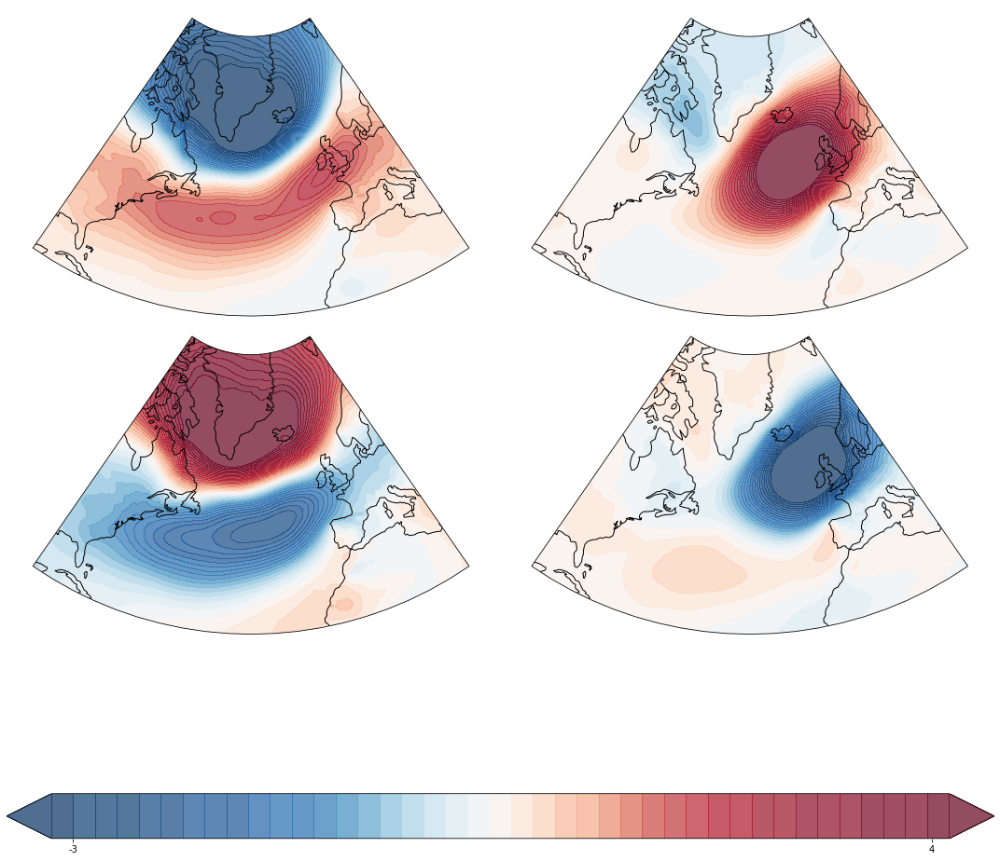

In [7]:
estimator = load_estimator(f'../models/{season}/SLP/kmeans_model_ch.pkl')
outputs = extract_regimes(reduced_anomaly, method='kmeans', nb_regimes = None, estimator = estimator)
labels, inertias, _ = outputs
plot_regimes(pivot_anomaly, labels)

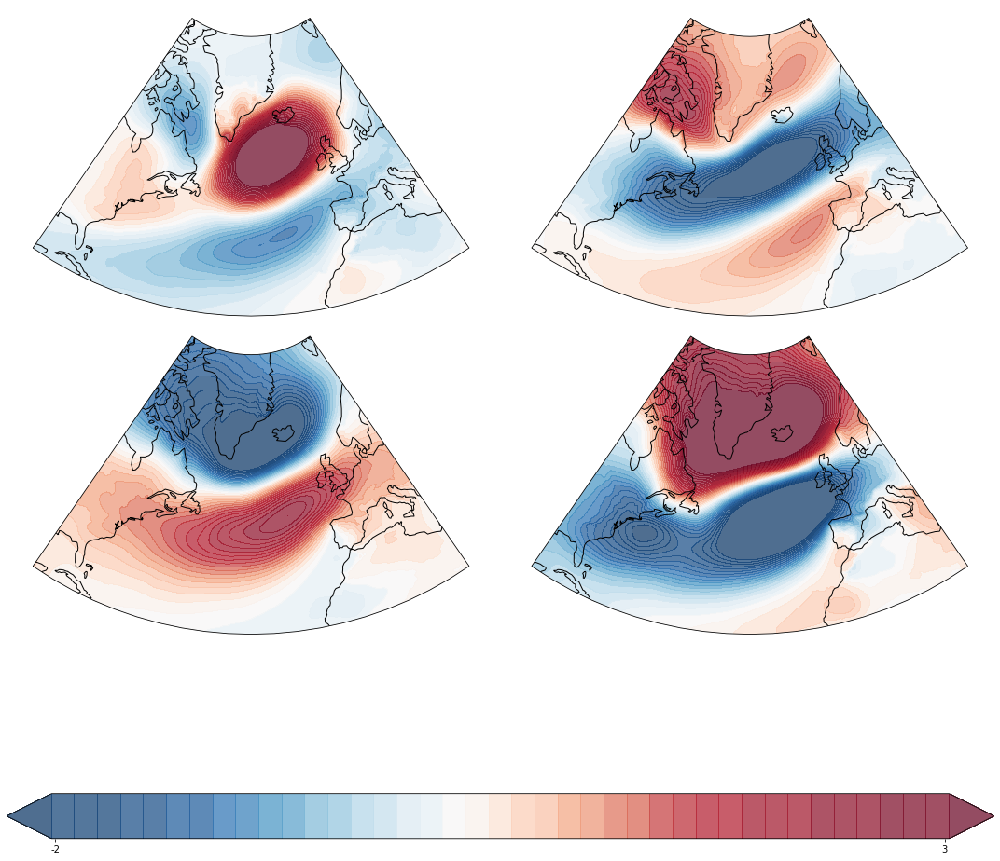

In [11]:
estimator = load_estimator(f'../models/{season}/SLP/gmm_model_ch.pkl')
probas, elbo, means, covariances, _ = extract_regimes(reduced_anomaly, method='gmm', nb_regimes = 5, estimator = estimator)
labels = np.argmax(probas, axis=1)
plot_regimes(pivot_anomaly, labels)

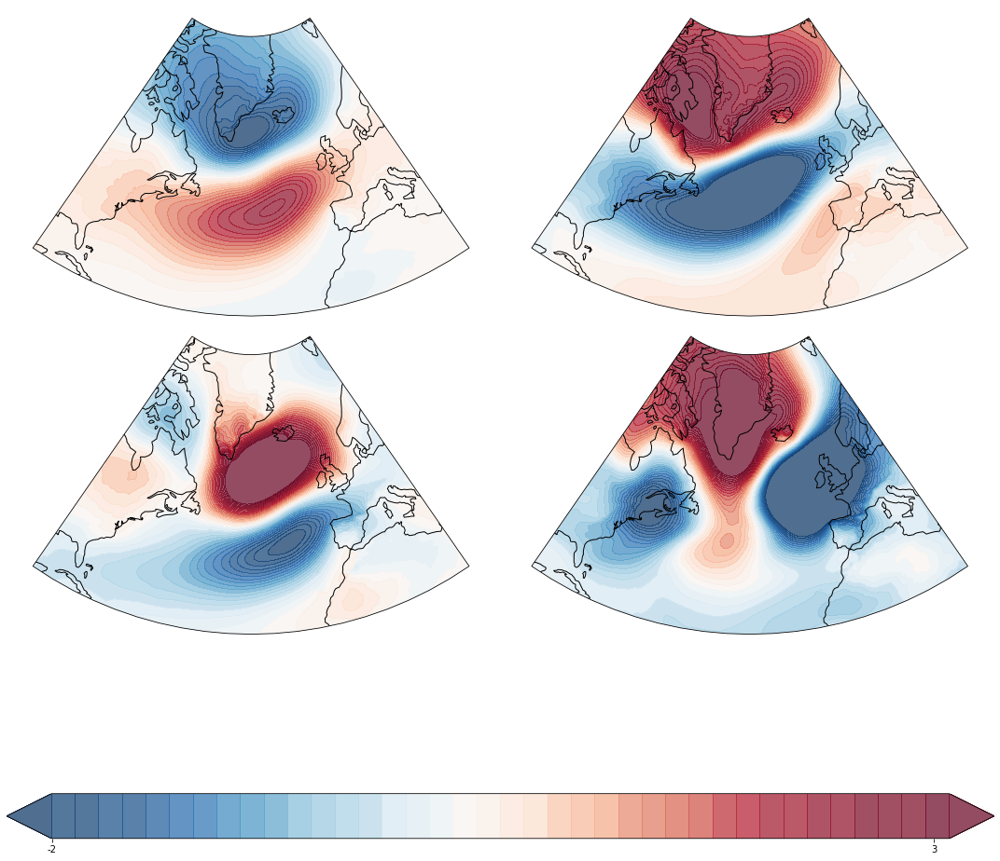

In [12]:
estimator = load_estimator(f'../models/{season}/SLP/bayesian_gmm_model_bic.pkl')
probas, elbo, means, covariances, _ = extract_regimes(reduced_anomaly, method='bayesian_gmm', nb_regimes = 5, estimator = estimator)
labels = np.argmax(probas, axis=1)
plot_regimes(pivot_anomaly, labels)

### SLP PCA 5 PCs

In [6]:
get_statistics(f'../models/{season}/SLP_pca_5pcs', train_X, test_X)

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	func:'get_statistics' took: 81.8845 sec


,Number of Clusters,BIC,Silhouette Score,Calinski Harabsz Index,Inertia
bayesian_gmm_model_bic.pkl,4,-30386.604420,0.077940,80.971865,6.759354e+08
bayesian_gmm_model_ch.pkl,4,-30523.709252,0.077214,101.932571,6.422625e+08
bayesian_gmm_model_score.pkl,5,-30519.054264,0.079749,100.018284,5.886799e+08
bayesian_gmm_model_silhouette.pkl,7,-30316.967747,-0.067451,42.813506,6.948326e+08
gmm_model_bic.pkl,4,-30524.636651,0.083985,94.883633,6.478257e+08
gmm_model_ch.pkl,4,-30517.240223,0.085879,107.745981,6.338920e+08
gmm_model_score.pkl,5,-30524.134599,0.086091,96.884199,6.487660e+08
gmm_model_silhouette.pkl,4,-30477.634896,0.094255,99.286499,6.459703e+08
kmeans_model_bic.pkl,4,-30164.289215,0.148842,169.482134,5.295021e+08
kmeans_model_ch.pkl,4,-30163.346856,0.149294,169.673704,5.292352e+08


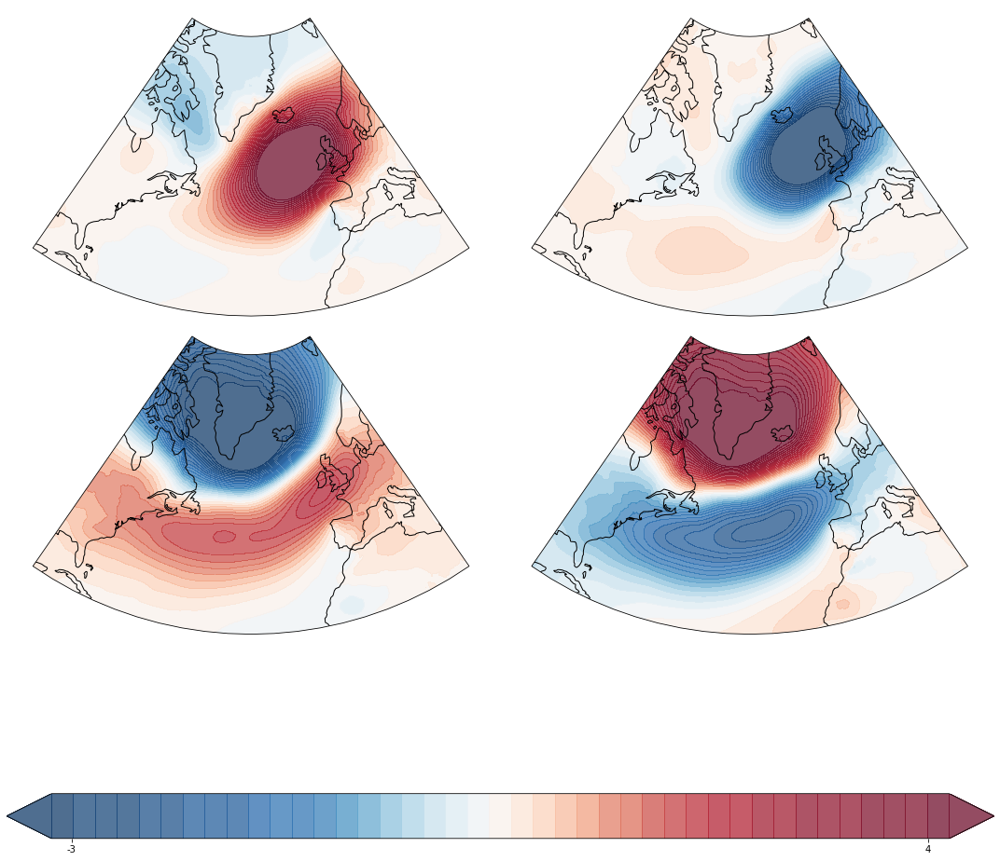

In [7]:
estimator = load_estimator(f'../models/{season}/SLP_pca_5pcs/kmeans_model_ch.pkl')
outputs = extract_regimes(reduced_anomaly, method='kmeans', nb_regimes = None, estimator = estimator)
labels, inertias, _ = outputs
plot_regimes(pivot_anomaly, labels)

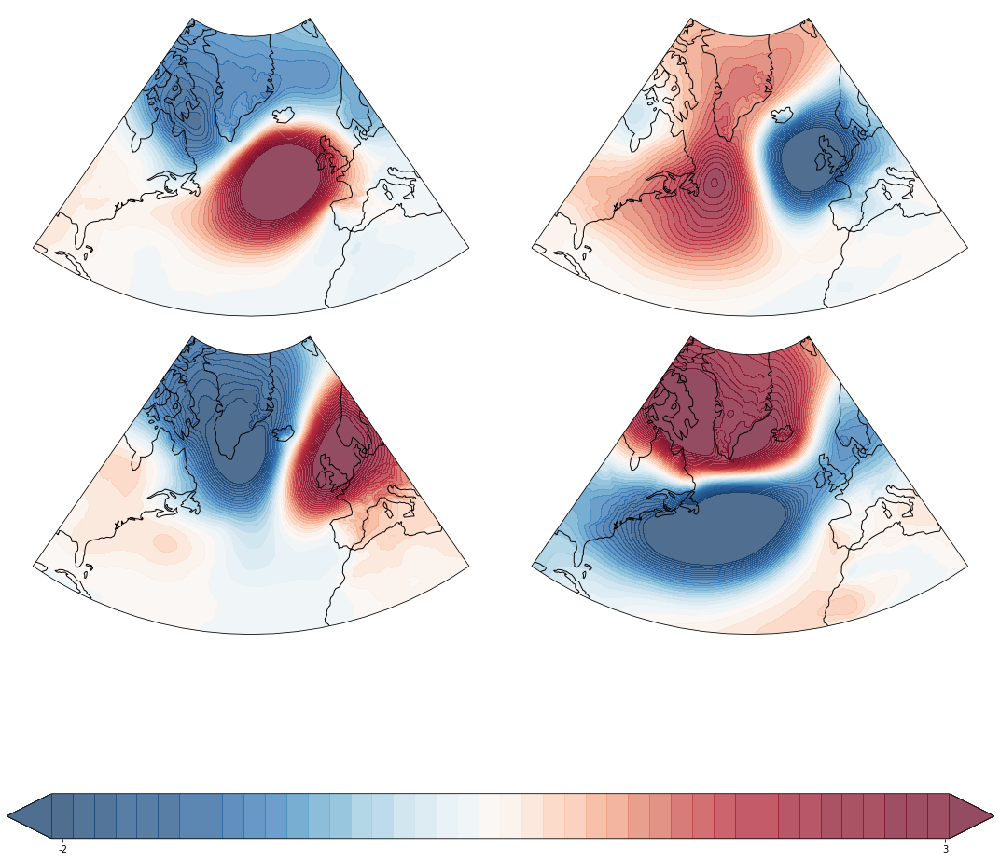

In [10]:
estimator = load_estimator(f'../models/{season}/SLP_pca_5pcs/gmm_model_ch.pkl')
probas, elbo, means, covariances, _ = extract_regimes(reduced_anomaly, method='gmm', nb_regimes = 5, estimator = estimator)
labels = np.argmax(probas, axis=1)
plot_regimes(pivot_anomaly, labels)

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



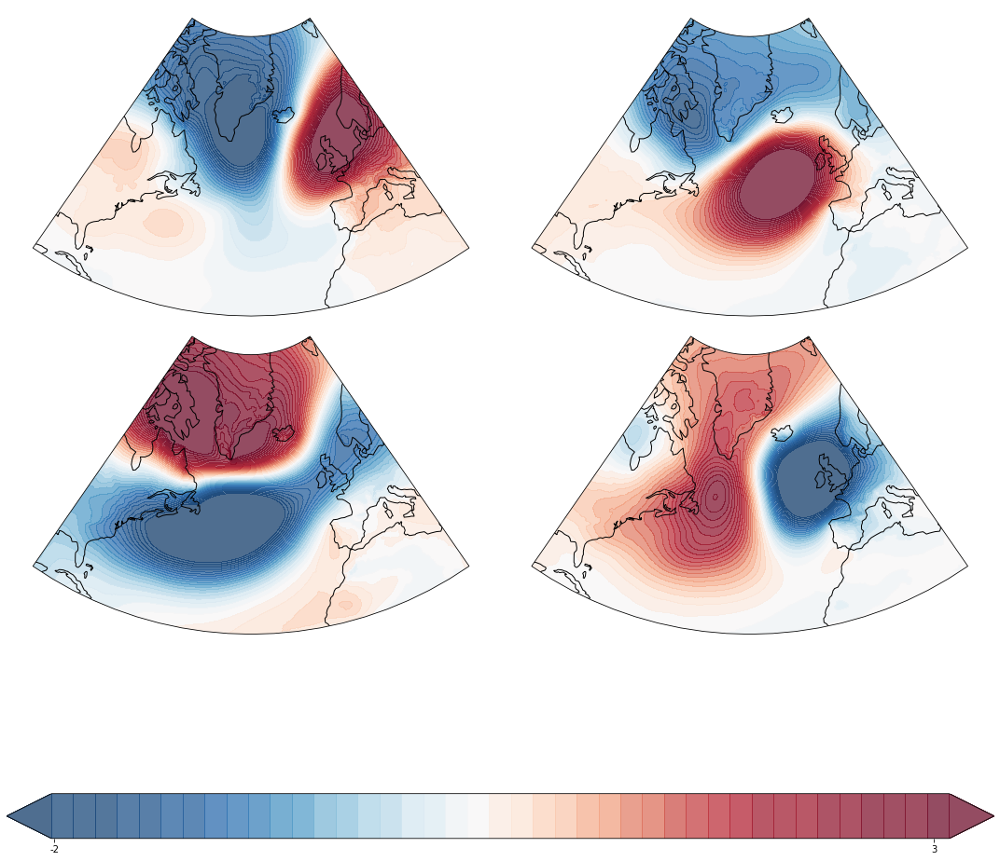

In [11]:
estimator = load_estimator(f'../models/{season}/SLP_pca_5pcs/bayesian_gmm_model_ch.pkl')
probas, elbo, means, covariances, _ = extract_regimes(reduced_anomaly, method='bayesian_gmm', nb_regimes = 5, estimator = estimator)
labels = np.argmax(probas, axis=1)
plot_regimes(pivot_anomaly, labels)

### SLP VAE

In [33]:
def performance_matrix2(estimator, train_X, val_X):
    '''
    Method to evaluate an estimator, on different evaluation metrics
    Args:
        estimator: the clustering algorithm to be tested, or the path to the pickle file to load the estimator

    Returns:
        a pandas DataFrame comparing several estimators
    '''

    if isinstance(estimator, str):
        estimator = load_estimator(estimator)

    labels = estimator.fit(train_X).predict(val_X)
    if not all([l == labels[0] for l in labels]):
        return {
            # "Internal score": estimator.score(val_X, labels),
            "Number of Clusters": estimator.get_params()['n_clusters'
            if 'n_clusters' in estimator.get_params() else 'n_components'],
            "BIC": bic_score(val_X, labels,
                             estimator.cluster_centers_ if hasattr(estimator, "cluster_centers_") else estimator.means_),
            "Silhouette Score": silhouette_score(val_X, labels),
            "Calinski Harabsz Index": calinski_harabasz_score(val_X, labels),
            "Inertia": get_inertia(val_X, labels,
                                   estimator.cluster_centers_ if hasattr(estimator,
                                                                         "cluster_centers_") else estimator.means_),

        }
    else:
        return {
            # "Internal score": estimator.score(val_X, labels),
            "Number of Clusters": estimator.get_params()['n_clusters'
            if 'n_clusters' in estimator.get_params() else 'n_components'],
            "BIC": bic_score(val_X, labels,
                             estimator.cluster_centers_ if hasattr(estimator, "cluster_centers_") else estimator.means_),
            "Silhouette Score": "NaN",
            "Calinski Harabsz Index": "NaN",
            "Inertia": get_inertia(val_X, labels,
                                   estimator.cluster_centers_ if hasattr(estimator,
                                                                         "cluster_centers_") else estimator.means_),

        }
        

def get_statistics2(folder, train, test):
    '''
    Method to collect the statistics about the models' performances
    Args:
        folder: name of the folder where there are pickle files of the model
        train: the train dataset used to fit the model
        test: the test dataset used to evaluate the performance on

    Returns:
        A pandas DataFrame containing the statistics

    '''

    return pd.DataFrame.from_dict({model: performance_matrix2(folder + '/' + model,
                                                      train.values, test.values) \
                            for model in os.listdir(folder) if
                            model.endswith('pkl')},
                           orient='index')

In [34]:
get_statistics2(f'../models/{season}/SLP_vae', train_X, test_X)

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



,Number of Clusters,BIC,Silhouette Score,Calinski Harabsz Index,Inertia
bayesian_gmm_model_bic.pkl,4,-5351.459300,NaN,NaN,3322.307189
bayesian_gmm_model_ch.pkl,7,-6029.413485,-0.00216252,52.6123,2456.286390
bayesian_gmm_model_score.pkl,4,-5351.457786,NaN,NaN,3322.304650
bayesian_gmm_model_silhouette.pkl,7,-6374.080337,0.0173306,35.5171,2730.565061
gmm_model_bic.pkl,4,-5499.177824,-0.0923931,21.5599,3113.815861
gmm_model_ch.pkl,4,-5956.770114,0.0863282,81.3621,2633.380191
gmm_model_score.pkl,4,-5588.416055,0.0355738,15.78,3272.146743
gmm_model_silhouette.pkl,7,-5431.569519,0.220675,25.1889,3243.528883
kmeans_model_bic.pkl,4,-5646.299493,0.136554,133.532,2214.826784
kmeans_model_ch.pkl,4,-5646.718487,0.136349,133.473,2215.135431


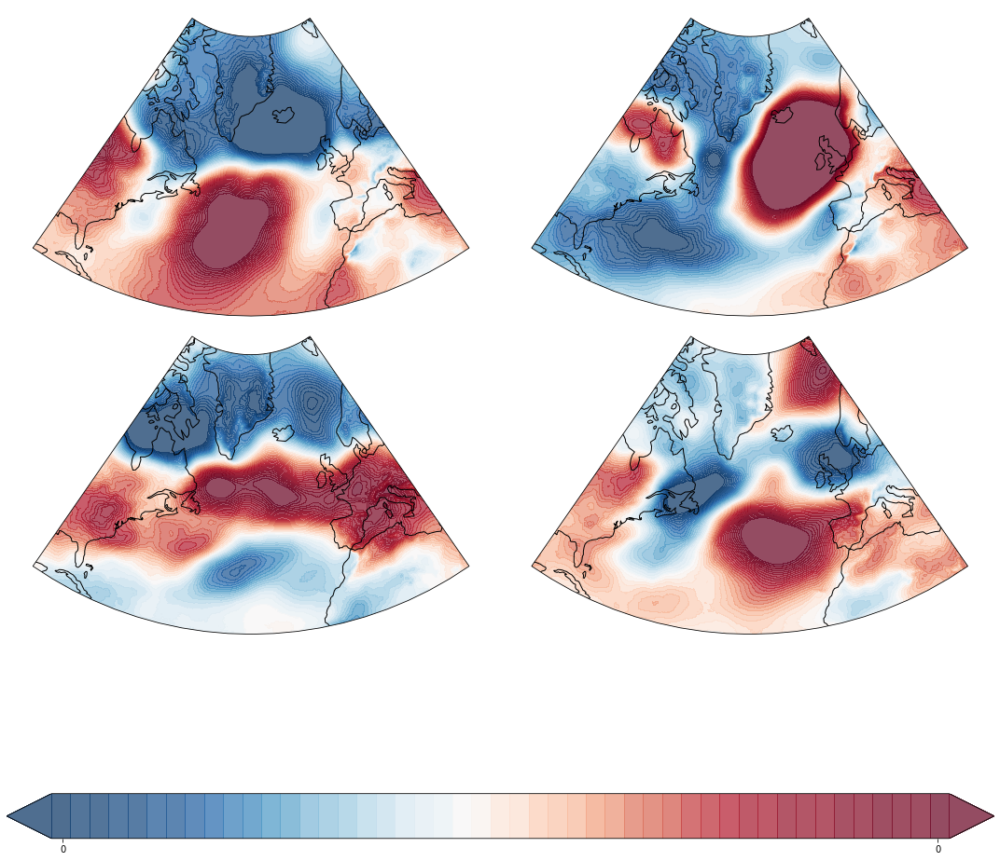

In [35]:
estimator = load_estimator(f'../models/{season}/SLP_vae/kmeans_model_bic.pkl')
outputs = extract_regimes(reduced_anomaly, method='kmeans', nb_regimes = None, estimator = estimator)
labels, inertias, _ = outputs
plot_regimes(pivot_anomaly, labels)

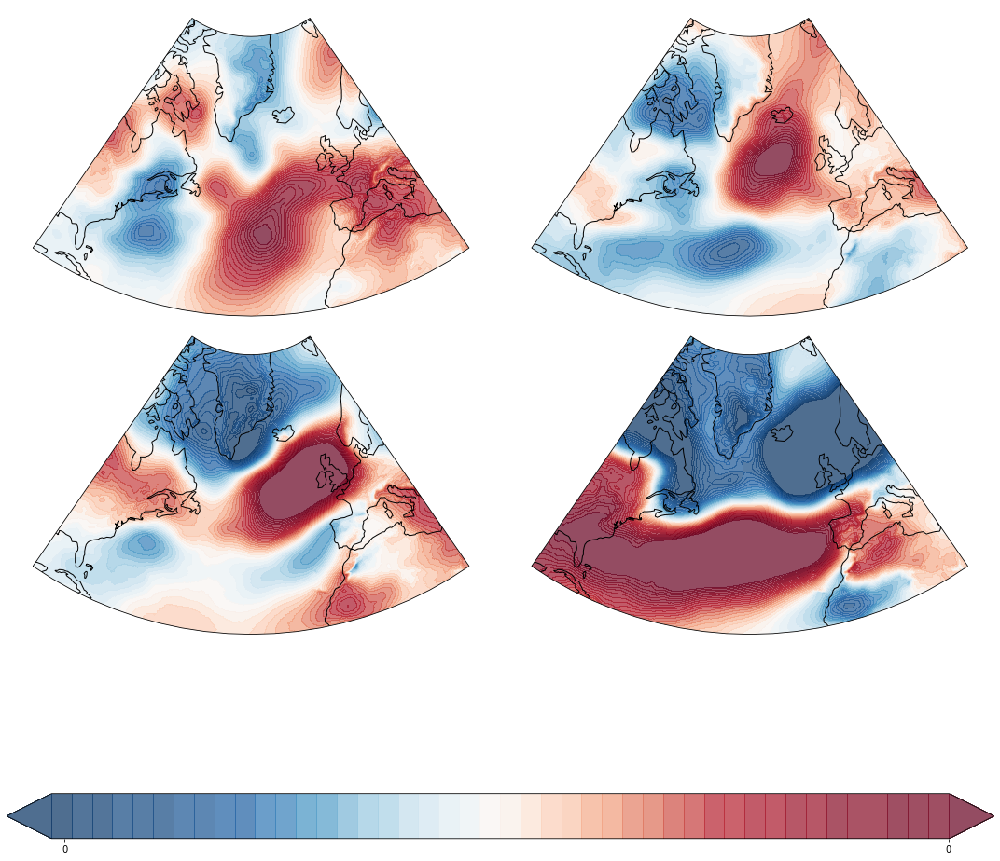

In [36]:
estimator = load_estimator(f'../models/{season}/SLP_vae/gmm_model_ch.pkl')
probas, elbo, means, covariances, _ = extract_regimes(reduced_anomaly, method='gmm', nb_regimes = 5, estimator = estimator)
labels = np.argmax(probas, axis=1)
plot_regimes(pivot_anomaly, labels)

### SLP PCA 3PCs

In [8]:
get_statistics(f'../models/{season}/SLP_pca_3pcs', train_X, test_X)

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	func:'get_statistics' took: 274.9143 sec


,Number of Clusters,BIC,Silhouette Score,Calinski Harabsz Index,Inertia
bayesian_gmm_model_bic.pkl,4,-18509.748028,0.252532,285.354308,4.908228e+08
bayesian_gmm_model_ch.pkl,4,-18681.006210,0.187633,228.353489,3.650631e+08
bayesian_gmm_model_score.pkl,6,-18536.447811,0.252532,285.354308,4.908156e+08
bayesian_gmm_model_silhouette.pkl,5,-18957.498365,0.138768,154.426490,3.977971e+08
gmm_model_bic.pkl,4,-18709.810694,0.051400,94.581103,4.877526e+08
gmm_model_ch.pkl,4,-18730.761329,0.176593,215.461337,3.763433e+08
gmm_model_score.pkl,7,-18574.251267,0.055073,101.391074,4.844566e+08
gmm_model_silhouette.pkl,4,-18757.275873,0.170202,196.508016,3.931120e+08
kmeans_model_bic.pkl,4,-18526.881893,0.225683,285.831574,3.141977e+08
kmeans_model_ch.pkl,4,-18526.779821,0.225094,285.658110,3.142452e+08


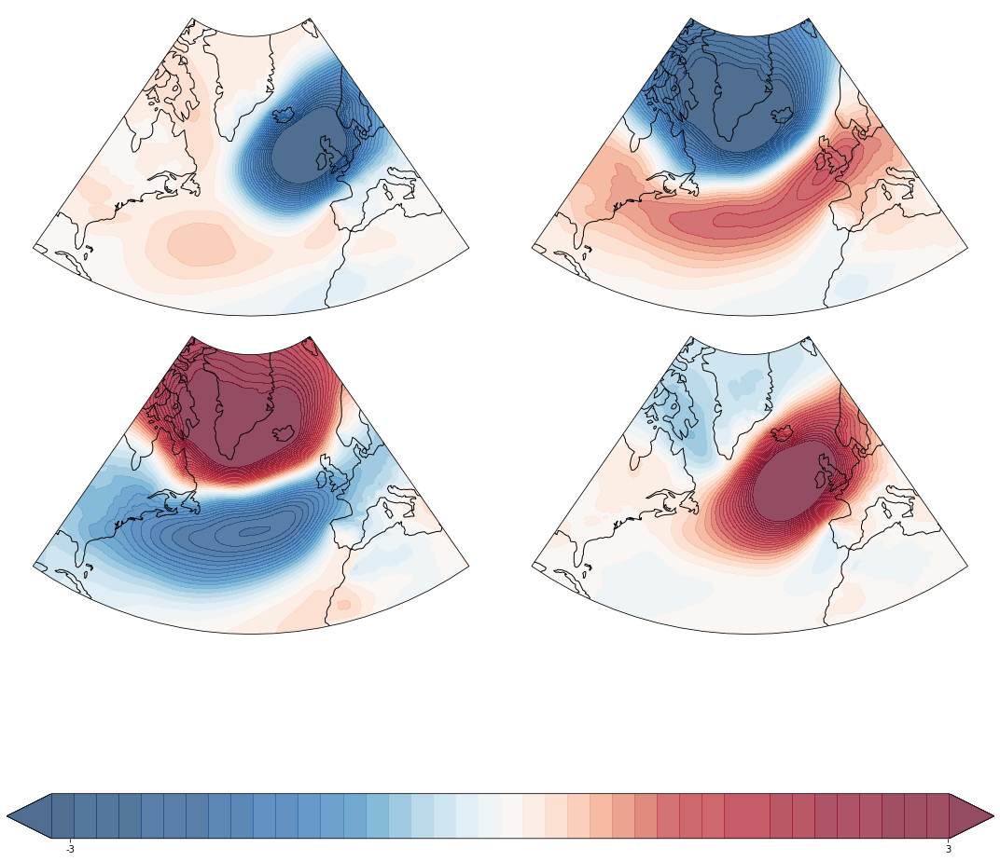

In [9]:
estimator = load_estimator(f'../models/{season}/SLP_pca_3pcs/kmeans_model_bic.pkl')
outputs = extract_regimes(reduced_anomaly, method='kmeans', nb_regimes = None, estimator = estimator)
labels, inertias, _ = outputs
plot_regimes(pivot_anomaly, labels)

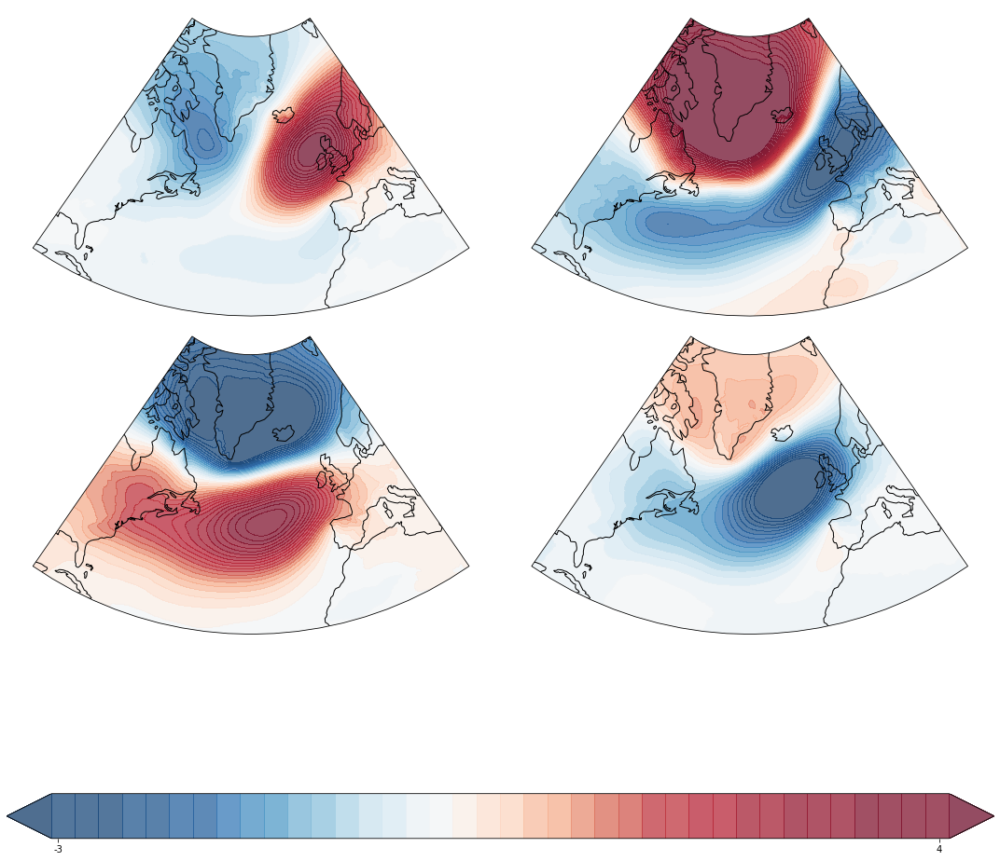

In [6]:
estimator = load_estimator(f'../models/{season}/SLP_pca_3pcs/gmm_model_ch.pkl')
probas, elbo, means, covariances, _ = extract_regimes(reduced_anomaly, method='gmm', nb_regimes = 5, estimator = estimator)
labels = np.argmax(probas, axis=1)
plot_regimes(pivot_anomaly, labels)

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



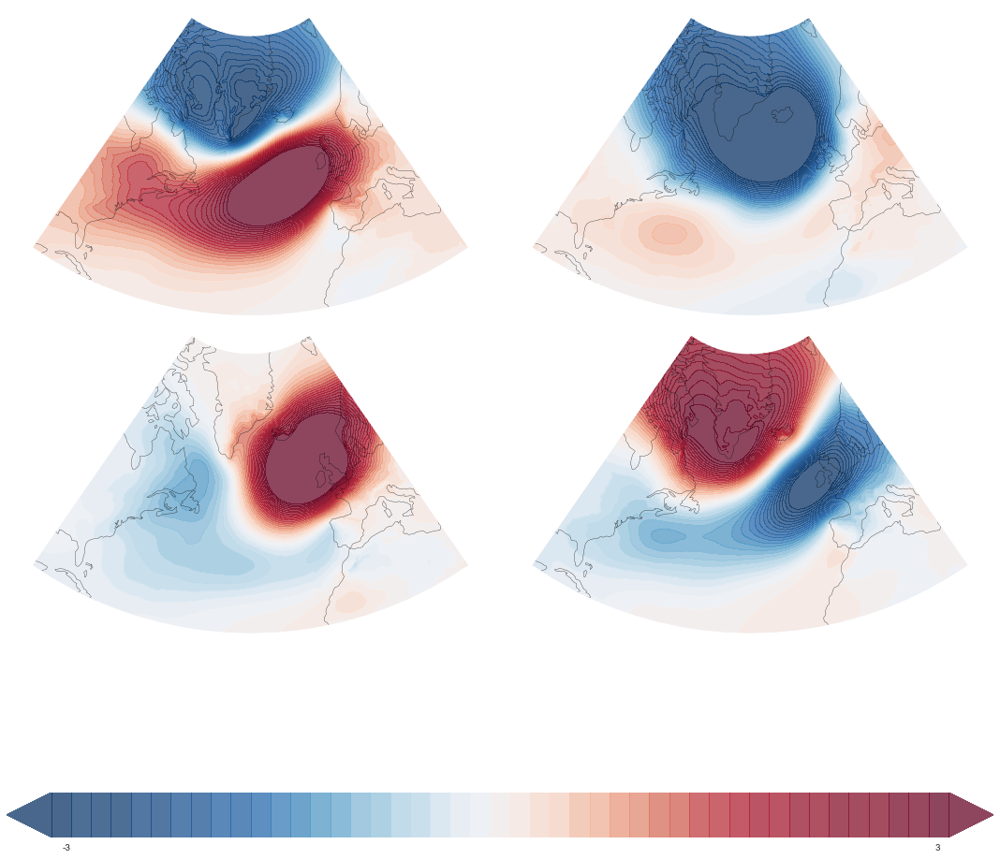

In [48]:
estimator = load_estimator(f'../models/{season}/SLP_pca_3pcs/bayesian_gmm_model_ch.pkl')
probas, elbo, means, covariances, _ = extract_regimes(reduced_anomaly, method='bayesian_gmm', nb_regimes = 5, estimator = estimator)
labels = np.argmax(probas, axis=1)
plot_regimes(pivot_anomaly, labels)

### SLP PCA 4PCs

In [8]:
get_statistics(f'../models/{season}/SLP_pca_4pcs', train_X, test_X)

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	func:'get_statistics' took: 100.9811 sec


,Number of Clusters,BIC,Silhouette Score,Calinski Harabsz Index,Inertia
bayesian_gmm_model_bic.pkl,4,-24682.109888,0.134464,143.912007,5.269750e+08
bayesian_gmm_model_ch.pkl,7,-24771.023478,0.093491,108.124686,4.363982e+08
bayesian_gmm_model_score.pkl,6,-24736.136690,0.100932,124.043995,4.461961e+08
bayesian_gmm_model_silhouette.pkl,6,-24530.835640,0.057509,108.364425,6.086337e+08
gmm_model_bic.pkl,4,-24626.049809,0.049785,83.867090,5.887727e+08
gmm_model_ch.pkl,4,-24599.091770,0.152084,162.768671,4.964855e+08
gmm_model_score.pkl,4,-24596.070892,0.075230,114.117307,5.454202e+08
gmm_model_silhouette.pkl,4,-24576.503272,0.134265,155.993510,5.011237e+08
kmeans_model_bic.pkl,4,-24374.410333,0.178537,208.694948,4.293524e+08
kmeans_model_ch.pkl,4,-24374.410335,0.178537,208.694948,4.293524e+08


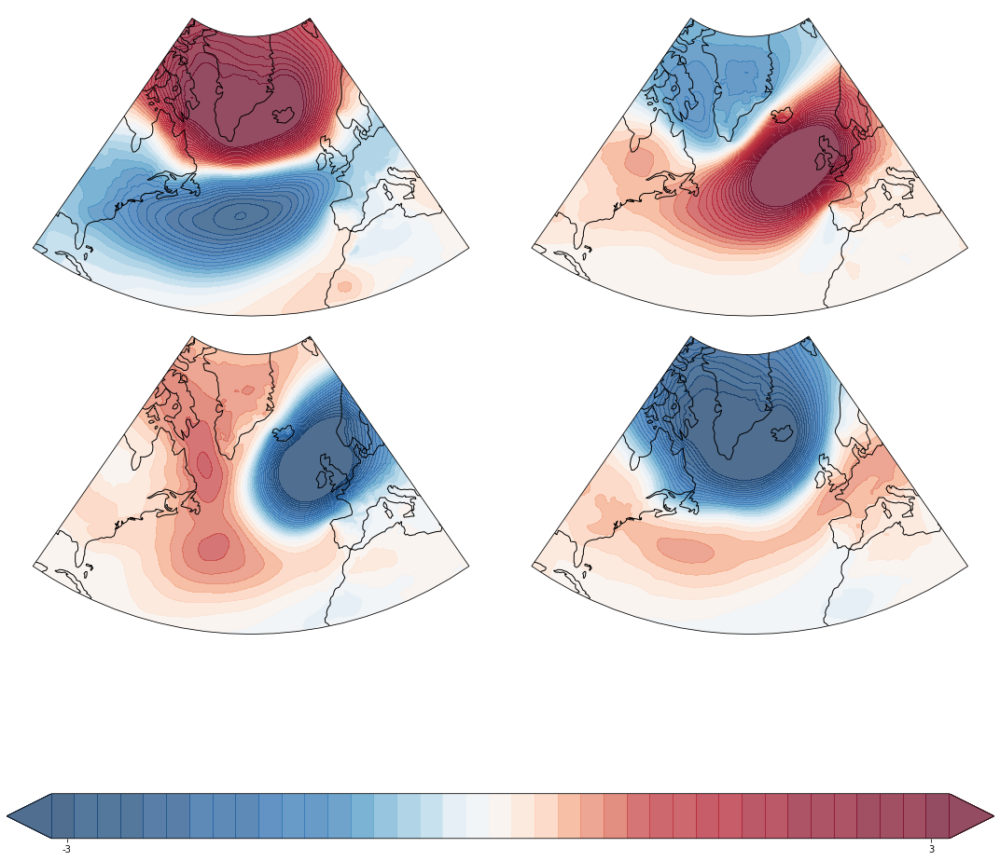

In [12]:
estimator = load_estimator(f'../models/{season}/SLP_pca_4pcs/kmeans_model_ch.pkl')
outputs = extract_regimes(reduced_anomaly, method='kmeans', nb_regimes = None, estimator = estimator)
labels, inertias, _ = outputs
plot_regimes(pivot_anomaly, labels)

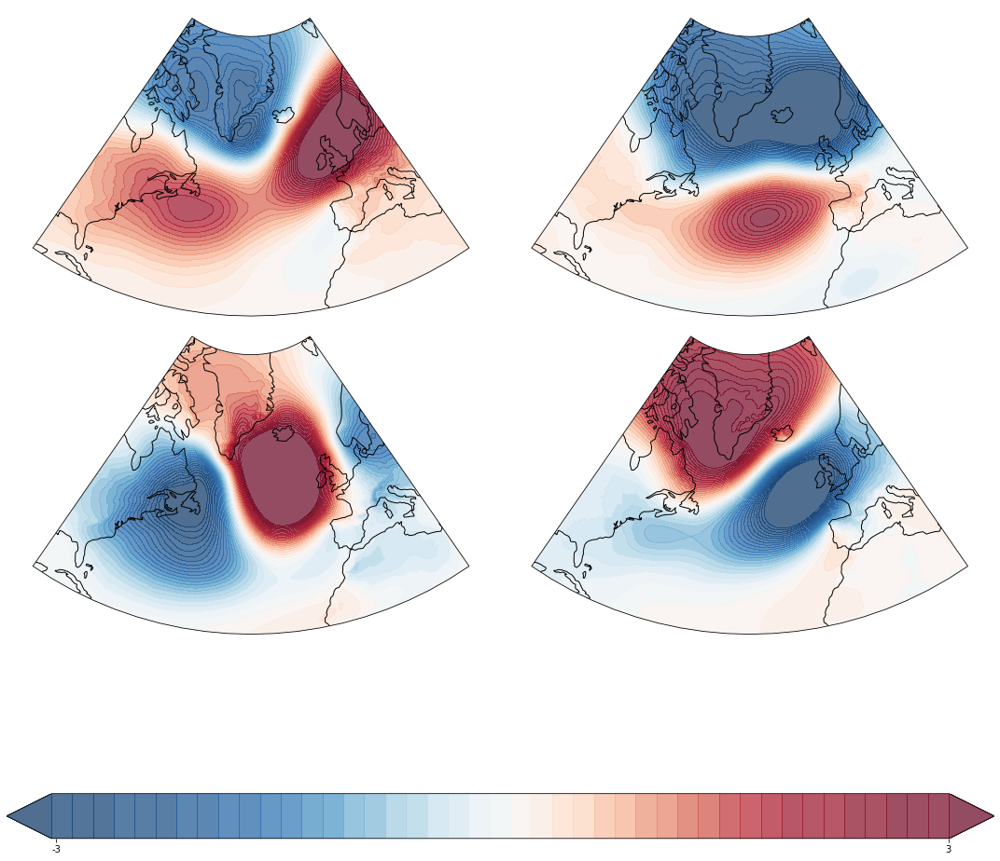

In [13]:
estimator = load_estimator(f'../models/{season}/SLP_pca_4pcs/gmm_model_silhouette.pkl')
probas, elbo, means, covariances, _ = extract_regimes(reduced_anomaly, method='gmm', nb_regimes = 5, estimator = estimator)
labels = np.argmax(probas, axis=1)
plot_regimes(pivot_anomaly, labels)

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



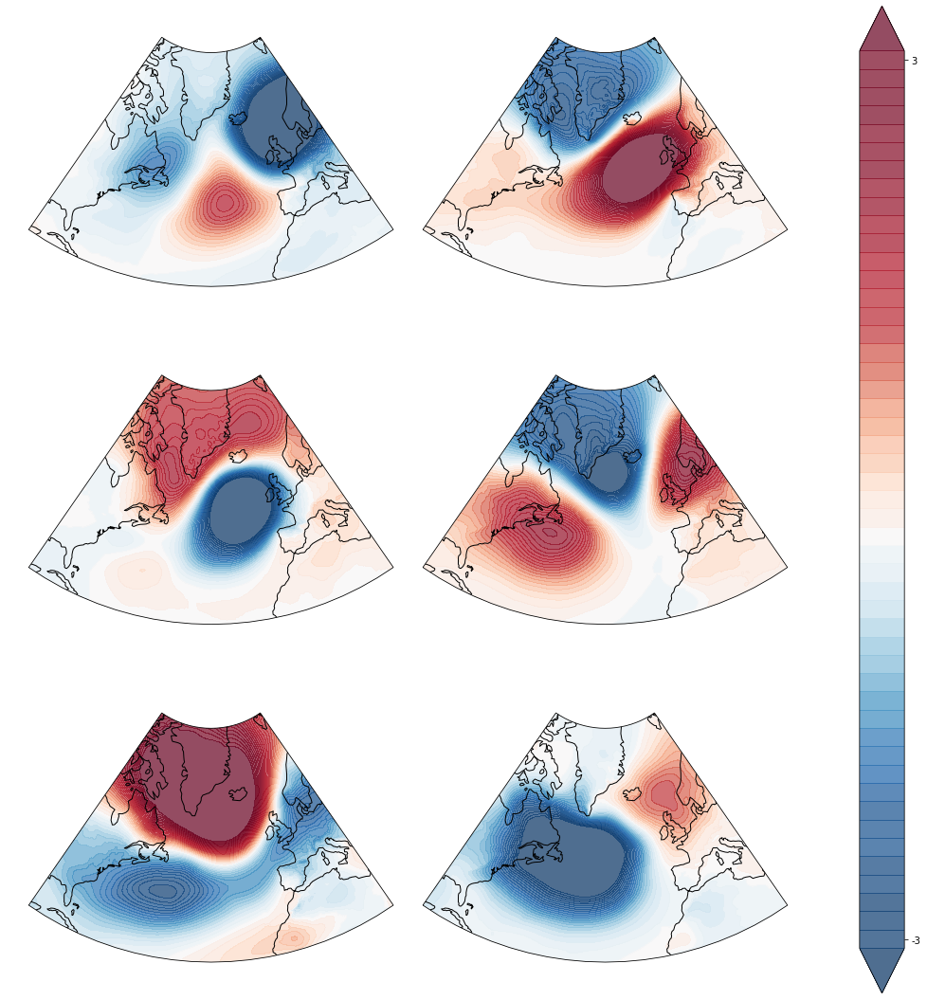

In [14]:
estimator = load_estimator(f'../models/{season}/SLP_pca_4pcs/bayesian_gmm_model_score.pkl')
probas, elbo, means, covariances, _ = extract_regimes(reduced_anomaly, method='bayesian_gmm', nb_regimes = 5, estimator = estimator)
labels = np.argmax(probas, axis=1)
plot_regimes(pivot_anomaly, labels)

### SLP PCA 5PCs

In [10]:
get_statistics(f'../models/{season}/SLP_pca_5pcs', train_X, test_X)

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



	func:'get_statistics' took: 195.0739 sec


,Number of Clusters,BIC,Silhouette Score,Calinski Harabsz Index,Inertia
bayesian_gmm_model_bic.pkl,4,-30386.606412,0.077940,80.971848,6.759361e+08
bayesian_gmm_model_ch.pkl,7,-30626.888271,0.062452,82.517585,5.480507e+08
bayesian_gmm_model_score.pkl,5,-30519.056498,0.079749,100.018222,5.886805e+08
bayesian_gmm_model_silhouette.pkl,4,-30536.373078,0.078765,103.362672,6.425938e+08
gmm_model_bic.pkl,4,-30459.387786,0.096408,108.004178,6.300870e+08
gmm_model_ch.pkl,4,-30483.593326,0.093200,98.197565,6.480196e+08
gmm_model_score.pkl,4,-30522.172352,0.085273,97.852955,6.417405e+08
gmm_model_silhouette.pkl,4,-30480.908243,0.091635,98.647466,6.468500e+08
kmeans_model_bic.pkl,4,-30164.645323,0.148456,169.023357,5.295921e+08
kmeans_model_ch.pkl,4,-30164.645323,0.148456,169.023357,5.295921e+08


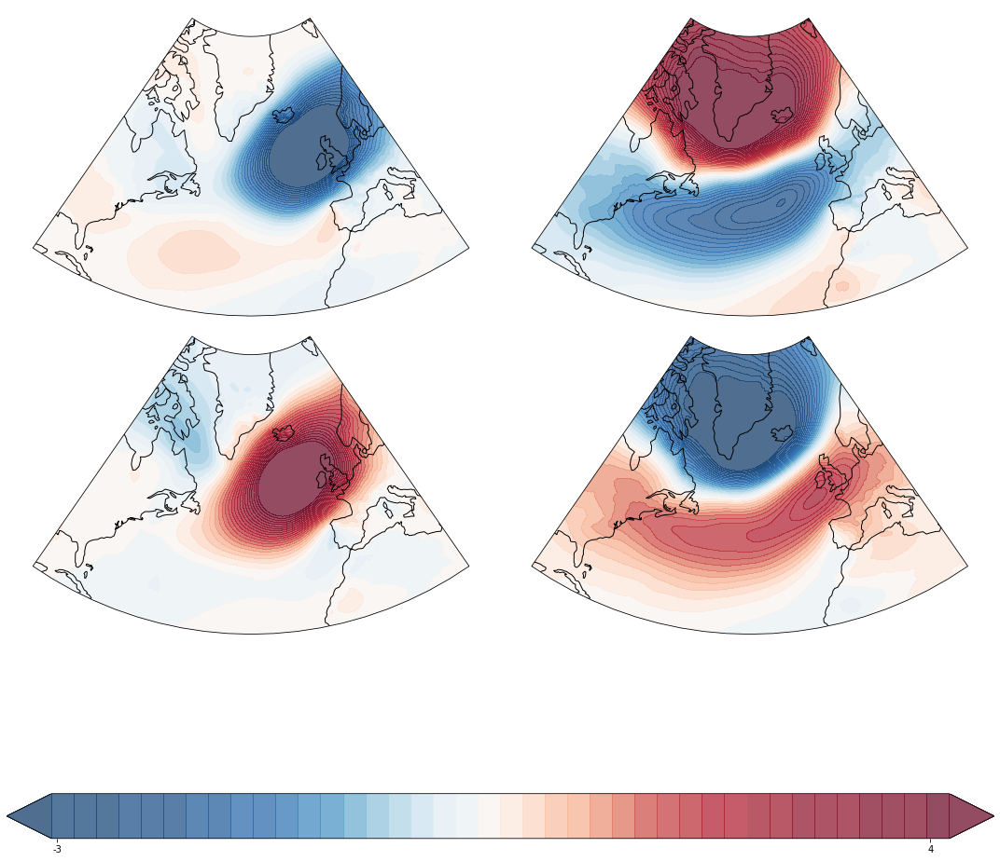

In [15]:
estimator = load_estimator(f'../models/{season}/SLP_pca_5pcs/kmeans_model_ch.pkl')
outputs = extract_regimes(reduced_anomaly, method='kmeans', nb_regimes = None, estimator = estimator)
labels, inertias, _ = outputs
labels_text = {0: "AL", 1: "SB", 2: "NAO-", 3: "Zonal"}
labels = list(map(lambda x: labels_text[x], labels))
plot_regimes(pivot_anomaly, labels)

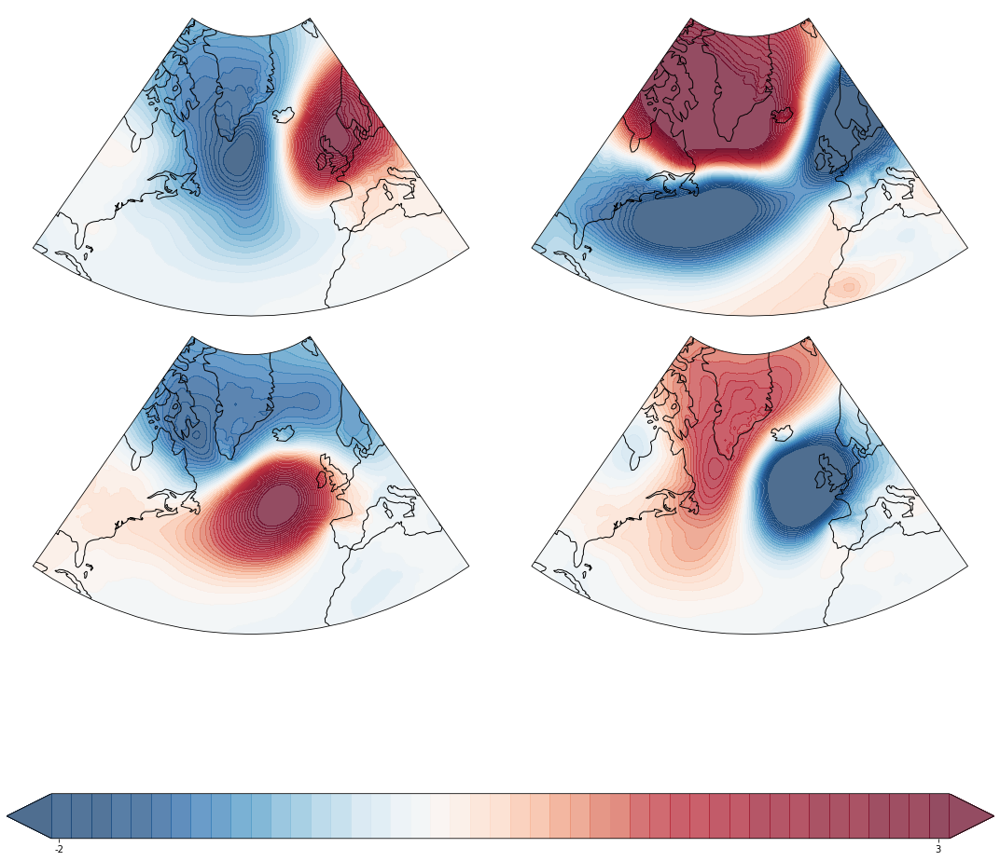

In [13]:
estimator = load_estimator(f'../models/{season}/SLP_pca_5pcs/gmm_model_bic.pkl')
probas, elbo, means, covariances, _ = extract_regimes(reduced_anomaly, method='gmm', nb_regimes = 5, estimator = estimator)
labels = np.argmax(probas, axis=1)
plot_regimes(pivot_anomaly, labels)

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



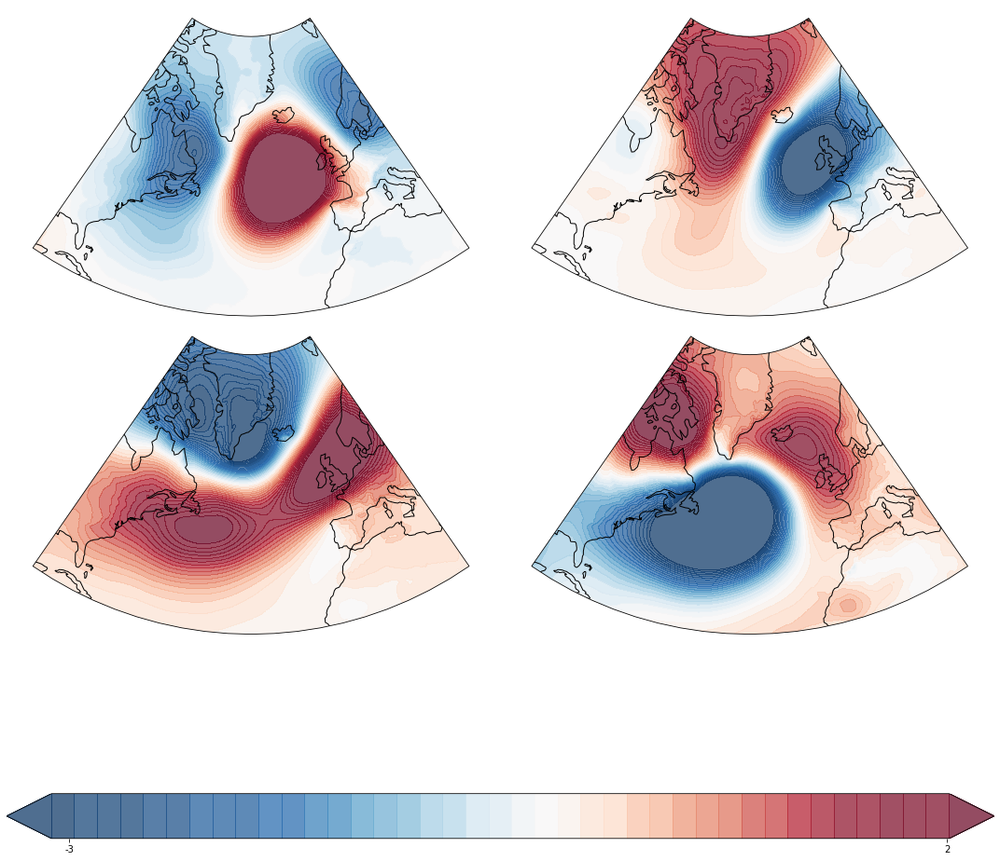

In [14]:
estimator = load_estimator(f'../models/{season}/SLP_pca_5pcs/bayesian_gmm_model_silhouette.pkl')
probas, elbo, means, covariances, _ = extract_regimes(reduced_anomaly, method='bayesian_gmm', nb_regimes = 5, estimator = estimator)
labels = np.argmax(probas, axis=1)
plot_regimes(pivot_anomaly, labels)

###

In [5]:
import sys
sys.path.append('../src/')
from dashboard.utils.data import *
from dashboard.utils.plotting import *
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [39]:
reduced_anomaly = reduce_dim(pivot_anomaly, method = 'PCA', exp_variance = .9)

Number of days: 3956, Density of the grid: 22 cells
	func:'reduce_dim' took: 88.0500 sec


In [40]:
estimator = load_estimator(f'../models/{season}/SLP/kmeans_model_ch.pkl')
outputs = extract_regimes(reduced_anomaly, method='kmeans', nb_regimes = None, estimator = estimator)
labels, inertias, _ = outputs
clusters = {0: 'Zonal', 1: 'SB', 2:'NAO-', 3: 'AL'}
one_hot = np.zeros((labels.size, labels.max()+1))
one_hot[np.arange(labels.size),labels] = 1
predictions_kmeans = pd.DataFrame(one_hot, columns = clusters.values(), index = dt.time.values)
predictions_kmeans = predictions_kmeans.reindex(columns = sorted(predictions_kmeans.columns))
predictions_kmeans.columns = pd.MultiIndex.from_product([['K-Means'], predictions_kmeans.columns])

In [41]:
reduced_anomaly = reduce_dim(pivot_anomaly, method = 'PCA', exp_variance = 3)

Number of days: 3956, Density of the grid: 3 cells
	func:'reduce_dim' took: 6.3909 sec


In [65]:
estimator = load_estimator(f'../models/{season}/SLP_pca_3pcs/gmm_model_ch.pkl')
outputs = extract_regimes(reduced_anomaly, method='gmm', nb_regimes = None, estimator = estimator)
probas, elbo, means, covariances, _ = outputs
clusters = {0: 'SB', 1: 'NAO-', 2:'Zonal', 3: 'AL'}
predictions_gmm1 = pd.DataFrame(probas, columns = clusters.values(), index = dt.time.values)
predictions_gmm1 = predictions_gmm1.reindex(columns = sorted(predictions_gmm1.columns))
predictions_gmm1.columns = pd.MultiIndex.from_product([['GMM1'], predictions_gmm1.columns])

In [66]:
estimator = load_estimator(f'../models/{season}/SLP_pca_3pcs/gmm_model_silhouette.pkl')
outputs = extract_regimes(reduced_anomaly, method='gmm', nb_regimes = None, estimator = estimator)
probas, elbo, means, covariances, _ = outputs
clusters = {0: 'SB', 1: 'NAO-', 2:'Zonal', 3: 'AL'}
predictions_gmm2 = pd.DataFrame(probas, columns = clusters.values(), index = dt.time.values)
predictions_gmm2 = predictions_gmm2.reindex(columns = sorted(predictions_gmm2.columns))
predictions_gmm2.columns = pd.MultiIndex.from_product([['GMM2'], predictions_gmm2.columns])

In [57]:
estimator = load_estimator(f'../models/{season}/SLP_pca_3pcs/bayesian_gmm_model_ch.pkl')
outputs = extract_regimes(reduced_anomaly, method='bayesian_gmm', nb_regimes = None, estimator = estimator)
probas, elbo, means, covariances, _ = outputs
clusters = {0: 'Zonal', 1: 'AL', 2:'SB', 3: 'NAO-'}
predictions_bayesiangmm = pd.DataFrame(probas, columns = clusters.values(), index = dt.time.values)
predictions_bayesiangmm = predictions_bayesiangmm.reindex(columns = sorted(predictions_bayesiangmm.columns))
predictions_bayesiangmm.columns = pd.MultiIndex.from_product([['Bayesian-GMM'], predictions_bayesiangmm.columns])

c:\python36\lib\site-packages\sklearn\mixture\_base.py:269: ConvergenceWarning:

Initialization 5 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.



In [68]:
predictions = pd.concat([predictions_kmeans, predictions_bayesiangmm, predictions_gmm1, predictions_gmm2], axis = 1)
predictions

K-Means                 Bayesian-GMM                                \
                AL NAO-   SB Zonal           AL      NAO-        SB     Zonal   
1979-06-01     0.0  1.0  0.0   0.0     0.256717  0.175512  0.547087  0.020684   
1979-06-02     0.0  1.0  0.0   0.0     0.182412  0.129053  0.670964  0.017572   
1979-06-03     0.0  0.0  1.0   0.0     0.159919  0.107954  0.706326  0.025801   
1979-06-04     0.0  0.0  1.0   0.0     0.077812  0.026229  0.772768  0.123192   
1979-06-05     0.0  0.0  1.0   0.0     0.046592  0.022792  0.702141  0.228474   
...            ...  ...  ...   ...          ...       ...       ...       ...   
2021-08-27     0.0  0.0  1.0   0.0     0.043602  0.014722  0.669774  0.271902   
2021-08-28     0.0  0.0  1.0   0.0     0.007045  0.023974  0.885515  0.083466   
2021-08-29     0.0  0.0  1.0   0.0     0.007537  0.054052  0.907332  0.031080   
2021-08-30     0.0  1.0  0.0   0.0     0.017979  0.246933  0.730209  0.004879   
2021-08-31     0.0  1.0  0.0   0.0     0.007543  0.398763  0.592683  0.001010   

                GMM1                                    GMM2            \
                  AL      NAO-        SB     Zonal        AL      NAO-   
1979-06-01  0.523602  0.009350  0.451133  0.015915  0.539734  0.082071   
1979-06-02  0.363503  0.004356  0.622520  0.009621  0.410619  0.038426   
1979-06-03  0.286866  0.003985  0.696452  0.012698  0.343578  0.031693   
1979-06-04  0.085125  0.001834  0.848052  0.064990  0.125879  0.017546   
1979-06-05  0.062339  0.002770  0.800072  0.134820  0.069543  0.022998   
...              ...       ...       ...       ...       ...       ...   
2021-08-27  0.046201  0.001467  0.787764  0.164569  0.060109  0.014663   
2021-08-28  0.030092  0.009843  0.888827  0.071238  0.020495  0.033594   
2021-08-29  0.046673  0.029203  0.898427  0.025696  0.029351  0.069541   
2021-08-30  0.126930  0.142406  0.727829  0.002836  0.121058  0.205588   
2021-08-31  0.073310  0.328910  0.597113  0.000668  0.093628  0.282860   

                                
                  SB     Zonal  
1979-06-01  0.353969  0.024227  
1979-06-02  0.536267  0.014689  
1979-06-03  0.605716  0.019013  
1979-06-04  0.777872  0.078703  
1979-06-05  0.769717  0.137742  
...              ...       ...  
2021-08-27  0.763174  0.162054  
2021-08-28  0.894188  0.051723  
2021-08-29  0.881626  0.019482  
2021-08-30  0.670160  0.003194  
2021-08-31  0.622896  0.000616  

[3956 rows x 16 columns]

In [69]:
targets = load_MF_targets.__wrapped__(season = 'Summer')
targets = targets.xs('Distance', axis = 1, level = 0).drop('Prediction', axis = 1)
targets = targets.apply(lambda x: pd.Series(list(map(lambda y: int(y== np.min(x)), x))), axis = 1)
targets = targets.reindex(columns = sorted(targets.columns))
targets

,0,1,2,3
1981-06-01,1,0,0,0
1981-06-02,1,0,0,0
1981-06-03,1,0,0,0
1981-06-04,1,0,0,0
1981-06-05,1,0,0,0
...,...,...,...,...
2020-08-27,0,1,0,0
2020-08-28,0,1,0,0
2020-08-29,0,1,0,0
2020-08-30,1,0,0,0


In [70]:
predictions.mean(0), targets.mean(0)

(K-Means       AL       0.243933
               NAO-     0.223711
               SB       0.273003
               Zonal    0.259353
 Bayesian-GMM  AL       0.218036
               NAO-     0.323991
               SB       0.228391
               Zonal    0.229582
 GMM1          AL       0.287400
               NAO-     0.156816
               SB       0.281446
               Zonal    0.274339
 GMM2          AL       0.225409
               NAO-     0.273590
               SB       0.288975
               Zonal    0.212026
 dtype: float64,
 0    0.239402
 1    0.258967
 2    0.259239
 3    0.242663
 dtype: float64)

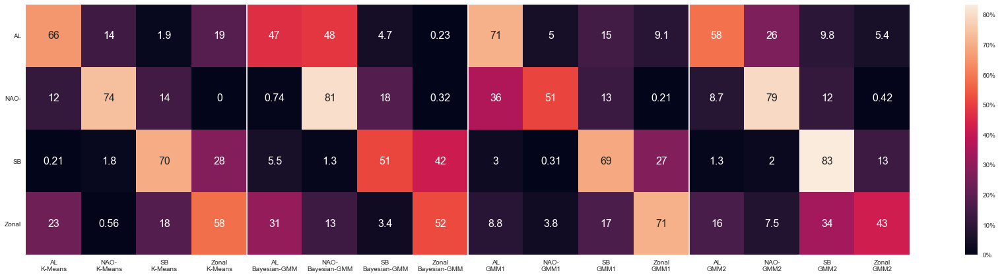

In [74]:
models = predictions.columns.get_level_values(0).unique()
conf_matrix = np.concatenate(
        [confusion_matrix(
            np.argmax(targets.loc[targets.index.intersection(predictions.index)].values, axis=1),
            np.argmax(predictions.loc[targets.index.intersection(predictions.index)].\
                      xs(model, level=0, axis=1).values,axis=1),
            normalize='true') * 100
         for model in models
         ], axis=1)

fig, ax = plt.subplots(1, 1, figsize=(7.5*len(models), 7))
sns.heatmap(conf_matrix, annot=True, ax=ax, cbar_kws={'format': '%.0f%%'}, annot_kws={"size": 16},
            yticklabels=sorted(np.unique(predictions.columns.get_level_values(1))),
            xticklabels=["\n".join(list(e)[::-1]) for e in
                         list(itertools.product(
                             models,
                             sorted(np.unique(predictions.columns.get_level_values(1)))))],
            )
ax.tick_params(axis='x', rotation=0)
ax.tick_params(axis='y', rotation=0)
for i in range(conf_matrix.shape[0], conf_matrix.shape[1] + 1, conf_matrix.shape[0]):
    ax.axvline(i, color='white')
plt.show()

In [75]:
predictions.to_csv('W:/UK/Research/Private/WEATHER/STAGE_ABALDO/scripts/predictions/predictions_summer.csv')